# 📊 Optical Flow and Tomography Parameter Optimization
This notebook prepares perturbed tomographic data and reconstructs images with parameter optimization. It includes:
- Simulation setup
- Forward model with perturbations
- Optical flow estimation
- Parameter updates via alternating minimization


# 📦 Imports and Utilities

In [210]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import astra
from trips.utilities.phantoms import *
from venv import create
import pylops
from trips.solvers.GKS import *
from trips.solvers.MMGKS import *
from trips.solvers.Tikhonov import *
from trips.solvers.tSVD import *
from trips.utilities.helpers import *
from trips.utilities.operators import *

from typing import Optional, Dict, Any, List
from skimage.transform import resize
from datetime import datetime
import numpy as np 
from scipy.optimize import newton, minimize
import scipy.linalg as la
import scipy.optimize as op
from pylops import Identity, LinearOperator

import pickle
from typing import List, Tuple, Optional
Tomo = Tomography()

settings


In [211]:
def discrepancy_principle(Q, A, L, b, delta = None, eta = 1.01, **kwargs):
    L_norm = np.linalg.norm(L, ord=2)
    if L_norm == 0:
        raise ValueError("L must not be the zero matrix")

    L = L / (L_norm + 1e-16) # avoid division by zero

    if not ( isinstance(delta, float) or isinstance(delta, int)):
        raise Exception("""A value for the noise level delta was not provided and the discrepancy principle cannot be applied. 
                    Please supply a value of delta based on the estimated noise level of the problem, or choose the regularization parameter according to gcv.""")
    
    explicitProj = kwargs['explicitProj'] if ('explicitProj' in kwargs) else False

    if 'dptype' in kwargs:
        dptype = kwargs['dptype']
    else:
        dptype = 'tikhonov'

    if dptype == 'tikhonov':  
        bfull = b
        b = Q.T@b
        if is_identity(L):
            Anew = A
            bnew = b
        else:
            UL, SL, VL = la.svd(L)
            if L.shape[0] >= L.shape[1] and SL[-1] != 0:
                Anew = A@(VL.T@np.diag((SL)**(-1)))
                bnew = b
            elif L.shape[0] >= L.shape[1] and SL[-1] == 0:
                zeroind = np.where(SL == 0)
                W = VL[zeroind,:].reshape((-1,1))
                AW = A@W
                Q_AW, R_AW = np.linalg.qr(AW, mode='reduced')
                Q_LT, R_LT = np.linalg.qr(L.T, mode='reduced')
                LAwpinv = (np.eye(L.shape[1]) - (W@np.linalg.inv(R_AW)@Q_AW.T@A))@Q_LT@np.linalg.inv(R_LT.T)
                Anew = A@LAwpinv
                xnull = W@np.linalg.inv(R_AW)@Q_AW.T@b
                bnew = b - A@xnull
            elif (L.shape[0] < L.shape[1]):
                W = VL[L.shape[0]-L.shape[1]:,:].T
                AW = A@W
                Q_AW, R_AW = np.linalg.qr(AW, mode='reduced')
                Q_LT, R_LT = np.linalg.qr(L.T, mode='reduced')
                LAwpinv = (np.eye(L.shape[1]) - (W@np.linalg.inv(R_AW)@Q_AW.T@A))@Q_LT@np.linalg.inv(R_LT.T)
                Anew = A@LAwpinv
                xnull = W@np.linalg.inv(R_AW)@Q_AW.T@b
                bnew = b - A@xnull

        U, S, V = la.svd(Anew)
        singular_values = S**2
        bhat = U.T @ bnew
        if Anew.shape[0] > Anew.shape[1]:
            singular_values = np.append(singular_values.reshape((-1,1)), np.zeros((Anew.shape[0]-Anew.shape[1],1)))
            if explicitProj:
                testzero = la.norm(bhat[Anew.shape[1]-Anew.shape[0]:,:])**2 + la.norm(bfull - Q@b)**2 - (eta*delta)**2 # this is OK but need reorthogonalization
            else:
                testzero = la.norm(bhat[Anew.shape[1]-Anew.shape[0]:,:])**2 - (eta*delta)**2
        else:
            testzero = la.norm(bfull - Q@b)**2 - (eta*delta)**2
        singular_values.shape = (singular_values.shape[0], 1)
    
        #beta = 1e-8
        beta = 1.0 / (np.max(singular_values) + 1e-16)

        iterations = 0

        if testzero < 0:
            while (iterations < 30) or ((iterations <= 100) and (np.abs(alpha) < 10**(-16))):
                zbeta = (((singular_values*beta + 1)**(-1))*bhat.reshape((-1,1))).reshape((-1,1))
                if explicitProj:
                    f = la.norm(zbeta)**2 + la.norm(bfull - Q@b)**2 - (eta*delta)**2 # this is OK but need reorthogonalization
                else:
                    f = la.norm(zbeta)**2 - (eta*delta)**2
                wbeta = (((singular_values*beta + 1)**(-1))*zbeta).reshape((-1,1))
                f_prime = 2/beta*zbeta.T@(wbeta - zbeta)

                beta_new = beta - f/f_prime

                if abs(beta_new - beta) < 10**(-12)* beta:
                    break

                beta = beta_new
                alpha = 1/beta_new[0,0]

                iterations += 1
        else:
            alpha = 0


    alpha = alpha / (L_norm**2 + 1e-16) # rescale alpha to account for scaling of L
    return alpha


In [212]:
def gcv_numerator(reg_param, Q_A, R_A, R_L, b, **kwargs):

    variant = kwargs['variant'] if ('variant' in kwargs) else 'standard'

    # the observation term:

    R_A_2 = R_A.T @ R_A

    R_A_2 = R_A_2.todense() if isinstance(R_A_2, LinearOperator) else R_A_2

    # The regularizer term:

    R_L_2 = (R_L.T @ R_L)
    
    R_L_2 = R_L_2.todense() if isinstance(R_L_2, LinearOperator) else R_L_2

    # the inverse term:

    inverted = la.solve( ( R_A_2 + reg_param * R_L_2), (R_A.T @ Q_A.T @ b) )

    # return np.sqrt((np.linalg.norm( R_A @ inverted - Q_A.T @ b ))**2 + np.linalg.norm(b - Q_A@(Q_A.T@b))**2)
    if variant == 'modified':
        return ((np.linalg.norm( R_A @ inverted - Q_A.T @ b ))**2 + np.linalg.norm(b - Q_A@(Q_A.T@b))**2)
    else:
        return (np.linalg.norm( R_A @ inverted - Q_A.T @ b ))**2

def gcv_denominator(reg_param, R_A, R_L, b, **kwargs):

    variant = kwargs['variant'] if ('variant' in kwargs) else 'standard'
    # print(variant)
    # the observation term:

    R_A_2 = R_A.T @ R_A

    R_A_2 = R_A_2.todense() if isinstance(R_A_2, LinearOperator) else R_A_2

    # The regularizer term:

    R_L_2 = (R_L.T @ R_L)

    R_L_2 = R_L_2.todense() if isinstance(R_L_2, LinearOperator) else R_L_2

    inverted = la.solve( ( R_A_2 + reg_param * R_L_2), R_A.T )

    if variant == 'modified':
       m = kwargs['fullsize'] # probably this can be b.size -- NOT FOR HYBRID SOLVERS!
       # trace_term = (m - R_A.shape[1]) - np.trace(R_A @ inverted) # b.size - np.trace(R_A @ inverted) # this is defined with respect to the projected quantities 
       trace_term = m - np.trace(R_A @ inverted) # b.size - np.trace(R_A @ inverted) # this is defined with respect to the projected quantities 
    else:
        # in this way works even if we revert to the fully projected pb (call with Q_A.T@b)
        # trace_term = b.size - np.trace(R_A @ inverted) # this is defined with respect to the projected quantities
        trace_term = R_A.shape[0] - np.trace(R_A @ inverted) # this is defined with respect to the projected quantities
    
    return trace_term**2

def generalized_crossvalidation_2(Q_A, R_A, R_L, b, **kwargs):
    #print("Computing GCV optimal regularization parameter...")
    R_L_norm = 1 # np.linalg.norm(R_L, ord=2)
    R_L = R_L / R_L_norm
    if 'tol' in kwargs:
        tol = kwargs['tol']
    else:
        tol = 10**(-12)

    if 'gcvtype' in kwargs:
        gcvtype = kwargs['gcvtype']
    else:
        gcvtype = 'tikhonov'
    
    # function to minimize
    if gcvtype == 'tikhonov':    
        gcv_func = lambda reg_param: gcv_numerator(reg_param, Q_A, R_A, R_L, b) / gcv_denominator(reg_param, R_A, R_L, b, **kwargs)
        lambdah = op.fminbound(func = gcv_func, x1 = 1e-09, x2 = 100, args=(), xtol=1e-12, maxfun=1000, full_output=0, disp=0) ## should there be tol here?
    elif gcvtype == 'tsvd':
        m = Q_A.shape[0]
        n = R_L.shape[1]
        gcv_vals = []
        bhat = Q_A.T@b
        f = np.ones((m,1))
        for i in range(n):
            f[n-(i+1),] = 0
            fvar = np.concatenate((1 - f[:n,], f[n:,]))
            coeff = (fvar*bhat)**2
            gcv_numerator_tsvd = np.sum(coeff)
            gcv_denominator_tsvd = (m - (n-(i+1)))**2
            gcv_vals.append(gcv_numerator_tsvd/gcv_denominator_tsvd)   
        lambdah = n - (gcv_vals.index(min(gcv_vals))+1)
    elif gcvtype == 'tgsvd':
        m = Q_A.shape[0]
        n = R_L.shape[1]
        p = R_L.shape[0]
        gcv_vals = []
        bhat = Q_A.T@b
        coeff = np.square(bhat)
        for i in range(n):
            coeff[n-(i+1),] = 0
            gcv_numerator_tgsvd = np.sum(coeff)
            gcv_denominator_tgsvd = (n-(i+1) - (n-p))**2
            gcv_vals.append(gcv_numerator_tgsvd/gcv_denominator_tgsvd)   
        lambdah = gcv_vals.index(min(gcv_vals))
    lambdah = lambdah / (R_L_norm**2)
    return lambdah#!/usr/bin/env python


In [213]:
import numpy as np

def l_curve(A, L, b, plot=False):
    """
    Finds the regularization parameter alpha using the L-curve corner.
    A: The projected system matrix (e.g., R_A)
    L: The projected regularization matrix (e.g., R_L)
    b: The projected right hand side (e.g., Q_A.T @ weighted_b)
    """
    # 1. Transform to standard form via SVD/GSVD or simplify 
    # For a simple version, we'll use a range of alphas
    alphas = np.logspace(-10, 2, 100)

    L_norm = np.linalg.norm(L, ord=2)
    L = L / L_norm
    
    residual_norms = []
    solution_norms = []

    # Pre-calculate SVD for speed if matrices are small (which they are in RMMGKS)
    # We solve: min ||Ax - b||^2 + alpha ||Lx||^2
    # This is equivalent to solving the normal equations:
    # (A.T @ A + alpha * L.T @ L) x = A.T @ b
    
    AtA = A.T @ A
    LtL = L.T @ L
    Atb = A.T @ b

    for alpha in alphas:
        # Solve the system
        try:
            x_alpha = np.linalg.solve(AtA + alpha * LtL, Atb)
            
            # Calculate norms
            res = np.linalg.norm(A @ x_alpha - b)
            reg = np.linalg.norm(L @ x_alpha)
            
            residual_norms.append(res)
            solution_norms.append(reg)
        except np.linalg.LinAlgError:
            continue

    # 2. Log-Log Transformation
    log_res = np.log(residual_norms)
    log_reg = np.log(solution_norms)

    # 3. Find the corner (Menger Curvature approximation)
    # We look for the point with the maximum second derivative (curvature)
    curvature = []
    for i in range(1, len(log_res) - 1):
        # Coordinates of 3 points
        p1 = np.array([log_res[i-1], log_reg[i-1]])
        p2 = np.array([log_res[i], log_reg[i]])
        p3 = np.array([log_res[i+1], log_reg[i+1]])
        
        # Area of triangle formed by 3 points
        area = 0.5 * np.abs(p1[0]*(p2[1]-p3[1]) + p2[0]*(p3[1]-p1[1]) + p3[0]*(p1[1]-p2[1]))
        # Curvature formula
        curv = 4 * area / (np.linalg.norm(p1-p2) * np.linalg.norm(p2-p3) * np.linalg.norm(p3-p1))
        curvature.append(curv)

    # The alpha at the index of maximum curvature is our choice
    best_idx = np.argmax(curvature) + 1
    best_alpha = alphas[best_idx]

    if plot:
        import matplotlib.pyplot as plt
        plt.loglog  (residual_norms, solution_norms)
        plt.plot(residual_norms[best_idx], solution_norms[best_idx], 'ro')
        plt.xlabel('Residual Norm ||Ax-b||')
        plt.ylabel('Solution Norm ||Lx||')
        plt.title(f'L-curve (Best alpha: {best_alpha:.2e})')
        plt.show()
    best_alpha = best_alpha / (L_norm**2)

    return best_alpha

In [214]:
def RMMGKS(A, b, L, pnorm=2, qnorm=1, projection_dim=3, n_iter=5, regparam='gcv', x0 = None, V0 = None, x_true=None, power = 1, 
tqdm_ = True,kmin=3,l_max = 5,l_curve_plot=False,compute_V = True, alpha = 1,lambdah=None,tolambdah=1e-6, break_lambdah = False, break_x = False, break_tol=1e-3,break_check=0,use_non_neg=False,adaptive_epsilon=False,**kwargs):

    dp_stop = kwargs['dp_stop'] if ('dp_stop' in kwargs) else False
    isoTV_option = kwargs['isoTV'] if ('isoTV' in kwargs) else False
    GS_option = kwargs['GS'] if ('GS' in kwargs) else False
    epsilon = kwargs['epsilon'] if ('epsilon' in kwargs) else 0.1
    prob_dims = kwargs['prob_dims'] if ('prob_dims' in kwargs) else False
    non_neg = kwargs['non_neg'] if ('non_neg' in kwargs) else False
    regparam_sequence = kwargs['regparam_sequence'] if ('regparam_sequence' in kwargs) else [0.1*(0.5**(x)) for x in range(0,n_iter)]
    #gcvtype= kwargs['gcvtype'] if ('gcvtype' in kwargs) else 'tikhonov'
    

    if V0 is None:
        #print(V0)
        (U, B, V) = golub_kahan(A, b, projection_dim, dp_stop, **kwargs)

    else:
        #print(V0.shape)
        V = V0
    
    V,_  = np.linalg.qr(V) # Ensure orthonormality of V
    x_history = []
    lambda_history = [] if lambdah is None else [lambdah]
    residual_history = []
    residual2_history = []

    e = 1
    if x0 is not None:
        x = x0
    else:
        x = A.T @ b # initialize x for reweighting

    x = x.reshape(-1,1)
    AV = A@V
    diff = l_max - kmin
    LV = L@V
    if (tqdm_ == True):
        range_ = tqdm(range(n_iter), desc='running MMGKS...')
    else:
        range_ = range(n_iter)
    x_orig = x
    y = V.T @ x
    if lambdah is None:
        lambdah = 0
    
    #V = None
    for ii in range_:
        

        v = A @x_orig - b
        u = L @ x_orig
        if adaptive_epsilon:
            epsilon = np.median(np.abs(u))
            epsilon = max(epsilon, 1e-3)
            print('epsilon', epsilon,'max u', np.max(np.abs(u)), 'median u', np.median(np.abs(u)), '25th percentile u', np.percentile(np.abs(u), 25), '75th percentile u', np.percentile(np.abs(u), 75))
        wr = smoothed_holder_weights(u, epsilon=epsilon, p=qnorm).reshape((-1,1))
        wf = smoothed_holder_weights(v, epsilon=epsilon, p=pnorm).reshape((-1,1))        
 
        ra = wf * (A @x_orig - b)
        ra = A.T @ ra
        rb = wr * (L @ x_orig)
        rb = L.T @ rb
        r = ra + lambdah * rb
        r1 = r
        #if V is not None:
        r = r - V @ (V.T @ r)
        r = r - V @ (V.T @ r)
        normed_r = r / la.norm(r) 
        vn = r / np.linalg.norm(r)
        
        V = np.column_stack((V, vn))
        Avn = A @ vn
        AV = np.column_stack((AV, Avn))

        Lvn = L@vn
        LV = np.column_stack((LV, Lvn))


        
        residual_history.append(la.norm(r))
        residual2_history.append(la.norm(r1))

        v = A @ x - b
        wf = (v**2 + epsilon**2)**(pnorm/2 - 1)
        AA = AV*(wf**power)
        (Q_A, R_A) = la.qr(AA, mode='economic') 
        #print(v.shape,L.shape,b.shape, A.shape)
        u = L @ x
        wr = smoothed_holder_weights(u, epsilon=epsilon, p=qnorm).reshape((-1,1))
        #print('yes')
        LL = LV * (wr**power)
        (Q_L, R_L) = la.qr(LL, mode='economic') 
        if regparam == 'gcv':
            lambdah = generalized_crossvalidation_2(Q_A, R_A, R_L, (wf**power) *b, **kwargs)
        elif regparam == 'gcv_tol':
            lambdah = generalized_crossvalidation_tol(Q_A, R_A, R_L, (wf**power) *b, **kwargs)
        elif regparam == 'dp':
            lambdah = discrepancy_principle(Q_A, R_A, R_L, (wf**power) *b, **kwargs)
        elif regparam == 'l_curve':
            #print(Q_A.shape,((wf**power)*b).shape )
            lambdah = l_curve(R_A, R_L,Q_A.T@ ((wf**power)*b),plot=l_curve_plot)
        else:
            lambdah = regparam
        # if (len(lambda_history)>0) and (lambdah < tolambdah): #1e-6):
        #     #print(lambdah,lambda_history[-1])
        #     lambdah = deepcopy(lambda_history[-1])  
      
        # if break_:
        #     if (ii > 2) and (lambdah>break_check ) and la.norm(lambdah - lambda_history[-1]) / (lambda_history[-1] + 1e-12) < break_tol:
        #         print(f"Stopping early at iteration {ii} due to small change in lambda: {lambdah}")
        #         break
       # 1. Store the previous value for comparison
        prev_lambda = lambda_history[-1] if lambda_history else None

        # 2. Get the new lambda from GCV/DP/etc.
        # (Your if/elif block here...)

        # 3. Check for natural convergence BEFORE manual correction
        if break_lambdah and prev_lambda is not None and ii > 2:
            rel_diff = abs(lambdah - prev_lambda) / (prev_lambda + 1e-12)
            if lambdah > break_check and rel_diff < break_tol:
                print(f"Stopping naturally: lambda stabilized at {lambdah}")
                break


        # 4. Apply safety threshold (Correction)
        if prev_lambda is not None and lambdah < tolambdah:
            lambdah = deepcopy(prev_lambda)         
        lambda_history.append(lambdah)
        y,_,_,_ = np.linalg.lstsq(np.concatenate((R_A, np.sqrt(lambdah) * R_L)), 
                        np.concatenate((Q_A.T@ ((wf**power)*b), np.zeros((R_L.shape[0],1)))),rcond=None)
#        print(y.shape)

        x = V @ y
        x_orig = V@y

        if break_x and ii>2:
            rel_diff_x = la.norm(x - x_history[-1]) / (la.norm(x_history[-1]) + 1e-12)
            if rel_diff_x < break_tol:
                print(f"Stopping naturally: x stabilized at iteration {ii}")
                break
        #print(y.shape)
        #print('rre',la.norm(x-x_true)/la.norm(x_true))
        V_last = V
        if (non_neg):
            x[x<0] = 0
        x_history.append(x)
        # if ii >= R_L.shape[0]:
        #     break
        if use_non_neg:
            x_orig = x
        #print('yes')
        #print(V.shape[1])
        #print(y)

        if ((V.shape[1] >= l_max) or compute_V): # or  (ii == (n_iter -1))): 
            #print('Y')
            #regparam = lambdah

            # # # Compute truncated SVD with k singular values
            _,_ ,Wt = np.linalg.svd(np.vstack((R_A, np.sqrt(lambdah) * R_L)))

            W = Wt.T
            W = W[:, :kmin-1]

            V_tilde = V[:,:]@W

            # idx = np.argsort(np.abs(y.flatten()))[-(kmin-1):] if kmin>1 else []#[:(kmin-1)]  # indices of top |y|
            # V_tilde = V[:, idx]                      # select columns
            # print(y.flatten()[idx], y.flatten())
            #y = np.array(y[idx])
            #print(la.norm(V_tilde@y[idx]-x_orig))
            #np.save('x_tilde.npy', V_tilde@y[idx])
            #print(V_tilde.shape, y.shape)
            #V_tilde, _ = np.linalg.qr(V_tilde)

            x_new =  x_orig - V_tilde @ (V_tilde.T @ x_orig)#V[:,np.argsort(np.abs(y.flatten()))[-6:]]@y[np.argsort(np.abs(y.flatten()))[-6:]] #
            x_new /= la.norm(x_new)
            V = np.column_stack((V_tilde, x_new))#V_tilde@y[idx])) #
            #assert np.linalg.norm( (V.T @ V) - np.eye(V.shape[1]) ) < 1e-10, "New basis is not a basis"
            V, _ = np.linalg.qr(V)

            AV = A@V #np.column_stack((AV, Avn))

            LV = L@V #np.column_stack((LV, Lvn))


        
    if x_true is not None:
        x_true_norm = la.norm(x_true)
        rre_history = [la.norm(x - x_true)/x_true_norm for x in x_history]
        
        info = {'xHistory': x_history, 'regParam': lambdah, 'regParam_history': lambda_history, 'relError': rre_history, 'Residual': residual_history, 'Residual2': residual2_history, 'its': ii,'V':V, 'V_last':V_last, 'y':y}
    else:
        info = {'xHistory': x_history, 'regParam': lambdah, 'regParam_history': lambda_history, 'Residual': residual_history,  'Residual2': residual2_history,'its': ii,'V':V, 'V_last':V_last, 'y':y}
    
    return (x, info,V, lambdah)

In [215]:
def compute_weights_1d(Lx, D, d_prev, q, d_limit=1e-3):

    weighted_grad_flat = (D @ Lx).flatten()
    
    # Normalization
    norm_inf = np.max(np.abs(weighted_grad_flat))
    g = np.abs(weighted_grad_flat) / norm_inf
    
    # Compute new weights
    d_new = 1 - np.power(g, q)
    
    # Update weights
    d = d_new * d_prev
    d = np.clip(d, d_limit, 1)
    d_ = 1/ (np.abs(Lx).flatten()**2+0.01**2)**0.25
    
    return d, d_, g


def iterative_reconstruction_1d(A, b, x_true, L, nx, ny, delta,
                                N=20, n_iter_first=100, n_iter_rest=100,
                                q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
                                pd=5, mov=20, rg='dp', n_fig=10, non_neg=True, epsilon = 1e-2, tolambdah=1e-6, break_lambdah = False, break_x = False, break_check=0, break_tol=1e-3, d_limit=1e-3,
                                use_non_neg = False, new_weights=True,adaptive_epsilon=False):

    # Initialize
    x_t = np.ones((nx, ny))
    V_t = None
    l_t = 0 #None
    q = q_init
    n_iter = n_iter_first
    
    Lx = np.ones(nx)
    g = np.zeros(L.shape[0])
    d = np.ones(L.shape[0])
    d_ = deepcopy(d)
    D = sparse.diags(d)

    n_fig = min(n_fig, N)
    
    n_ = N // n_fig
    j = 0
    figure, ax = plt.subplots(5, n_fig, figsize=(20, 4))
    
    infos = []
    ratios_ = []
    ress = []
    sums = []
    qs = []
    rres = []
    
    for ii in range(N):
        if ii > 0:
            D_prev = deepcopy(D)
            d_prev = deepcopy(d)
            
            Lx = L @ x_t

            if new_weights:
            
                # Compute weights
                d, d_,g = compute_weights_1d(Lx, D, d_prev, q, d_limit=d_limit)
                
                # Track sum changes
                # current_sum = np.sum(d)
                # previous_sum = np.sum(d_prev)
                # actual_decay = (previous_sum - current_sum) / current_sum
                
                D = sparse.diags(d)

            n_iter = n_iter_rest
        
        # Reconstruction step
        x_t, info_t, V_t, l_t = RMMGKS(
            A, b.flatten(order='F').reshape((-1, 1)), D @ L,
            pnorm=pnorm, qnorm=qnorm, projection_dim=pd,
            n_iter=n_iter, regparam=rg, x_true=x_true.reshape((-1, 1)),
            epsilon=epsilon, delta=delta, non_neg=non_neg, power=0.5, x0=x_t,
            V0=V_t[:, :] if V_t is not None else None,
            kmin=pd, l_max=pd + mov, l_curve_plot=False,
            compute_V=False, tqdm_=False, lambdah=l_t, tolambdah=tolambdah, break_lambdah = break_lambdah, break_x = break_x, break_check=break_check, break_tol=break_tol, use_non_neg =  use_non_neg, adaptive_epsilon=adaptive_epsilon
        )
        
        # Collect metrics
        infos.append(info_t)
        sums.append(np.sum(d))
        ratios_.append(la.norm(D @ L @ x_t) / la.norm(L @ x_t))
        ress.append(la.norm(A @ x_t - b))
        rres.append(info_t['relError'][-1])
        
        print('Outer Iteration', ii, ': RRE', info_t['relError'][-1], 'V_rank:', V_t.shape[1] if V_t is not None else 'N/A')
        #print(la.norm(A @ x_t - b), la.norm(L @ x_t),
         #     la.norm(D @ L @ x_t), la.norm(D @ L @ x_t) / la.norm(L @ x_t))
        
        # Visualization
        if ((ii % n_) == 0):
            # ax[0,j].plot(g[:])
            # ax[1,j].plot(np.power(g, q)[:])
            # ax[2,j].plot(d[:])
            ax[0, j].plot(np.abs(Lx)[:])
            ax[1, j].plot(d[:])
            ax[2, j].plot(info_t['relError']) #plot(d_[:])

            if ny == 1:
                ax[3, j].plot(x_true.flatten(), label = 'X_true')
                ax[3, j].plot(x_t.flatten(),'--')
            else:
                #ax[3, j].imshow(x_true, cmap='gray', vmin=0, vmax=1)
                ax[3, j].imshow(x_t.reshape(nx,ny), cmap='magma')
            
            if ii >= 0:
                ax[4, j].plot(info_t['regParam_history'])
            j += 1
            plt.legend()
    
    figure.suptitle(f'q = {q}, k_max = {pd + mov}, qnorm = {qnorm}')
    print('TOTAL ITER:', np.sum([len(info['regParam_history']) for info in infos]))
    row_titles = ["Lx", "New weights", "RRE", 'x_recon', 'regparam']
    for i, title in enumerate(row_titles):
        ax[i, 0].set_ylabel(title, rotation=0, labelpad=60, fontsize=12)
    plt.figure()
    plt.plot(rres)
    return x_t, infos, ratios_, rres, ress, sums, qs, figure, ax


# Call the function


In [216]:
def vec(u):
    """Vectorize a 2D array."""
    return u.reshape((-1, 1))


def vectorize_func(arrays):
    """Vectorize multiple arrays and stack them."""
    return np.vstack([vec(arr) for arr in arrays])


def gen_blocks(shape: Tuple[int, int], t_end: int = 3, v_max: int = 2, 
               v_min: int = 1, padding: int = 4, add: float = 0):
    """
    Generate a sequence of images with moving blocks.
    
    Args:
        shape: (height, width) of the image
        t_end: Number of time frames
        v_max: Maximum velocity
        v_min: Minimum velocity  
        padding: Padding around edges
        add: Base value to add to all pixels
        
    Returns:
        test_sequence object with trajectories and velocities
    """
    v_mag_ = v_min
    v_mag = v_max
    us = []

    v_max = padding
    v_min = padding
    
    for t in range(t_end):
        u = np.zeros(shape) + add
        scale = shape[0] // 8
        size = u.shape[0]
        
        u[v_max+v_mag*t:2*scale+v_max+v_mag*t, v_max:2*scale+v_max] = 1
        
        u[size-v_min-1*scale - v_mag_*t:size-v_min - v_mag_*t, 
          size-v_min-2*scale:size-v_min] = 0.99
        u[size-v_min-1*scale-scale - v_mag_*t:size-v_min-scale-v_mag_*t,
          size-v_min-2*scale:size-v_min-scale] = 0.99

        u[v_min + v_mag_*t:v_min+1*scale+ v_mag_*t,
          size-v_min-2*scale-v_mag_*t:size-v_min- v_mag_*t] = 0.98
        u[v_min+scale+ v_mag_*t:v_min+2*scale+ v_mag_*t,
          size-v_min-2*scale- v_mag_*t:size-v_min-scale-v_mag_*t] = 0.98

        u[size-v_max-2*scale:size-v_max-1*scale,
          v_max+ v_mag*t:v_max+3*scale+ v_mag*t] = 0.97
        u[size-v_max-1*scale:size-v_max,
          v_max+scale+ v_mag*t:v_max+2*scale+ v_mag*t] = 0.97

        us.append(u)
    
    def gen_v(u):
        v = np.zeros(shape + (2,))
        v[np.where(u==1)[0].min()-v_mag:np.where(u==1)[0].max()+v_mag+1,
          np.where(u==1)[1].min()-v_mag:np.where(u==1)[1].max()+v_mag+1] = np.array([1,0])*v_mag
        v[np.where(u==0.99)[0].min()-v_mag_:np.where(u==0.99)[0].max()+v_mag_+1,
          np.where(u==0.99)[1].min()-v_mag_:np.where(u==0.99)[1].max()+v_mag_+1] = np.array([-1,0])*v_mag_
        v[np.where(u==0.98)[0].min()-v_mag_:np.where(u==0.98)[0].max()+v_mag_+1,
          np.where(u==0.98)[1].min()-v_mag_:np.where(u==0.98)[1].max()+v_mag_+1] = np.array([1,-1])*v_mag_
        v[np.where(u==0.97)[0].min()-v_mag:np.where(u==0.97)[0].max()+v_mag+1,
          np.where(u==0.97)[1].min()-v_mag:np.where(u==0.97)[1].max()+v_mag+1] = np.array([0,1])*v_mag
        return v

    def gen_v_prime(u):
        v = np.zeros(shape + (2,))
        v[np.where(u==1)[0].min()-v_mag:np.where(u==1)[0].max()+v_mag+1,
          np.where(u==1)[1].min()-v_mag:np.where(u==1)[1].max()+v_mag+1] = -np.array([1,0])*v_mag
        v[np.where(u==0.99)[0].min()-v_mag_:np.where(u==0.99)[0].max()+v_mag_+1,
          np.where(u==0.99)[1].min()-v_mag_:np.where(u==0.99)[1].max()+v_mag_+1] = -np.array([-1,0])*v_mag_
        v[np.where(u==0.98)[0].min()-v_mag_:np.where(u==0.98)[0].max()+v_mag_+1,
          np.where(u==0.98)[1].min()-v_mag_:np.where(u==0.98)[1].max()+v_mag_+1] = -np.array([1,-1])*v_mag_
        v[np.where(u==0.97)[0].min()-v_mag:np.where(u==0.97)[0].max()+v_mag+1,
          np.where(u==0.97)[1].min()-v_mag:np.where(u==0.97)[1].max()+v_mag+1] = -np.array([0,1])*v_mag
        return v
    
    us_rev = us[::-1]
    vs = []
    v_primes = []
    for t in range(0, t_end-1):
        vs.append(gen_v(us[t]))
        v_primes.append(gen_v_prime(us_rev[t]))

    u_traj = [vec(u) for u in us] 
    u_inv_traj = [vec(u_inv) for u_inv in us_rev]
    
    class TestSequence:
        def __init__(self, u_traj, u_inv_traj, vs, v_primes):
            self.u_traj = u_traj
            self.u_inv_traj = u_inv_traj
            self.vs = vs
            self.v_primes = v_primes
        
    return TestSequence(u_traj, u_inv_traj, vs, v_primes)


def dynamic_shepp_logan(N: int, nt: int = 20, moving_ellipse_idx: int = 4, 
                       motion_type: str = "rotation", add: float = 0.1):
    """
    Generate a dynamic Shepp-Logan phantom with one moving ellipse.
    
    Args:
        N: Resolution (NxN image)
        nt: Number of time frames
        moving_ellipse_idx: Index of ellipse to animate (default 4 = eye region)
        motion_type: Type of motion ("translation", "rotation", or "combined")
        add: Base value to add to phantom
        
    Returns:
        frames: List of numpy arrays, each of size (N, N)
    """
    # Original Shepp-Logan ellipse parameters
    #                  A      a      b     x0      y0    phi
    e = np.array([
        [  1,    .69,   .92,    0,       0,   0 ], 
        [-.8,  .6624, .8740,    0,  -.0184,   0 ],
        [-.2,  .1100, .3100,  .22,       0,  -18],
        [-.2,  .1600, .4100, -.22,       0,   18],
        [ .1,  .2100, .2500,    0,     .35,   0 ],
        [ .1,  .0460, .0460,    0,      .1,   0 ],
        [ .1,  .0460, .0460,    0,     -.1,   0 ],
        [ .1,  .0460, .0230, -.08,   -.605,   0 ],
        [ .1,  .0230, .0230,    0,   -.606,   0 ],
        [ .1,  .0230, .0460,  .06,   -.605,   0 ] 
    ])
    
    # Create coordinate system
    xn = ((np.arange(0, N) - (N-1)/2) / ((N-1)/2))
    Xn = np.tile(xn, (N, 1))
    Yn = np.rot90(Xn)
    
    frames = []
    
    # Define movement parameters for the selected ellipse
    original_x0 = e[moving_ellipse_idx, 3]
    original_y0 = e[moving_ellipse_idx, 4]
    
    # Movement pattern optimized for different motion types
    if moving_ellipse_idx == 4:  # Eye region
        movement_radius = 0.08  # Smaller movement for eyes
        rotation_amplitude = (N//64) * 3  # degrees
        movement_pattern = "horizontal"  # Eyes typically move more horizontally
    else:
        movement_radius = 0.15
        rotation_amplitude = 30  # degrees
        movement_pattern = "circular"
    
    for frame_idx in range(nt):
        X = np.zeros((N, N))
        
        # Calculate movement for this frame based on pattern
        if frame_idx == 0:
            # First frame is always the original phantom
            move_x = 0
            move_y = 0
            rotation_angle = 0
        else:
            # For subsequent frames, calculate movement
            angle = 2 * np.pi * (frame_idx) / (nt - 1) if nt > 1 else 0
            
            # Calculate translational movement
            if motion_type in ["translation", "combined"]:
                if movement_pattern == "horizontal":
                    move_x = movement_radius * np.sin(angle)
                    move_y = movement_radius * 0.3 * np.cos(2 * angle)
                else:
                    move_x = movement_radius * np.cos(angle)
                    move_y = movement_radius * np.sin(angle)
            else:
                move_x = 0
                move_y = 0
            
            # Calculate rotational movement
            if motion_type in ["rotation", "combined"]:
                rotation_angle = rotation_amplitude * np.sin(angle) * np.pi / 180
            else:
                rotation_angle = 0
        
        # For each ellipse to be added     
        nn = len(e)
        for i in range(nn):
            A   = e[i, 0]
            a2  = e[i, 1]**2
            b2  = e[i, 2]**2
            
            # Apply movement to the selected ellipse
            if i == moving_ellipse_idx:
                x0  = original_x0 + move_x
                y0  = original_y0 + move_y
            else:
                x0  = e[i, 3]
                y0  = e[i, 4]
            
            # Apply rotation to the selected ellipse
            if i == moving_ellipse_idx:
                phi = (e[i, 5] + rotation_angle * 180 / np.pi) * np.pi / 180
            else:
                phi = (e[i, 5] + rotation_angle * 180 / np.pi) * np.pi / 180
            
            x   = Xn - x0
            y   = Yn - y0
            idd = ((x*np.cos(phi) + y*np.sin(phi))**2)/a2 + \
                  ((y*np.cos(phi) - x*np.sin(phi))**2)/b2
            idx = np.where(idd <= 1)

            # Add the amplitude of the ellipse
            X[idx] += A
        
        # Ensure non-negative values
        idx = np.where(X < 0)
        X[idx] = 0
        
        frames.append(X + add)
    
    return frames


def gen_pinball(nx: int, ny: int, nt: int, add: float = 0):
    """
    Generate a pinball animation sequence.
    
    Args:
        nx, ny: Image dimensions
        nt: Number of frames
        add: Base value to add to images
        
    Returns:
        frames: List of frame arrays
    """
    width, height = nx, ny
    num_frames = 40

    # Derived oval and ball parameters
    oval_center = (width // 2, height // 2)
    oval_axes = (int(0.4 * width), int(0.2 * height))
    ball_radius = width / 12

    def generate_frame(ball_x):
        img = np.zeros((height, width), dtype=np.uint8) + int(add * 256) 
        
        # Create the oval
        for y in range(height):
            for x in range(width):
                if ((x - oval_center[0]) ** 2) / oval_axes[0]**2 + \
                   ((y - oval_center[1]) ** 2) / oval_axes[1]**2 <= 1:
                    img[y, x] = int((add + 0.3) * 256)
        
        # Create the ball
        for y in range(height):
            for x in range(width):
                if (x - ball_x) ** 2 + (y - oval_center[1]) ** 2 <= ball_radius**2:
                    img[y, x] = 255
        
        return img

    # Generate frames
    frames = []
    for i in range(num_frames):
        ball_x = int(oval_center[0] - oval_axes[0] + ball_radius + 
                    (2 * (oval_axes[0] - ball_radius) * i / (num_frames - 1)))
        frame = generate_frame(ball_x)
        frames.append(frame.reshape(-1, 1) / 255)

    return frames[(num_frames - nt) // 2:(num_frames - nt) // 2 + nt]


def gen_shepp_logan(nx: int, nt: int, move_idx: int = 2, 
                   dx_total: float = 0.1, add: float = 0):
    """
    Generate a sequence of dynamic Shepp-Logan phantoms with one moving ellipse.

    Args:
        nx: Image resolution (NxN)
        nt: Number of frames
        move_idx: Index of the ellipse to move (0-based)
        dx_total: Total movement along x-direction (from start to end)
        add: Base value to add to phantom

    Returns:
        frames: List of (N,N) arrays, each a dynamic Shepp-Logan phantom
    """
    N = nx
    # Static ellipses (original Shepp-Logan)
    e_base = np.array([
        [  1,  .69,  .92,    0,       0,   0 ],
        [-.8, .6624,.8740,   0,  -.0184,   0 ],
        [-.2, .1100,.3100,  .22,     0,  -18],
        [-.2, .1600,.4100, -.22,     0,   18],
        [ .1, .2100,.2500,   0,     .35,   0 ],
        [ .1, .0460,.0460,   0,      .1,   0 ],
        [ .1, .0460,.0460,   0,     -.1,   0 ],
        [ .1, .0460,.0230, -.08,  -.605,   0 ],
        [ .1, .0230,.0230,   0,   -.606,   0 ],
        [ .1, .0230,.0460,  .06,  -.605,   0 ]
    ])

    # Normalized coordinates
    xn = ((np.arange(0, N) - (N - 1) / 2) / ((N - 1) / 2))
    Xn = np.tile(xn, (N, 1))
    Yn = np.rot90(Xn)

    frames = []

    for t in range(nt):
        # Compute shifted ellipses
        e = e_base.copy()
        shift = dx_total if nt == 1 else dx_total * (t / (nt - 1))
        e[move_idx, 3] += shift  # Modify x0 of chosen ellipse

        X = np.zeros((N, N))
        for i in range(e.shape[0]):
            A, a, b, x0, y0, phi = e[i]
            a2 = a ** 2
            b2 = b ** 2
            phi_rad = phi * np.pi / 180
            x = Xn - x0
            y = Yn - y0
            idd = ((x * np.cos(phi_rad) + y * np.sin(phi_rad)) ** 2) / a2 + \
                  ((y * np.cos(phi_rad) - x * np.sin(phi_rad)) ** 2) / b2
            mask = idd <= 1
            X[mask] += A

        X[X < 0] = 0
        frames.append(X + add)

    return frames

def tectonic(N):
    # Creates a tectonic phantom of size N x N
    x   = np.zeros((N,N))
    N5  = round(N/5)
    N13 = round(N/13)
    N7  = round(N/7)
    N20 = round(N/20)

    # The right plate
    xr = np.arange(N5,N5+N7+1)-1
    yr = np.arange(5*N13,N+1)-1
    x[np.ix_(xr, yr)] = 0.75

    # The angle of the right plate
    i = N5-1
    for j in range(N20+1):
        if ((j+1)%2) != 0:
            i -= 1
            x[i, 5*N13+j:] = 0.75

    # The left plate before the break
    xr = np.arange(N5,N5+N5+1)-1
    yr = np.arange(1,5*N13+1)-1
    x[np.ix_(xr, yr)] = 1

    # The break from the left plate
    rang = np.arange(5*N13, min(12*N13,N)+1)-1
    for j in rang:
        if ((j+1)%2) != 0:
            xr += 1
        x[xr,j] = 1
    
    return x

#=========================================================================
def smooth(N, p=4):
    # SMOOTH Creates a 2D test image of a smooth function
    xx    = np.arange(1,N+1)-1
    I, J  = np.meshgrid(xx,xx, indexing='xy')
    sigma = 0.25*N
    #
    c = np.array([[0.6*N, 0.6*N], [0.5*N, 0.3*N], [0.2*N, 0.7*N], [0.8*N, 0.2*N]])
    a = np.array([1, 0.5, 0.7, 0.9])
    x = np.zeros((N,N))
    for i in range(p):
        x += a[i]*np.exp( -(I-c[i,0])**2/(1.2*sigma)**2 - (J-c[i,1])**2/sigma**2 )
    x = x/x.max()
    
    return x

def threephases(N, p=70):
    # THREEPHASES Creates a 2D test image with three different phases
    # 1st
    xx     = np.arange(1,N+1)-1
    I, J   = np.meshgrid(xx,xx, indexing='xy')
    sigma1 = 0.025*N
    c1     = np.random.rand(p,2)*N
    x1     = np.zeros((N,N))
    for i in range(p):
        x1 += np.exp(-abs(I-c1[i,0])**3/(2.5*sigma1)**3 - abs(J-c1[i,1])**3/sigma1**3)

    t1 = 0.35
    x1[x1 < t1]  = 0
    x1[x1 >= t1] = 2

    # 2nd
    sigma2 = 0.03*N
    c2     = np.random.rand(p,2)*N
    x2     = np.zeros((N,N))
    for i in range(p):
        x2 += np.exp(-(I-c2[i,0])**2/(2*sigma2)**2 - (J-c2[i,1])**2/sigma2**2)
    
    t2 = 0.55
    x2[x2 < t2]  = 0
    x2[x2 >= t2] = 1

    # combine the two images
    x = x1 + x2
    x[x == 3] = 1
    x = x/x.max()
    
    return x

def grains(N, numGrains):
    # numGrains = int(round(3*np.sqrt(N)))
    
    # GRAINS Creates a test image of Voronoi cells
    dN        = round(N/10)
    Nbig      = N + 2*dN
    total_dim = Nbig**2

    # random pixels whose coordinates (xG,yG,zG) are the "centre" of the grains
    xG = np.ceil(Nbig*np.random.rand(numGrains,1))
    yG = np.ceil(Nbig*np.random.rand(numGrains,1))

    # set up voxel coordinates for distance computation
    xx   = np.arange(1,Nbig+1)
    X, Y = np.meshgrid(xx,xx, indexing='xy')
    X    = X.flatten(order='F')
    Y    = Y.flatten(order='F')

    # for centre pixel k [xG(k),yG(k),zG(k)] compute the distance to all the 
    # voxels in the box and store the distances in column k.
    distArray = np.zeros((total_dim,numGrains))
    for k in range(numGrains):
        distArray[:,k] = (X-xG[k])**2 + (Y-yG[k])**2

    # determine to which grain each of the voxels belong. This is found as the
    # centre with minimal distance to the given voxel
    minIdx = np.argmin(distArray, axis=1)

    # reshape to 2D, subtract 1 to have 0 as minimal value, extract the
    # middle part of the image, and scale to have 1 as maximum value
    x   = minIdx.reshape(Nbig,Nbig) - 1
    x   = x[np.ix_(dN+np.arange(1,N+1)-1, dN+np.arange(1,N+1)-1)]
    x   = x/x.max()
    
    return x



def ppower(N, relnz=0.65, p=2.6):#relnz=0.65, p=2.3
    #PPOWER Creates a 2D test image with patterns of nonzero pixels
    if N/2 == round(N/2):
        Nodd = False
    else: 
        Nodd = True
        N += 1
    #
    P = np.random.randn(N,N)
    # idx = np.random.permutation(200)
    # idx = (idx[:150])
    # P = P[idx,idx]
    #
    xx   = np.arange(1,N+1)
    I, J = np.meshgrid(xx,xx, indexing='xy')
    #
    U = ( ( (2*I-1)/N - 1)**2 + ( (2*J-1)/N - 1)**2 )**(-p/2)
    F = U*np.exp(2*np.pi*np.sqrt(-1+0j)*P)
    F = abs(np.fft.ifft2(F))
    f = -np.sort(-F.flatten(order='F'))   # 'descend'
    k = round(relnz*N**2)-1
    #
    F[F < f[k]] = 0
    x = F/f[0]
    if Nodd:
        x = F[1:-1,1:-1]
    
    return x

def blocks(nx):
    ny = nx
    shape = (nx,ny)
    t_end = 1

    x = gen_blocks(shape,t_end).u_traj[0]
    return x

def gen_phantom(phantom_name, N):

    phantom_dict = {
        "shepp_logan": shepp_logan,
        "tectonic": tectonic,
        "smooth": smooth,
        "threephases": threephases,
        "grains": grains,
        "ppower": ppower,
        "blocks": blocks
    }
    
    if phantom_name not in phantom_dict:
        raise ValueError(f"Unknown phantom name: {phantom_name}")
    
    # Special case for 'grains' and 'ppower' which require an additional parameter
    if phantom_name == "grains":
        numGrains = int(round(3 * np.sqrt(N)))
        return phantom_dict[phantom_name](N, numGrains)
    elif phantom_name == "ppower":
        return phantom_dict[phantom_name](N, relnz=0.65, p=2.6)
    
    return phantom_dict[phantom_name](N)


In [217]:
def generate_problem(phantom_name: str = 'blocks', nx: int = 256, ny: Optional[int] = None, 
                    t_end: int = 10, v_max: int = 1, v_min: int = 1, padding: int = 3, 
                    root: str = 'results_nonlinear', add: float = 0) -> Dict[str, Any]:
    """
    Generate a phantom problem with specified parameters.
    
    Args:
        phantom_name: Type of phantom ('blocks', 'mnist', 'pinball', 'shepp_logan', 'emoji','ppower','tectonic','smooth','threephases','grains')
        nx: Image width
        ny: Image height (defaults to nx if None)
        t_end: Number of time frames
        v_max: Maximum velocity for blocks phantom
        v_min: Minimum velocity for blocks phantom
        padding: Padding for blocks phantom
        root: Root directory for results
        add: Base value to add to phantom
        
    Returns:
        Dictionary containing problem data and metadata
    """

    
    if ny is None:
        ny = nx
    shape = (nx, ny)
    size = nx * ny

    # Create default folder name
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    output_dir = f"{root}/problem_{nx}_by_{ny}_{phantom_name}_{timestamp}"
    os.makedirs(output_dir, exist_ok=True)

    if phantom_name.lower() == 'tectonic':
        x_true = [tectonic(nx)]*t_end
        u_traj = [vec(x_true[_]) for _ in range(t_end)]
        u_inv_traj = None
        v_primes = None
        vs = None
    elif phantom_name.lower() == 'smooth':
        x_true = [smooth(nx)]*t_end
        u_traj = [vec(x_true[_]) for _ in range(t_end)]
        u_inv_traj = None
        v_primes = None
        vs = None
    elif phantom_name.lower() == 'threephases':
        x_true = [threephases(nx)]*t_end
        u_traj = [vec(x_true[_]) for _ in range(t_end)]
        u_inv_traj = None
        v_primes = None
        vs = None
    elif phantom_name.lower() == 'grains':
        x_true = [grains(nx,nx)]*t_end
        u_traj = [vec(x_true[_]) for _ in range(t_end)]
        u_inv_traj = None
        v_primes = None
        vs = None
    elif phantom_name.lower() == 'ppower':
        x_true = [ppower(nx,nx)]*t_end
        u_traj = [vec(x_true[_]) for _ in range(t_end)]
        u_inv_traj = None
        v_primes = None
        vs = None
    elif phantom_name.lower() == 'blocks':
        data = gen_blocks(shape, t_end, v_max=v_max, v_min=v_min, padding=padding, add=add)
        u_traj = [u for u in data.u_traj]
        u_inv_traj = data.u_inv_traj
        v_primes = data.v_primes
        vs = data.vs

    elif phantom_name.lower() == 'mnist':
        # Note: This assumes mnist_test_seq.npy exists in the working directory
        try:
            u_traj_ = np.load('mnist_test_seq.npy')[:, 260, :, :][:t_end] / 255.0
            u_traj_ = [u.reshape(64,64) for u in u_traj_]
            u_traj_ = [resize(u, (nx,ny)) for u in u_traj_]
            u_traj = [vec(u) for u in u_traj_]
            for u in u_traj:
                u[np.isclose(u, 0, atol=add)] += add
            u_inv_traj = None
            v_primes = None
            vs = None
        except FileNotFoundError:
            raise FileNotFoundError("mnist_test_seq.npy not found. Please provide this file.")

    elif phantom_name.lower() == 'pinball':
        u_traj = gen_pinball(nx, ny, t_end, add=add)
        u_inv_traj = None
        v_primes = None
        vs = None

    elif phantom_name.lower() == 'shepp_logan':
        x_true = dynamic_shepp_logan(nx, nt=30, moving_ellipse_idx=4, add=add)[:t_end]
        u_traj = [vec(x_true[_]) for _ in range(t_end)]
        u_inv_traj = None
        v_primes = None
        vs = None

    elif phantom_name.lower() == 'emoji':
        # Note: This assumes emoji_tomo/recovered_images_dict exists
        try:
            with open('emoji_tomo/recovered_images_dict', 'rb') as f:
                recovered_images_dict = pickle.load(f)
            images = np.copy(np.array([recovered_images_dict["iso-of"].reshape(*[33, 128, 128])[i] 
                                     for i in range(0, 33, 2)]))[:t_end]
            images[images < 0] = 0
            images= [u.reshape(128,128) for u in images]
            images = [resize(u, (nx,ny)) for u in images]
            u_traj = [vec(u) / np.max(u) for u in images]
            for u in u_traj:
                u[np.isclose(u, 0, atol=0.1)] = 0
            for u in u_traj:
                u[np.isclose(u, 0, atol=add)] += add
            u_inv_traj = u_traj[::-1]
            v_primes = None
            vs = None
        except FileNotFoundError:
            raise FileNotFoundError("emoji_tomo/recovered_images_dict not found. Please provide this file.")
    else:
        raise ValueError(f"Unknown phantom_name: {phantom_name}")

    x_traj = u_traj

    description = f"""Problem Description:
- Phantom: {phantom_name}
- Image size: {shape[0]} x {shape[1]}
- Number of frames: {t_end}
- Output directory: {output_dir}
"""
    print(description)
    #save_description_to_file(description, output_dir, filename="phantom_description.txt")

    # Return the problem data and the folder path
    return {
        'u_traj': u_traj,
        'x_traj': x_traj,
        'shape': shape,
        'size': size,
        'phantom_name': phantom_name,
        'u_inv_traj': u_inv_traj,
        'v_primes': v_primes,
        'vs': vs,
        't_end': t_end,
        'output_dir': output_dir
    }

In [218]:
from copy import deepcopy
def gen_first_derivative_operator(n):
    D = scipy.sparse.diags(diagonals=np.ones(n-1), offsets=1, shape=None, format=None, dtype=None)
    L = sparse.identity(n)-D
    L[-1] = 0
    Lx = L[0:, :]
    return Lx

def gen_first_derivative_operator_2D(nx, ny):
    D_x = gen_first_derivative_operator(nx)  # x-direction derivative operator (size nx)
    D_y = gen_first_derivative_operator(ny)  # y-direction derivative operator (size ny)
    
    # IDx handles differentiation in the x-direction
    IDx = sparse.kron(D_x, sparse.identity(ny))  # size (nx*ny, nx*ny)
    
    # DyI handles differentiation in the y-direction
    DyI = sparse.kron(sparse.identity(nx), D_y)  # size (nx*ny, nx*ny)
    
    # Stack the operators
    L = sparse.vstack((IDx, DyI))
    return L

In [219]:
def create_forward_op_ct(nx: int, ny: int, theta: np.ndarray, s: float, 
                         theta_pert: float = 0, s_pert: float = 0, 
                         ratio: float = 1.5):

    if isinstance(theta_pert, np.ndarray): 
        theta_pert = theta_pert.item()
    if isinstance(s_pert, np.ndarray): 
        s_pert = s_pert.item()
    
    num_angles = len(theta)
    theta_true = (np.array(theta) + theta_pert) % 360
    angles = np.deg2rad(theta_true)

    # Total distance perturbed
    R_sd = (s + 1) * nx 

    R_od = nx 
    R_so = s*nx+ s_pert * nx

    span_rad = 2 * np.arctan(1 / (2 * 2 - 1))
    det_count = int(np.rint(np.sqrt(2) * nx))
    detector_pixel_size = 1.5

    vol_geom = astra.create_vol_geom(nx, ny)
    proj_geom = astra.create_proj_geom(
        'fanflat',
        detector_pixel_size,
        det_count,
        angles,
        R_so,
        R_od
    )

    proj_id = astra.create_projector('line_fanflat', proj_geom, vol_geom)
    A_i = astra.OpTomo(proj_id)

    operatorf = lambda X: (A_i * X.reshape((nx, ny))).reshape(-1, 1)
    operatorb = lambda B: A_i.T * B.reshape((num_angles, det_count))

    OP = pylops.FunctionOperator(operatorf, operatorb, det_count * num_angles, nx * ny)
    return OP

## Test 1: Small scale CT

In [220]:
nx = 20
ny = nx
problem = generate_problem(phantom_name='tectonic', nx=nx
                           , ny=ny, t_end=1
                           , v_max=1, v_min=0, padding=3, root='',add =0,)
x_true = problem['u_traj'][0]

shape = problem['shape']
nx,ny = shape


views = 20

theta = np.linspace(0, 60, views, endpoint=False)
A = create_forward_op_ct(nx, ny, theta=theta,s=2)
b_true = A @ x_true.reshape(-1, 1) 

noise_level = 0.005
noise = np.random.randn(b_true.shape[0]).reshape((-1, 1))
e = noise_level * np.linalg.norm(b_true) / np.linalg.norm(noise) * noise
e = e.reshape((-1, 1))

b = b_true + e

delta = la.norm(e) 
L = gen_first_derivative_operator_2D(nx, ny)

Problem Description:
- Phantom: tectonic
- Image size: 20 x 20
- Number of frames: 1
- Output directory: /problem_20_by_20_tectonic_20260211_171601



generating basis...: 100%|██████████| 5/5 [00:00<00:00, 1256.61it/s]


Outer Iteration 0 : RRE 0.37569641456740027 V_rank: 15


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.2965370917763264 V_rank: 5


KeyboardInterrupt: 

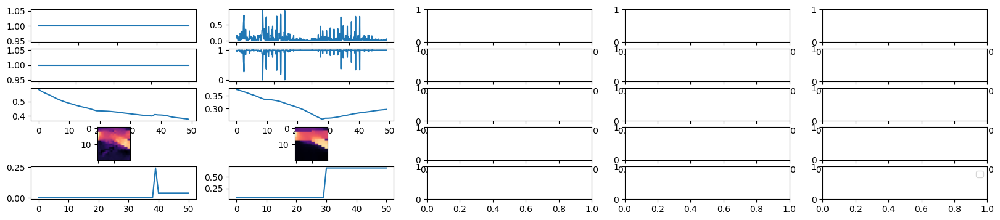

In [221]:
x_new_weights_l1, infos_new_weights_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=5, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='dp', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-4, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 1122.79it/s]


Outer Iteration 0 : RRE 0.39096750996867036 V_rank: 15


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.3365474445607291 V_rank: 5
Stopping naturally: x stabilized at iteration 40
Outer Iteration 2 : RRE 0.3168362503071711 V_rank: 6
Outer Iteration 3 : RRE 0.25065395499257676 V_rank: 16
Stopping naturally: x stabilized at iteration 49
Outer Iteration 4 : RRE 0.18660632674709182 V_rank: 6
TOTAL ITER: 246


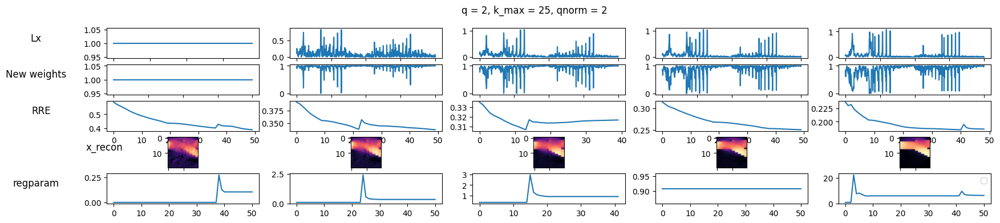

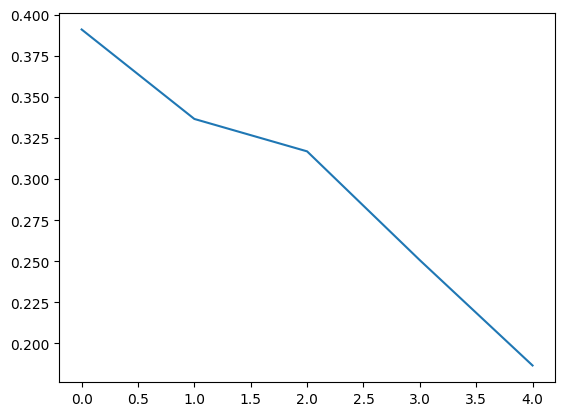

In [ ]:
x_new_weights_l2, infos_new_weights_l2, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=5, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
    pd=5, mov=20, rg='dp', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-4, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 5000.36it/s]
C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 0 : RRE 0.285241728645028 V_rank: 15
Outer Iteration 1 : RRE 0.24337435570723429 V_rank: 5
Outer Iteration 2 : RRE 0.20971647698597148 V_rank: 15
Outer Iteration 3 : RRE 0.1801711070049488 V_rank: 5
Outer Iteration 4 : RRE 0.1707522295530078 V_rank: 15
TOTAL ITER: 255


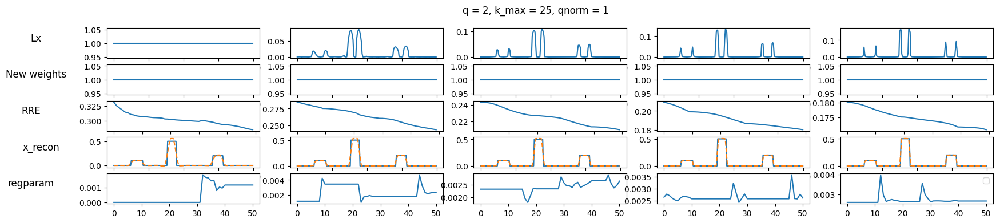

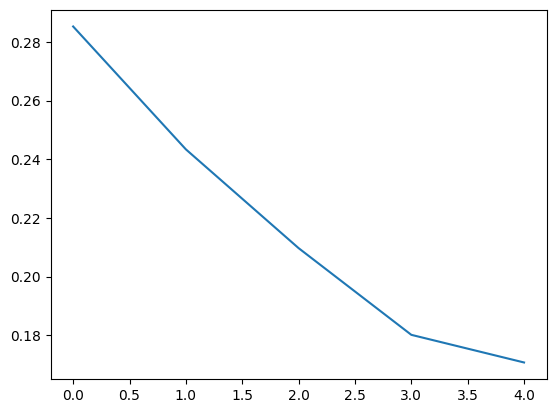

In [ ]:
x_l1, infos_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=5, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='dp', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3, new_weights=False, adaptive_epsilon=True
)

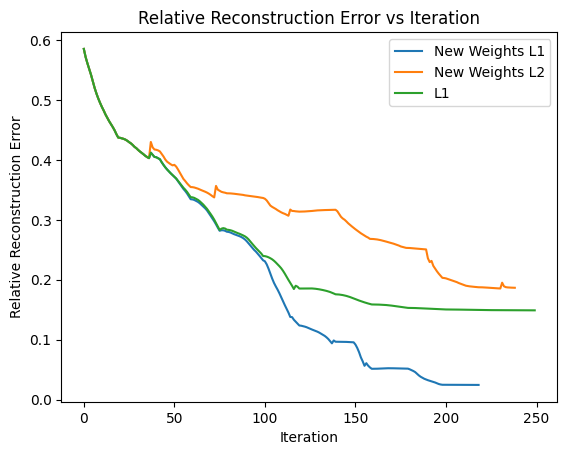

In [ ]:
rre_new_weights_l1 = np.concatenate([info['relError'] for info in infos_new_weights_l1])
rre_new_weights_l2 = np.concatenate([info['relError'] for info in infos_new_weights_l2])
rre_l1 = np.concatenate([info['relError'] for info in infos_l1])
plt.plot(rre_new_weights_l1, label='New Weights L1')
plt.plot(rre_new_weights_l2, label='New Weights L2')
plt.plot(rre_l1, label='L1')
plt.xlabel('Iteration')
plt.ylabel('Relative Reconstruction Error') 
plt.title('Relative Reconstruction Error vs Iteration')
plt.legend()

Text(0.5, 1.0, 'New Weights(L2)')

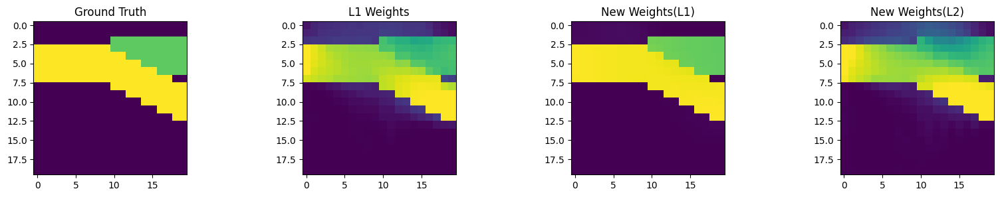

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(20,3))
ax[1].imshow(np.clip(x_l1, 0, 1).reshape(nx,ny))
ax[2].imshow(np.clip(x_new_weights_l1, 0, 1).reshape(nx,ny))
ax[3].imshow(np.clip(x_new_weights_l2, 0, 1).reshape(nx,ny))
ax[0].imshow(x_true.reshape(nx,ny))
ax[0].set_title('Ground Truth')
ax[1].set_title('L1 Weights')
ax[2].set_title('New Weights(L1)')
ax[3].set_title('New Weights(L2)')
#ax[3].imshow(np.clip(b, 0, 1).reshape(nx,ny))

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 565.06it/s]


Outer Iteration 0 : RRE 0.35365050757731986 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.1861384453844427 V_rank: 5
Outer Iteration 2 : RRE 0.06793523653379056 V_rank: 5
Outer Iteration 3 : RRE 0.03500174724316871 V_rank: 5
Outer Iteration 4 : RRE 0.019161091635380934 V_rank: 5
TOTAL ITER: 505


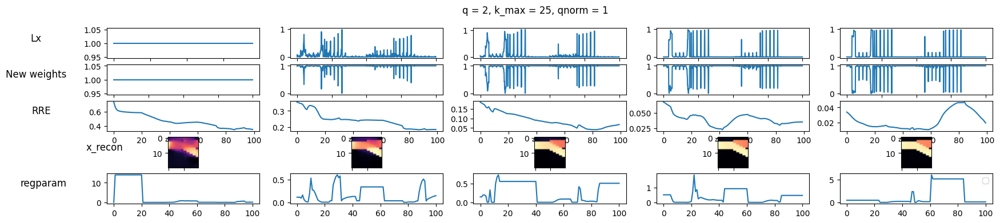

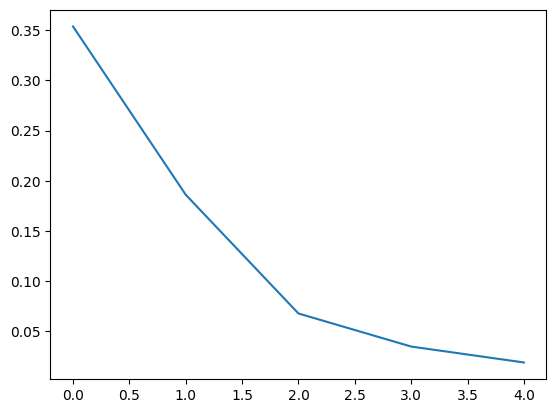

In [ ]:
x_new_weights_l1, infos_new_weights_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=5, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 1868.45it/s]


Outer Iteration 0 : RRE 0.4290724479228881 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.5035441372033543 V_rank: 5
Outer Iteration 2 : RRE 0.439073760678641 V_rank: 5
Outer Iteration 3 : RRE 0.3109665887623967 V_rank: 5
Outer Iteration 4 : RRE 0.32913642492942413 V_rank: 5
TOTAL ITER: 505


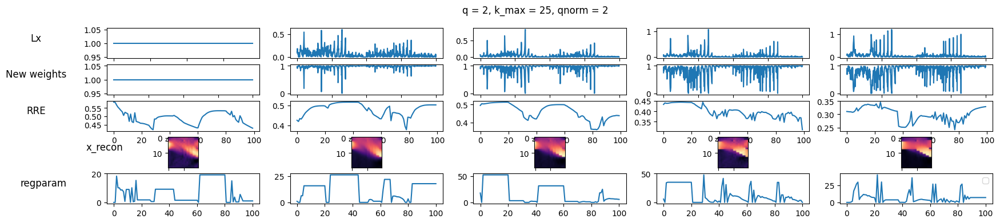

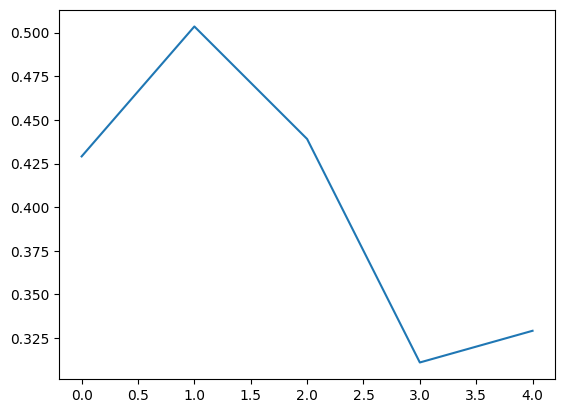

In [ ]:
x_new_weights_l2, infos_new_weights_l2, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=5, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<?, ?it/s]


Outer Iteration 0 : RRE 0.35365050757731986 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.31807607734833393 V_rank: 5
Outer Iteration 2 : RRE 0.11121159798971313 V_rank: 5
Outer Iteration 3 : RRE 0.09220031207522703 V_rank: 5
Outer Iteration 4 : RRE 0.11940874635085834 V_rank: 5
TOTAL ITER: 505


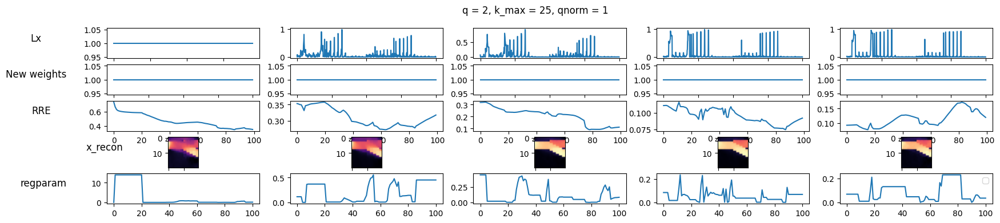

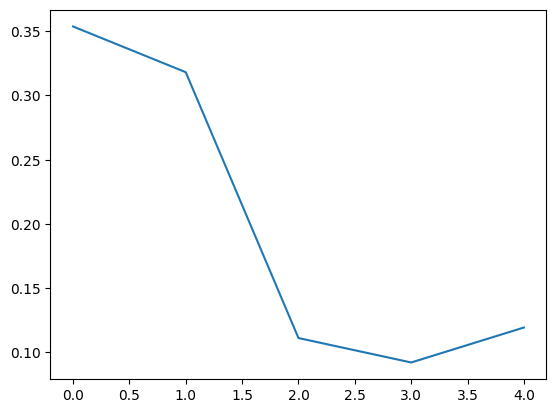

In [ ]:
x_l1, infos_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=5, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3, new_weights=False
)

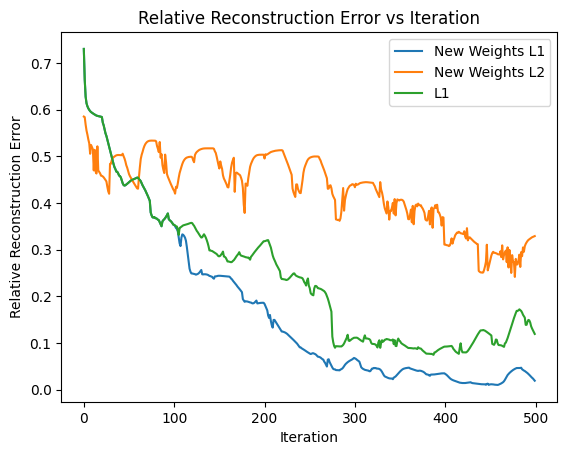

In [ ]:
rre_new_weights_l1 = np.concatenate([info['relError'] for info in infos_new_weights_l1])
rre_new_weights_l2 = np.concatenate([info['relError'] for info in infos_new_weights_l2])
rre_l1 = np.concatenate([info['relError'] for info in infos_l1])
plt.plot(rre_new_weights_l1, label='New Weights L1')
plt.plot(rre_new_weights_l2, label='New Weights L2')
plt.plot(rre_l1, label='L1')
plt.xlabel('Iteration')
plt.ylabel('Relative Reconstruction Error') 
plt.title('Relative Reconstruction Error vs Iteration')
plt.legend()

In [ ]:
from trips.test_problems.Deblurring1D import *
Deblur1D = Deblurring1D(CommitCrime = True)
nx = 200
ny = 1
import numpy as np
np.random.seed(90)
def piecewise_pulse_signal(nx, pulse_centers= [-4, -3,-1,1, 3,5][::2] , pulse_widths= [2, 0.8, 1.6,1.6,1.8,0.8][::2] , pulse_heights = [.1,.3,.5,.6,.2,.5][::2]):
    t = np.linspace(-6, 6, nx)
    y = np.zeros_like(t)
    pulse_widths = np.array(pulse_widths)/2

    for c, w, h in zip(pulse_centers, pulse_widths, pulse_heights):
        y[(t >= c - w/2) & (t <= c + w/2)] = h

    return y
y = piecewise_pulse_signal(nx)

x_true = y #Deblur1D.gen_xtrue(nx, test = 'piecewise')
# If you would like to create the operator only
A = Deblur1D.forward_Op_1D(parameter = 5, nx = nx) 
# The following creates the data b_true
b_true = Deblur1D.gen_data(x_true)
(d, delta) = Deblur1D.add_noise(b_true, 'Gaussian', noise_level = 0.005)
b = d.reshape((-1,1))
# Display relevant quantities using the methods of the Deblurring1D class 
# Deblur1D.plot_rec(x_true)
# Deblur1D.plot_data(d)
L = gen_first_derivative_operator(nx)

generating basis...: 100%|██████████| 5/5 [00:00<?, ?it/s]
C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 0 : RRE 0.26089279039608704 V_rank: 15
Outer Iteration 1 : RRE 0.149397949225924 V_rank: 5
Outer Iteration 2 : RRE 0.12670930682116827 V_rank: 15
Outer Iteration 3 : RRE 0.08706225148460274 V_rank: 5
Stopping naturally: x stabilized at iteration 40
Outer Iteration 4 : RRE 0.07108630253294547 V_rank: 6
Stopping naturally: x stabilized at iteration 39
Outer Iteration 5 : RRE 0.05261731957029346 V_rank: 6
Stopping naturally: x stabilized at iteration 19
Outer Iteration 6 : RRE 0.048491904194682384 V_rank: 6
Stopping naturally: x stabilized at iteration 19
Outer Iteration 7 : RRE 0.0369680642717155 V_rank: 6
Stopping naturally: x stabilized at iteration 19
Outer Iteration 8 : RRE 0.03543031741922021 V_rank: 6
Stopping naturally: x stabilized at iteration 19
Outer Iteration 9 : RRE 0.033866643479237984 V_rank: 6
TOTAL ITER: 371


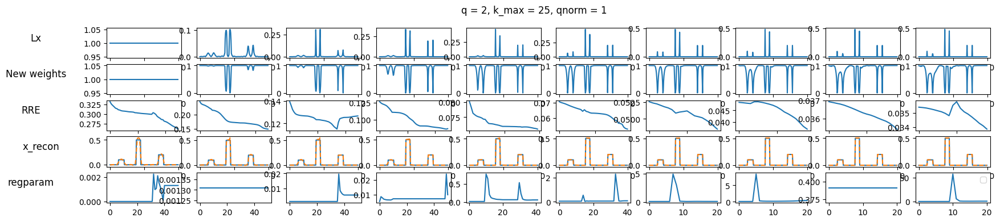

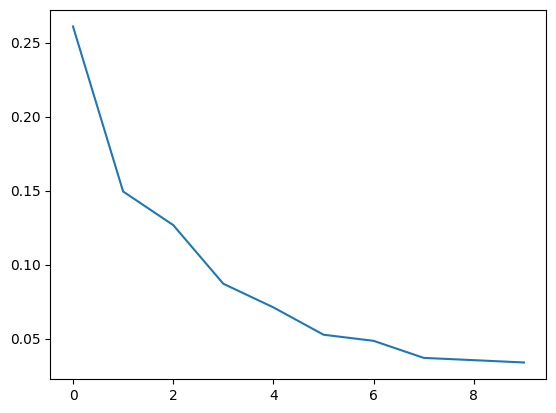

In [ ]:
x_new_weights_l1, infos_new_weights_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='dp', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-4, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<?, ?it/s]
C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\2213550720.py:78: RuntimeWarning: divide by zero encountered in divide
  beta_new = beta - f/f_prime
C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\2213550720.py:80: RuntimeWarning: invalid value encountered in subtract
  if abs(beta_new - beta) < 10**(-12)* beta:
C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Stopping naturally: x stabilized at iteration 44
Outer Iteration 0 : RRE 0.30803577094006207 V_rank: 10
Outer Iteration 1 : RRE 0.17665897729266522 V_rank: 20
Stopping naturally: x stabilized at iteration 46
Outer Iteration 2 : RRE 0.15182730989175994 V_rank: 7
Outer Iteration 3 : RRE 0.1125956837475895 V_rank: 17
Outer Iteration 4 : RRE 0.08563552010936241 V_rank: 7
Stopping naturally: x stabilized at iteration 18
Outer Iteration 5 : RRE 0.08035858040133999 V_rank: 6
Stopping naturally: x stabilized at iteration 19
Outer Iteration 6 : RRE 0.07730100621476851 V_rank: 6
Stopping naturally: x stabilized at iteration 19
Outer Iteration 7 : RRE 0.07711780862777454 V_rank: 6
Stopping naturally: x stabilized at iteration 3
Outer Iteration 8 : RRE 0.07707162694883482 V_rank: 10
Stopping naturally: x stabilized at iteration 9
Outer Iteration 9 : RRE 0.07671198401118932 V_rank: 20
TOTAL ITER: 325


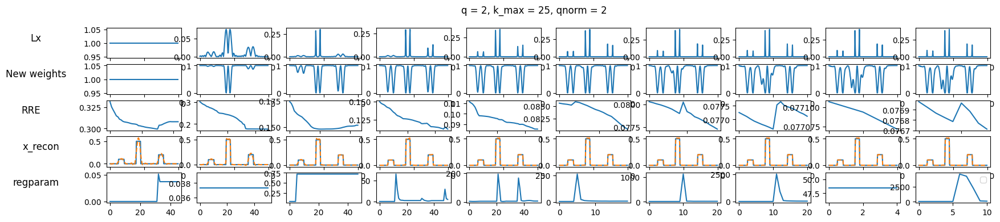

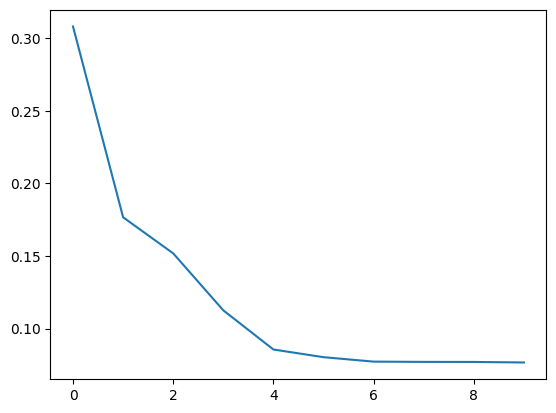

In [ ]:
x_new_weights_l2, infos_new_weights_l2, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
    pd=5, mov=20, rg='dp', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-4, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<?, ?it/s]
C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


epsilon 0.001 max u 0.0 median u 0.0 25th percentile u 0.0 75th percentile u 0.0
epsilon 0.0045979647766307835 max u 0.06822776053039795 median u 0.0045979647766307835 25th percentile u 0.0012811907375829097 75th percentile u 0.013779968417661187
epsilon 0.004664172130658375 max u 0.07069792360415242 median u 0.004664172130658375 25th percentile u 0.0013862551976347411 75th percentile u 0.01359086087186396
epsilon 0.004810775972175087 max u 0.07223845001153767 median u 0.004810775972175087 25th percentile u 0.0014532055516513782 75th percentile u 0.013108179511537095
epsilon 0.004490251256173663 max u 0.07377445940068508 median u 0.004490251256173663 25th percentile u 0.0014069180267674986 75th percentile u 0.011436150892812932
epsilon 0.004209793021315019 max u 0.07526083461338515 median u 0.004209793021315019 25th percentile u 0.0011417522263544165 75th percentile u 0.011414031582109085
epsilon 0.004069341568213355 max u 0.07578632792868767 median u 0.004069341568213355 25th percenti

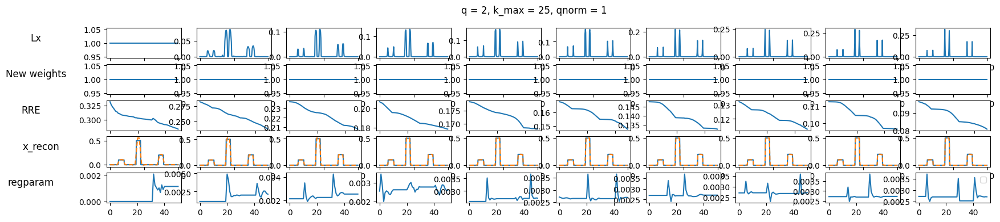

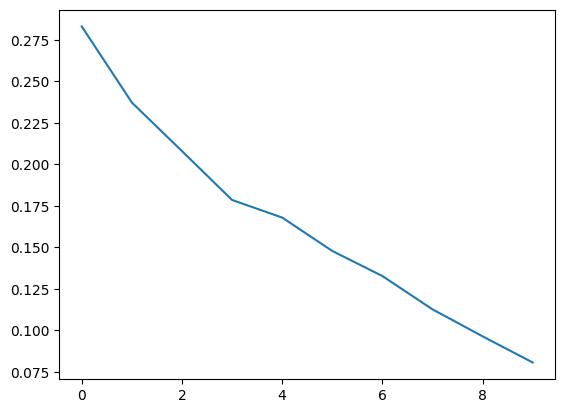

In [ ]:
x_l1, infos_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='dp', n_fig=10, non_neg=False, epsilon = 1e-3, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3, new_weights=False, adaptive_epsilon=True
)

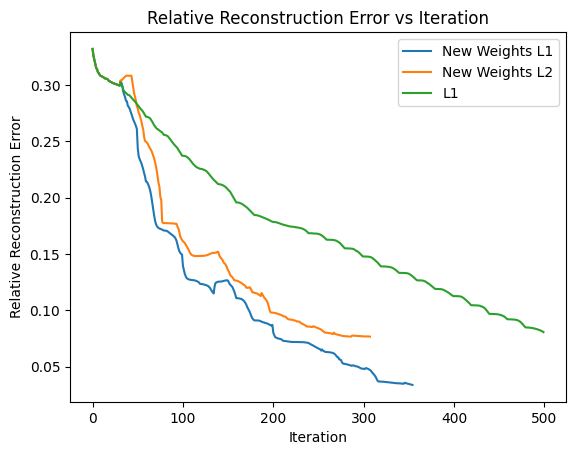

In [ ]:
rre_new_weights_l1 = np.concatenate([info['relError'] for info in infos_new_weights_l1])
rre_new_weights_l2 = np.concatenate([info['relError'] for info in infos_new_weights_l2])
rre_l1 = np.concatenate([info['relError'] for info in infos_l1])
plt.plot(rre_new_weights_l1, label='New Weights L1')
plt.plot(rre_new_weights_l2, label='New Weights L2')
plt.plot(rre_l1, label='L1')
plt.xlabel('Iteration')
plt.ylabel('Relative Reconstruction Error') 
plt.title('Relative Reconstruction Error vs Iteration')
plt.legend()

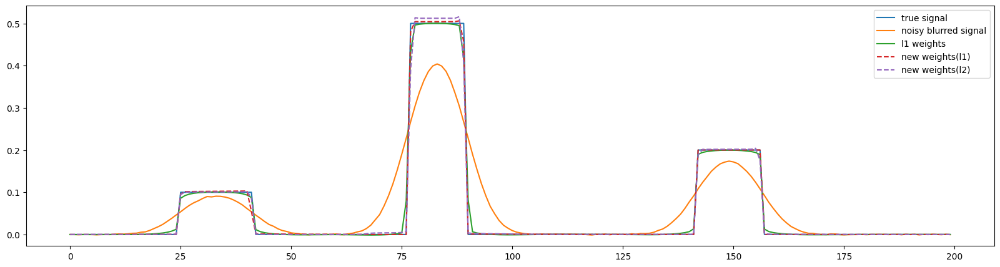

In [ ]:
plt.figure(figsize=(20, 5))
plt.plot(x_true, label =  'true signal')
plt.plot(b, label = 'noisy blurred signal')


plt.plot(x_l1, label =  'l1 weights')
plt.plot(x_new_weights_l1,'--', label =  'new weights(l1)')
plt.plot(x_new_weights_l2,'--', label =  'new weights(l2)')

plt.legend()

generating basis...: 100%|██████████| 5/5 [00:00<?, ?it/s]


Outer Iteration 0 : RRE 0.21670911479201033 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.10864469693833297 V_rank: 5
Outer Iteration 2 : RRE 0.07552244672724331 V_rank: 5
Outer Iteration 3 : RRE 0.050207560481556 V_rank: 5
Outer Iteration 4 : RRE 0.012579673902484883 V_rank: 5
Outer Iteration 5 : RRE 0.002510762206636657 V_rank: 5
Outer Iteration 6 : RRE 0.003003634522188517 V_rank: 5
Outer Iteration 7 : RRE 0.0014380384882897643 V_rank: 5
Outer Iteration 8 : RRE 0.0010390065030450692 V_rank: 5
Outer Iteration 9 : RRE 0.0009814568321075059 V_rank: 5
TOTAL ITER: 1010


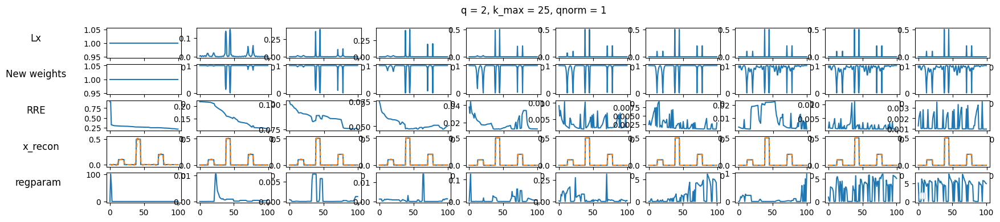

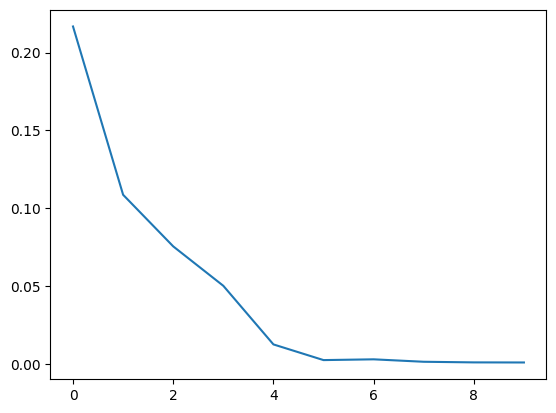

In [ ]:
x_new_weights_l1, infos_new_weights_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<?, ?it/s]


Stopping naturally: x stabilized at iteration 89
Outer Iteration 0 : RRE 0.2974595723953448 V_rank: 15


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.2218039574213735 V_rank: 15
Outer Iteration 2 : RRE 0.18402396089717707 V_rank: 15
Outer Iteration 3 : RRE 0.16621413072931074 V_rank: 15
Outer Iteration 4 : RRE 0.15902985332616767 V_rank: 15
Outer Iteration 5 : RRE 0.17447274319775946 V_rank: 15
Outer Iteration 6 : RRE 0.15755573093294287 V_rank: 15
Outer Iteration 7 : RRE 0.16146327329381271 V_rank: 15
Outer Iteration 8 : RRE 0.15748691584916252 V_rank: 15
Outer Iteration 9 : RRE 0.1574650575918891 V_rank: 15
TOTAL ITER: 1000


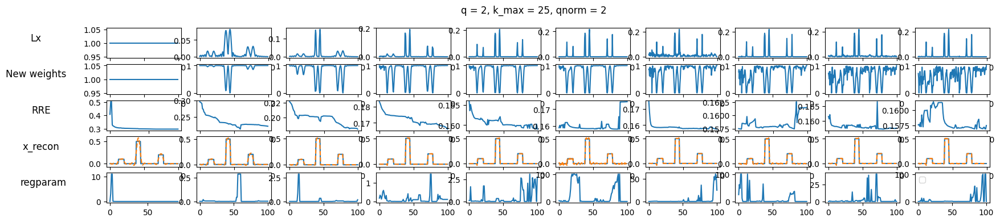

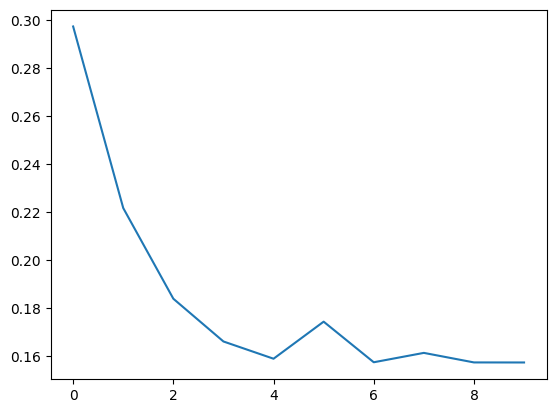

In [ ]:
x_new_weights_l2, infos_new_weights_l2, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 904.61it/s]


epsilon 0.001 max u 0.0 median u 0.0 25th percentile u 0.0 75th percentile u 0.0
epsilon 0.001 max u 2.8624506451163656e-05 median u 7.898452754839802e-06 25th percentile u 3.4558995016999855e-06 75th percentile u 1.3507524355386644e-05
epsilon 0.001 max u 0.0003769326210764576 median u 0.0001264799559136144 25th percentile u 4.445400742327486e-05 75th percentile u 0.0001955288648419224
epsilon 0.004673373672398673 max u 0.07178381596214503 median u 0.004673373672398673 25th percentile u 0.0010755206227217769 75th percentile u 0.013540536671649058
epsilon 0.004609951855568409 max u 0.07069246221807687 median u 0.004609951855568409 25th percentile u 0.0013058404157263632 75th percentile u 0.013047032638275415
epsilon 0.0037226669739747267 max u 0.07421978778756821 median u 0.0037226669739747267 25th percentile u 0.0008359177231808703 75th percentile u 0.012126902207079
epsilon 0.0025257232231222218 max u 0.07681974679612322 median u 0.0025257232231222218 25th percentile u 0.000781640628

C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


epsilon 0.001 max u 0.10606621648056597 median u 0.0004502465316684292 25th percentile u 0.00017042565029597674 75th percentile u 0.0012251239830630535
epsilon 0.001 max u 0.1067058394593774 median u 0.00042153331706392544 25th percentile u 0.00015615436416530288 75th percentile u 0.0013279245352000296
epsilon 0.001 max u 0.10713484887951621 median u 0.0004163243198381101 25th percentile u 0.00014539848352386692 75th percentile u 0.0011759095182349644
epsilon 0.001 max u 0.10718273656279398 median u 0.00041608961761823576 25th percentile u 0.00014096409705816482 75th percentile u 0.001207823040646483
epsilon 0.001 max u 0.10732286888353007 median u 0.00041505166048297527 25th percentile u 0.00015333562664035343 75th percentile u 0.0012465351435262707
epsilon 0.001 max u 0.10760636646374225 median u 0.0004301404082393415 25th percentile u 0.00012783545778764695 75th percentile u 0.001186097002702763
epsilon 0.001 max u 0.1079743809185918 median u 0.0004004728361546164 25th percentile u 

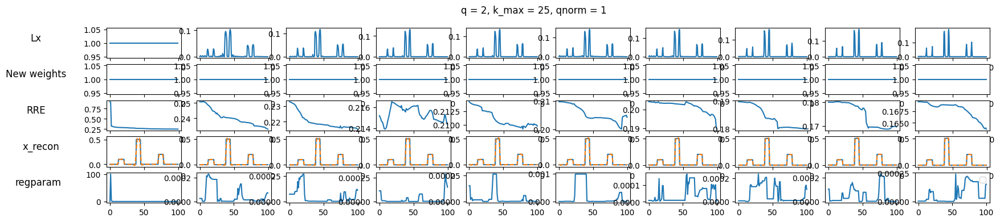

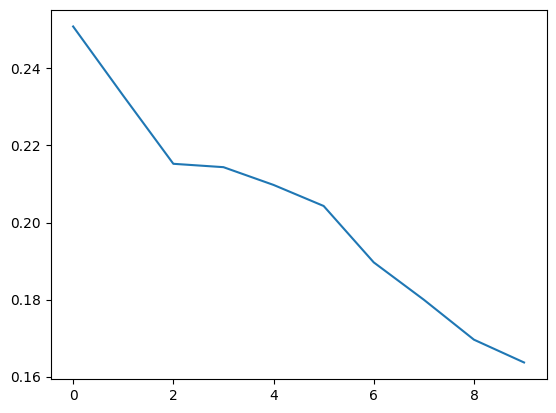

In [ ]:
x_l1, infos_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-3, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3, new_weights=False, adaptive_epsilon=True
)

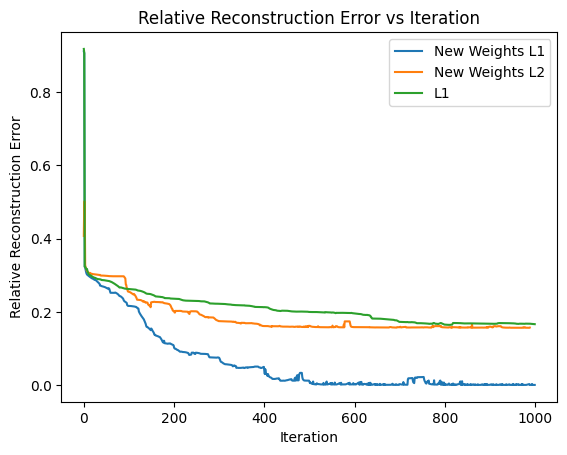

In [ ]:
rre_new_weights_l1 = np.concatenate([info['relError'] for info in infos_new_weights_l1])
rre_new_weights_l2 = np.concatenate([info['relError'] for info in infos_new_weights_l2])
rre_l1 = np.concatenate([info['relError'] for info in infos_l1])
plt.plot(rre_new_weights_l1, label='New Weights L1')
plt.plot(rre_new_weights_l2, label='New Weights L2')
plt.plot(rre_l1, label='L1')
plt.xlabel('Iteration')
plt.ylabel('Relative Reconstruction Error') 
plt.title('Relative Reconstruction Error vs Iteration')
plt.legend()

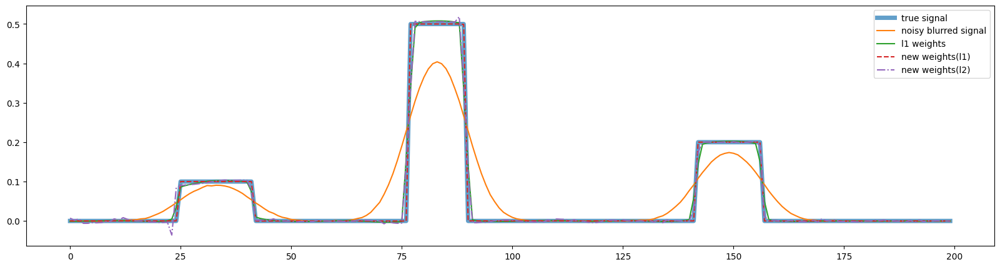

In [ ]:
plt.figure(figsize=(20, 5))
plt.plot(x_true, label =  'true signal', linewidth=5, alpha=0.7)
plt.plot(b, label = 'noisy blurred signal')


plt.plot(x_l1, label =  'l1 weights')
plt.plot(x_new_weights_l1,'--', label =  'new weights(l1)')
plt.plot(x_new_weights_l2,'-.', label =  'new weights(l2)')

plt.legend()

In [ ]:
import skimage
import scipy.io
data = scipy.io.loadmat('C:\\Users\\okuno\\Downloads\\Data82.mat')
gt = scipy.io.loadmat('C:\\Users\\okuno\\Downloads\\GroundTruthReconstruction.mat')
A = data['A']
b = data['m'].flatten(order ='f').reshape(-1,1)
x_true = skimage.transform.resize(gt['FBP1200'], (82,82), anti_aliasing=True).T.reshape(-1,1)
nx,ny= 82,82
L = gen_first_derivative_operator_2D(nx, ny)

c:\Users\okuno\anaconda3\Lib\site-packages\scipy\sparse\_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


In [ ]:
import skimage
import scipy.io
data = scipy.io.loadmat('C:\\Users\\okuno\\Downloads\\DataFull_128x15.mat')
gt = scipy.io.loadmat('C:\\Users\\okuno\\Downloads\\GroundTruthReconstruction (1).mat')
A = data['A']
b = data['m'].flatten(order ='f').reshape(-1,1)
x_true = skimage.transform.resize(gt['FBP360'], (128,128), anti_aliasing=True).T.reshape(-1,1)
nx,ny= 128,128
L = gen_first_derivative_operator_2D(nx, ny)

In [ ]:
gt.keys()

dict_keys(['__header__', '__version__', '__globals__', 'FBP360'])

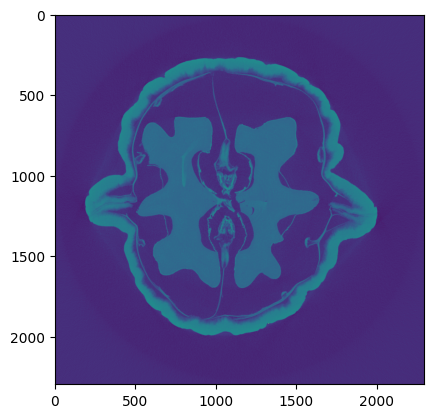

In [ ]:
plt.imshow(gt['FBP1200'].reshape(2296,2296))

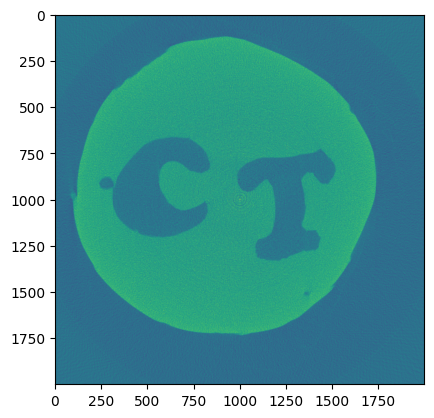

In [ ]:
plt.imshow(gt['FBP360'].reshape(2000,2000))

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 106.38it/s]


Outer Iteration 0 : RRE 3.0653308737223637 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 3.071715146238834 V_rank: 5
Outer Iteration 2 : RRE 3.081538643064065 V_rank: 5
Outer Iteration 3 : RRE 3.1033213062948866 V_rank: 5
Outer Iteration 4 : RRE 3.115370264368705 V_rank: 5
Outer Iteration 5 : RRE 3.1378044268211234 V_rank: 5
Outer Iteration 6 : RRE 3.1308165095081373 V_rank: 5
Outer Iteration 7 : RRE 3.13850872550581 V_rank: 5
Outer Iteration 8 : RRE 3.141085034401953 V_rank: 5
Outer Iteration 9 : RRE 3.1439858995313905 V_rank: 5
TOTAL ITER: 1010


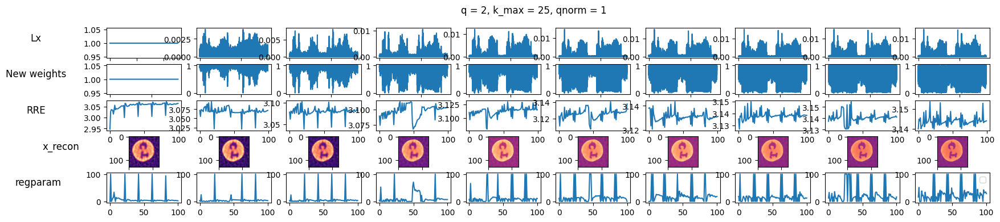

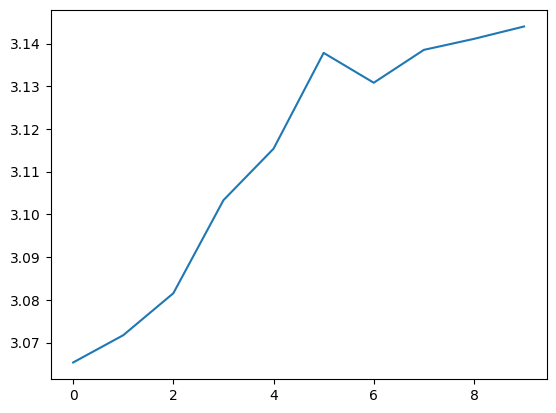

In [ ]:
x_new_weights_l1, infos_new_weights_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=0, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 99.66it/s]


KeyboardInterrupt: 

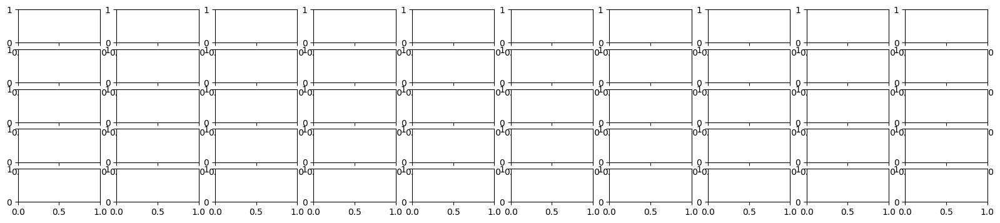

In [ ]:
x_new_weights_l2, infos_new_weights_l2, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=0, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 94.37it/s]


Outer Iteration 0 : RRE 3.078867794699424 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 3.0832746846945707 V_rank: 5
Outer Iteration 2 : RRE 3.084287123758572 V_rank: 5
Outer Iteration 3 : RRE 3.0848356838908044 V_rank: 5
Outer Iteration 4 : RRE 3.0850167099720696 V_rank: 5
Outer Iteration 5 : RRE 3.0851245863545356 V_rank: 5
Outer Iteration 6 : RRE 3.0851571157827262 V_rank: 5
Stopping naturally: x stabilized at iteration 42
Outer Iteration 7 : RRE 3.085165012065291 V_rank: 8
Stopping naturally: x stabilized at iteration 39
Outer Iteration 8 : RRE 3.0851712528902553 V_rank: 8
Stopping naturally: x stabilized at iteration 19
Outer Iteration 9 : RRE 3.0851749404629487 V_rank: 8
TOTAL ITER: 813


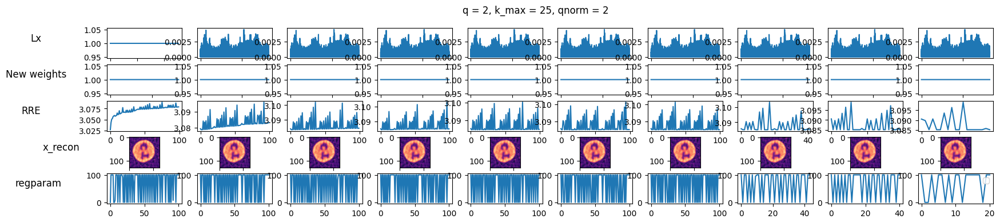

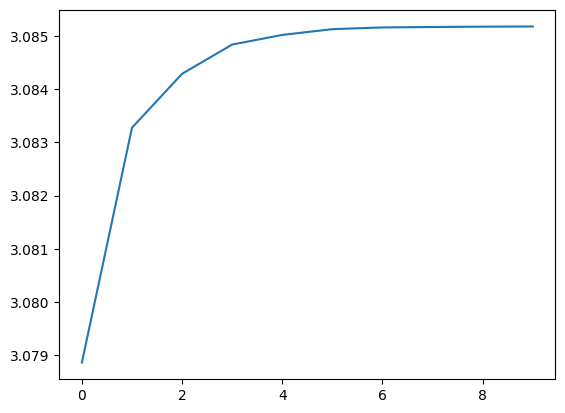

In [ ]:
x_l1, infos_new_weights_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=0, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3, new_weights=False
)

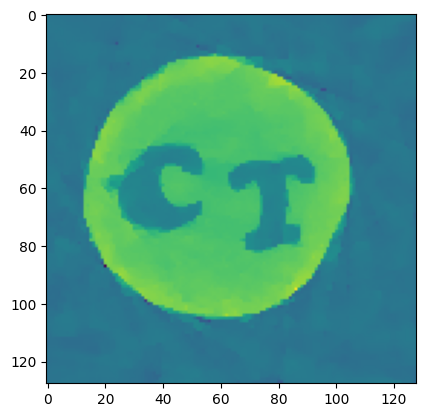

In [ ]:
plt.imshow(x_new_weights_l1.reshape(nx,ny).T)

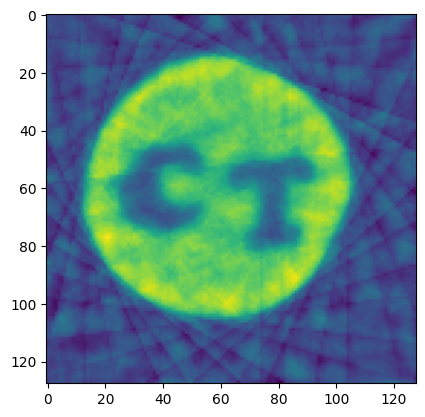

In [ ]:
plt.imshow(x_l1.reshape(nx,ny).T)

In [222]:
nx = 128
ny = nx
problem = generate_problem(phantom_name='blocks', nx=nx
                           , ny=ny, t_end=1
                           , v_max=1, v_min=0, padding=3, root='',add =0,)
x_true = problem['u_traj'][0]

shape = problem['shape']
nx,ny = shape


views = 45

theta = np.linspace(0, 90, views, endpoint=False)
A = create_forward_op_ct(nx, ny, theta=theta,s=2)
b_true = A @ x_true.reshape(-1, 1) 

noise_level = 0.005
noise = np.random.randn(b_true.shape[0]).reshape((-1, 1))
e = noise_level * np.linalg.norm(b_true) / np.linalg.norm(noise) * noise
e = e.reshape((-1, 1))

b = b_true + e

delta = la.norm(e) 
L = gen_first_derivative_operator_2D(nx, ny)

Problem Description:
- Phantom: blocks
- Image size: 128 x 128
- Number of frames: 1
- Output directory: /problem_128_by_128_blocks_20260211_171623



c:\Users\okuno\anaconda3\Lib\site-packages\scipy\sparse\_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


generating basis...: 100%|██████████| 5/5 [00:00<00:00, 115.37it/s]


Outer Iteration 0 : RRE 0.3443901042693417 V_rank: 15


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.19739660284064459 V_rank: 5
Outer Iteration 2 : RRE 0.16895501312975306 V_rank: 15
Outer Iteration 3 : RRE 0.1541253928683319 V_rank: 5
Outer Iteration 4 : RRE 0.14898949472429804 V_rank: 15
TOTAL ITER: 255


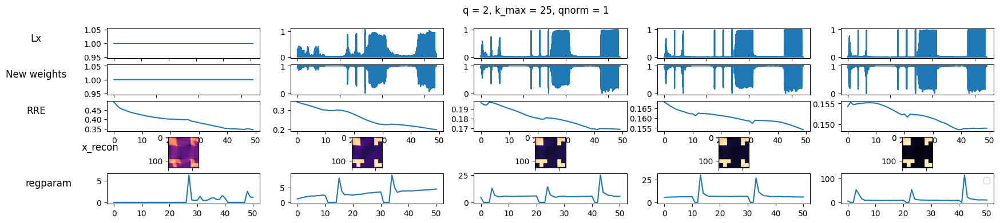

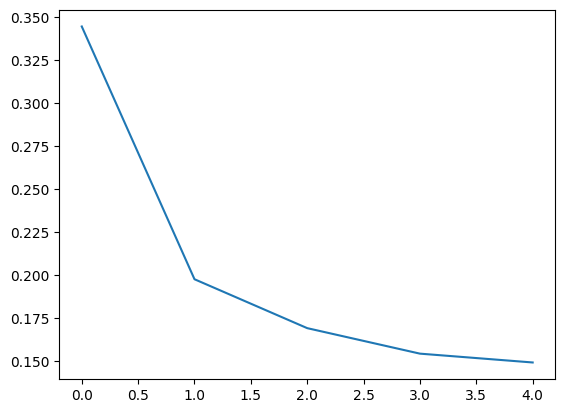

In [223]:
x_new_weights_l1, infos_new_weights_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=5, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='dp', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=0, break_lambdah=False, break_x=True, break_tol=1e-4, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 100.40it/s]


Outer Iteration 0 : RRE 0.36208499527172344 V_rank: 15


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.29992693290738937 V_rank: 5
Outer Iteration 2 : RRE 0.2724351363609494 V_rank: 15
Outer Iteration 3 : RRE 0.2500420950418784 V_rank: 5
Outer Iteration 4 : RRE 0.22553941446872197 V_rank: 15
TOTAL ITER: 255


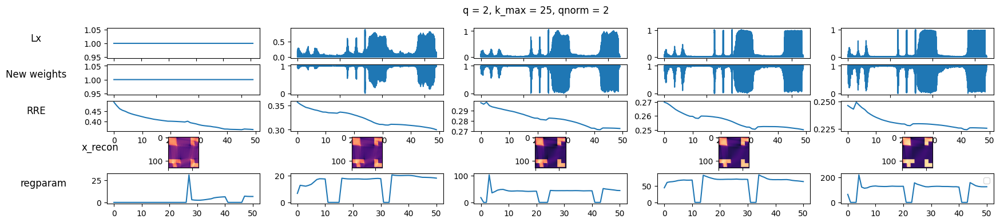

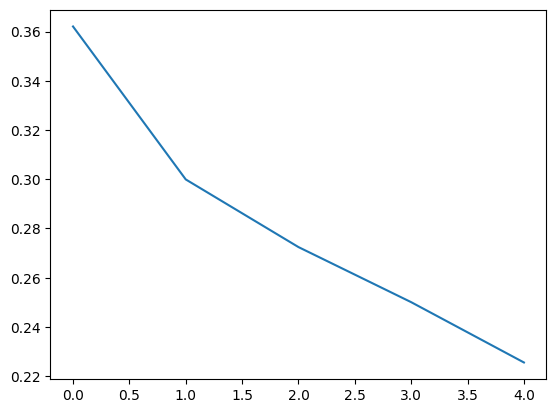

In [224]:
x_new_weights_l2, infos_new_weights_l2, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=5, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
    pd=5, mov=20, rg='dp', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=0, break_lambdah=False, break_x=True, break_tol=1e-4, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 114.49it/s]


epsilon 0.001 max u 0.0 median u 0.0 25th percentile u 0.0 75th percentile u 0.0
epsilon 0.0252304908143436 max u 0.533636794782354 median u 0.0252304908143436 25th percentile u 0.010929160753738208 75th percentile u 0.051208780270154644
epsilon 0.027066810476364694 max u 0.6451435840771301 median u 0.027066810476364694 25th percentile u 0.011729599349229756 75th percentile u 0.05497320255567756
epsilon 0.02946110651565291 max u 0.7507079466769871 median u 0.02946110651565291 25th percentile u 0.012856052456474934 75th percentile u 0.05967639501000273
epsilon 0.031057697194452775 max u 0.7964983659575282 median u 0.031057697194452775 25th percentile u 0.013627766766081684 75th percentile u 0.062429555617980866
epsilon 0.03229436480923645 max u 0.8471962796163066 median u 0.03229436480923645 25th percentile u 0.014240662258055092 75th percentile u 0.06450096642057296
epsilon 0.034260595201594364 max u 0.9414848032880545 median u 0.034260595201594364 25th percentile u 0.01521984227400188

C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


epsilon 0.004142944848945691 max u 1.0521486091447978 median u 0.004142944848945691 25th percentile u 0.001594931893368194 75th percentile u 0.01465402223451991
epsilon 0.0038762899282543915 max u 1.0457972777404976 median u 0.0038762899282543915 25th percentile u 0.0015421303008140055 75th percentile u 0.013755502486108774
epsilon 0.003702288916487939 max u 1.0423228428819291 median u 0.003702288916487939 25th percentile u 0.0015243766621851895 75th percentile u 0.013017558547427886
epsilon 0.003571655945407497 max u 1.0399751524794965 median u 0.003571655945407497 25th percentile u 0.0015046779663313754 75th percentile u 0.012292318047109767
epsilon 0.0034781909620673086 max u 1.0386822197077148 median u 0.0034781909620673086 25th percentile u 0.0014560956555868911 75th percentile u 0.011590150015569317
epsilon 0.003399430963263725 max u 1.0380327492929249 median u 0.003399430963263725 25th percentile u 0.0014446802458754557 75th percentile u 0.010959735244305019
epsilon 0.0033246208

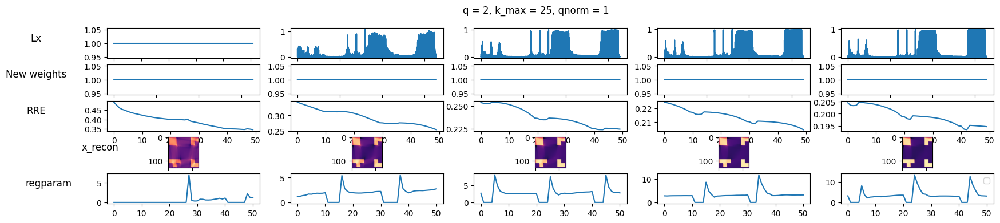

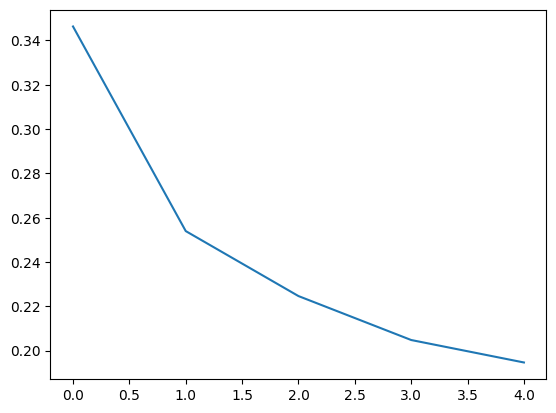

In [225]:
x_l1, infos_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=5, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='dp', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=0, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3, new_weights=False, adaptive_epsilon=True
)

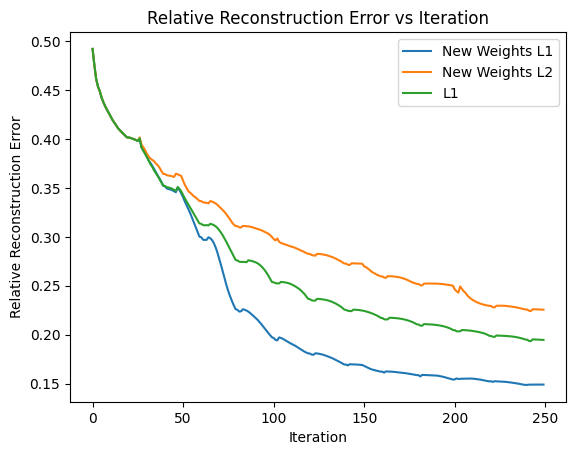

In [226]:
rre_new_weights_l1 = np.concatenate([info['relError'] for info in infos_new_weights_l1])
rre_new_weights_l2 = np.concatenate([info['relError'] for info in infos_new_weights_l2])
rre_l1 = np.concatenate([info['relError'] for info in infos_l1])
plt.plot(rre_new_weights_l1, label='New Weights L1')
plt.plot(rre_new_weights_l2, label='New Weights L2')
plt.plot(rre_l1, label='L1')
plt.xlabel('Iteration')
plt.ylabel('Relative Reconstruction Error') 
plt.title('Relative Reconstruction Error vs Iteration')
plt.legend()

Text(0.5, 1.0, 'New Weights(L2)')

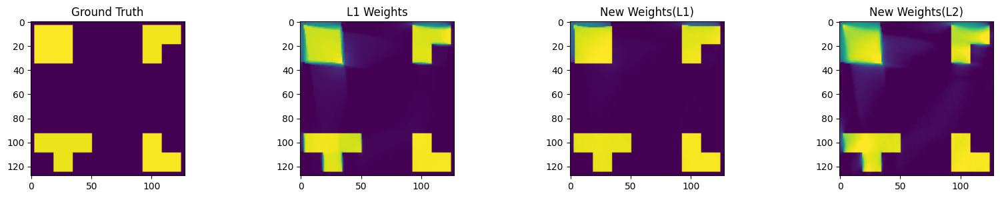

In [228]:
fig, ax = plt.subplots(1,4, figsize=(20,3))
ax[1].imshow(np.clip(x_l1, 0, 1).reshape(nx,ny))
ax[2].imshow(np.clip(x_new_weights_l1, 0, 1).reshape(nx,ny))
ax[3].imshow(np.clip(x_new_weights_l2, 0, 1).reshape(nx,ny))
ax[0].imshow(x_true.reshape(nx,ny))
ax[0].set_title('Ground Truth')
ax[1].set_title('L1 Weights')
ax[2].set_title('New Weights(L1)')
ax[3].set_title('New Weights(L2)')
#ax[3].imshow(np.clip(b, 0, 1).reshape(nx,ny))

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 92.69it/s]


Outer Iteration 0 : RRE 0.30375303404669673 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.2366957004511952 V_rank: 5
Outer Iteration 2 : RRE 0.20000584640494384 V_rank: 5
Outer Iteration 3 : RRE 0.16471928798851646 V_rank: 5
Outer Iteration 4 : RRE 0.15243592384261576 V_rank: 5
Outer Iteration 5 : RRE 0.14103752525744542 V_rank: 5
Outer Iteration 6 : RRE 0.1368837804385532 V_rank: 5
Outer Iteration 7 : RRE 0.12642375149772098 V_rank: 5
Outer Iteration 8 : RRE 0.11631816232362163 V_rank: 5
Outer Iteration 9 : RRE 0.1054640211605438 V_rank: 5
Outer Iteration 10 : RRE 0.10195178229898233 V_rank: 5
Outer Iteration 11 : RRE 0.10157105470382252 V_rank: 5
Outer Iteration 12 : RRE 0.10102936310891013 V_rank: 5
Outer Iteration 13 : RRE 0.09798001829104147 V_rank: 5
Outer Iteration 14 : RRE 0.09833411312201919 V_rank: 5
TOTAL ITER: 1515


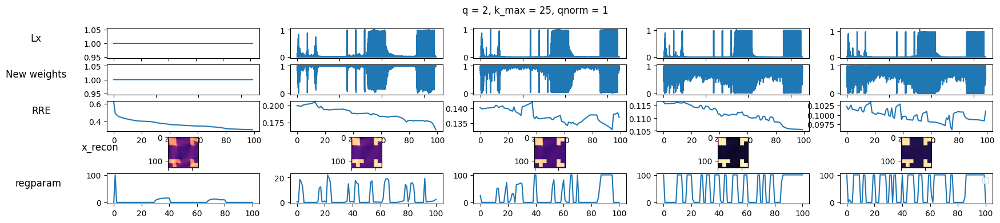

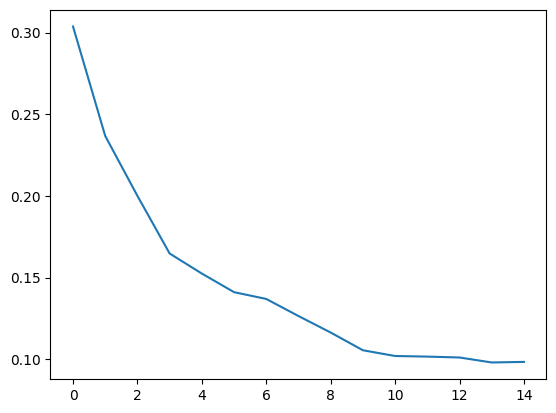

In [231]:
x_new_weights_l1, infos_new_weights_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=15, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=5, non_neg=False, epsilon = 1e-2, tolambdah=0, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3
)

In [ ]:
x_new_weights_l1, infos_new_weights_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=15, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=5, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 48.11it/s]


Outer Iteration 0 : RRE 0.18857594026225533 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.16869394774530966 V_rank: 5
Outer Iteration 2 : RRE 0.15107820421773552 V_rank: 5
Outer Iteration 3 : RRE 0.16064982025270783 V_rank: 5
Outer Iteration 4 : RRE 0.1546764080190107 V_rank: 5
Outer Iteration 5 : RRE 0.14906809066404453 V_rank: 5
Outer Iteration 6 : RRE 0.15333365232461635 V_rank: 5
Outer Iteration 7 : RRE 0.15094804117792393 V_rank: 5
Outer Iteration 8 : RRE 0.15400263398289415 V_rank: 5
Outer Iteration 9 : RRE 0.15390107518017382 V_rank: 5
Outer Iteration 10 : RRE 0.15377069895300322 V_rank: 5
Outer Iteration 11 : RRE 0.15448000105729456 V_rank: 5
Outer Iteration 12 : RRE 0.15409773984412353 V_rank: 5


generating basis...: 100%|██████████| 5/5 [00:00<00:00, 100.59it/s]


Outer Iteration 0 : RRE 0.3453726187167051 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.29810476011134074 V_rank: 5
Outer Iteration 2 : RRE 0.24775889393523795 V_rank: 5
Outer Iteration 3 : RRE 0.22095443170357354 V_rank: 5
Outer Iteration 4 : RRE 0.18608556008351923 V_rank: 5
Outer Iteration 5 : RRE 0.167162014819047 V_rank: 5
Outer Iteration 6 : RRE 0.14845727208594217 V_rank: 5
Outer Iteration 7 : RRE 0.12083254687878427 V_rank: 5
Outer Iteration 8 : RRE 0.11127202254313841 V_rank: 5
Outer Iteration 9 : RRE 0.10523815514827774 V_rank: 5
Outer Iteration 10 : RRE 0.10343300874770305 V_rank: 5
Outer Iteration 11 : RRE 0.101245044125531 V_rank: 5
Outer Iteration 12 : RRE 0.09459674870418822 V_rank: 5
Outer Iteration 13 : RRE 0.09105499888808898 V_rank: 5
Outer Iteration 14 : RRE 0.08863304108280512 V_rank: 5
TOTAL ITER: 1515


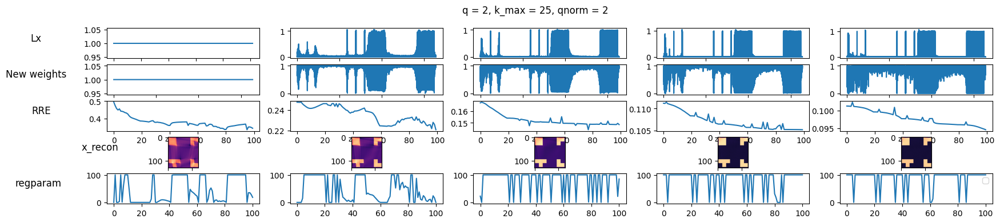

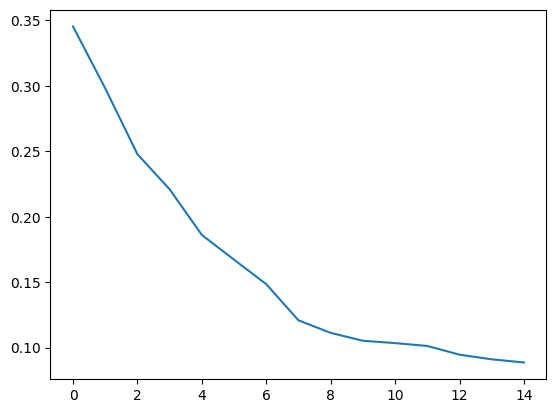

In [232]:
x_new_weights_l2, infos_new_weights_l2, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=15, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=5, non_neg=False, epsilon = 1e-2, tolambdah=0, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 99.23it/s]


Outer Iteration 0 : RRE 0.30375303404669673 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.26246808021908613 V_rank: 5
Outer Iteration 2 : RRE 0.221471135670078 V_rank: 5
Outer Iteration 3 : RRE 0.16649800952657287 V_rank: 5
Outer Iteration 4 : RRE 0.14276884251912605 V_rank: 5
Outer Iteration 5 : RRE 0.133375403923327 V_rank: 5
Outer Iteration 6 : RRE 0.1248192219399746 V_rank: 5
Outer Iteration 7 : RRE 0.11985175344902697 V_rank: 5
Outer Iteration 8 : RRE 0.11832096670927308 V_rank: 5
Outer Iteration 9 : RRE 0.11472697097816677 V_rank: 5
Outer Iteration 10 : RRE 0.11401312860734927 V_rank: 5
Outer Iteration 11 : RRE 0.11293488209223997 V_rank: 5
Outer Iteration 12 : RRE 0.11257651634523874 V_rank: 5
Outer Iteration 13 : RRE 0.11342319224602648 V_rank: 5
Outer Iteration 14 : RRE 0.1132365299210584 V_rank: 5
TOTAL ITER: 1515


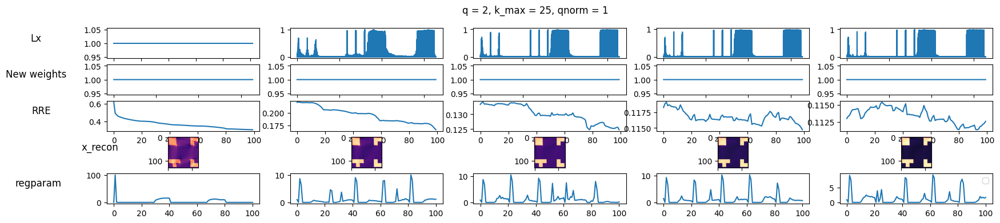

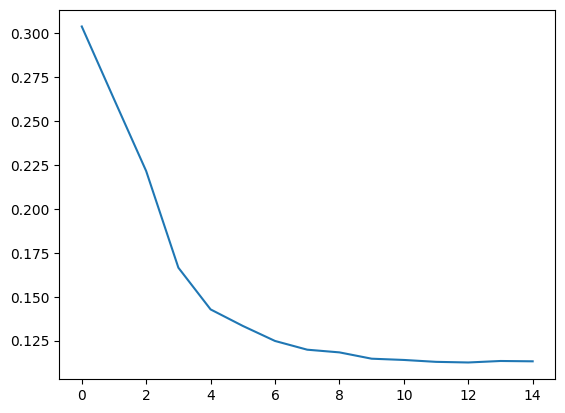

In [233]:
x_l1, infos_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=15, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=5, non_neg=False, epsilon = 1e-2, tolambdah=0, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3, new_weights=False
)

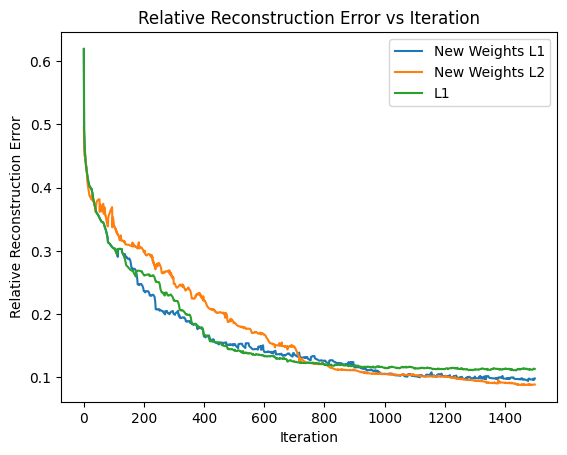

In [234]:
rre_new_weights_l1 = np.concatenate([info['relError'] for info in infos_new_weights_l1])
rre_new_weights_l2 = np.concatenate([info['relError'] for info in infos_new_weights_l2])
rre_l1 = np.concatenate([info['relError'] for info in infos_l1])
plt.plot(rre_new_weights_l1, label='New Weights L1')
plt.plot(rre_new_weights_l2, label='New Weights L2')
plt.plot(rre_l1, label='L1')
plt.xlabel('Iteration')
plt.ylabel('Relative Reconstruction Error') 
plt.title('Relative Reconstruction Error vs Iteration')
plt.legend()

Text(0.5, 1.0, 'New Weights(L2)')

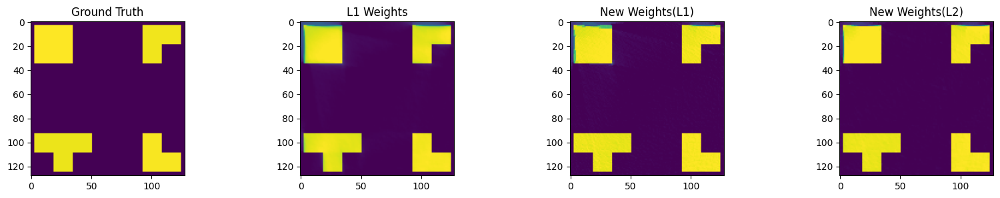

In [235]:
fig, ax = plt.subplots(1,4, figsize=(20,3))
ax[1].imshow(np.clip(x_l1, 0, 1).reshape(nx,ny))
ax[2].imshow(np.clip(x_new_weights_l1, 0, 1).reshape(nx,ny))
ax[3].imshow(np.clip(x_new_weights_l2, 0, 1).reshape(nx,ny))
ax[0].imshow(x_true.reshape(nx,ny))
ax[0].set_title('Ground Truth')
ax[1].set_title('L1 Weights')
ax[2].set_title('New Weights(L1)')
ax[3].set_title('New Weights(L2)')
#ax[3].imshow(np.clip(b, 0, 1).reshape(nx,ny))

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 89.78it/s]


Outer Iteration 0 : RRE 0.3453726187167051 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.29810476011134074 V_rank: 5
Outer Iteration 2 : RRE 0.24775889393523795 V_rank: 5
Outer Iteration 3 : RRE 0.22095443170357354 V_rank: 5
Outer Iteration 4 : RRE 0.18608556008351923 V_rank: 5
Outer Iteration 5 : RRE 0.167162014819047 V_rank: 5
Outer Iteration 6 : RRE 0.14845727208594217 V_rank: 5
Outer Iteration 7 : RRE 0.12083254687878427 V_rank: 5
Outer Iteration 8 : RRE 0.11127202254313841 V_rank: 5
Outer Iteration 9 : RRE 0.10523815514827774 V_rank: 5
TOTAL ITER: 1010


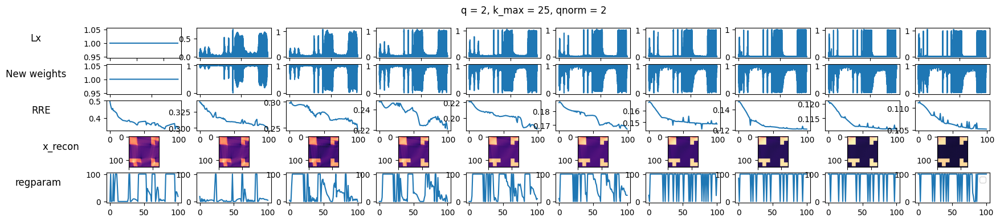

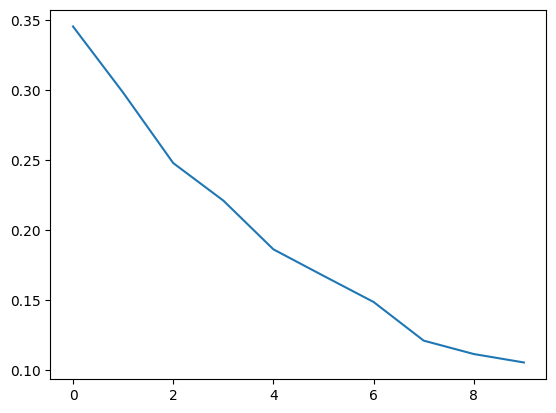

In [229]:
x_new_weights_l2, infos_new_weights_l2, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=0, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 629.34it/s]


epsilon 0.001 max u 0.0 median u 0.0 25th percentile u 0.0 75th percentile u 0.0
epsilon 0.001 max u 0.0022572835005418715 median u 0.00026612765338529 25th percentile u 0.00011003223840326624 75th percentile u 0.00048274311261752197
epsilon 0.001 max u 0.0012153246336379046 median u 0.00022799694051401373 25th percentile u 8.735531326276719e-05 75th percentile u 0.00040372032532638475
epsilon 0.001 max u 0.001303649306469772 median u 0.00025153780345586914 25th percentile u 0.00010224992370538345 75th percentile u 0.0004769770567726998
epsilon 0.001 max u 0.0013579848004892092 median u 0.0002442450009652389 25th percentile u 9.027031620215532e-05 75th percentile u 0.0004880549745331147
epsilon 0.001 max u 0.001454431386676877 median u 0.0002307331374296973 25th percentile u 8.621746758675835e-05 75th percentile u 0.0004917257819490729
epsilon 0.001 max u 0.0015526559866953765 median u 0.00022045200329963432 25th percentile u 8.58525940667959e-05 75th percentile u 0.000491967991740676


KeyboardInterrupt: 

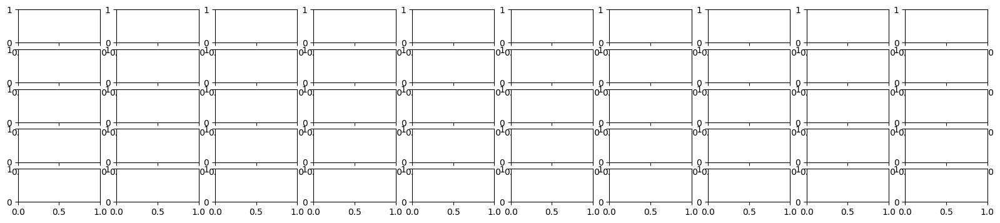

In [ ]:
x_l1, infos_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-3, tolambdah=0, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3, new_weights=False, adaptive_epsilon=True
)

generating basis...: 100%|██████████| 5/5 [00:00<00:00, 320.33it/s]


Outer Iteration 0 : RRE 0.9333724272045105 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.9333462443136715 V_rank: 5
Outer Iteration 2 : RRE 0.9334518742345885 V_rank: 5
Outer Iteration 3 : RRE 0.9332737439354623 V_rank: 5
Outer Iteration 4 : RRE 0.9332860676419449 V_rank: 5
Outer Iteration 5 : RRE 0.9333706071588984 V_rank: 5
Outer Iteration 6 : RRE 0.9335669481570165 V_rank: 5
Outer Iteration 7 : RRE 0.933528614877096 V_rank: 5
Outer Iteration 8 : RRE 0.9334145788586269 V_rank: 5
Outer Iteration 9 : RRE 0.933358585144655 V_rank: 5
TOTAL ITER: 1010


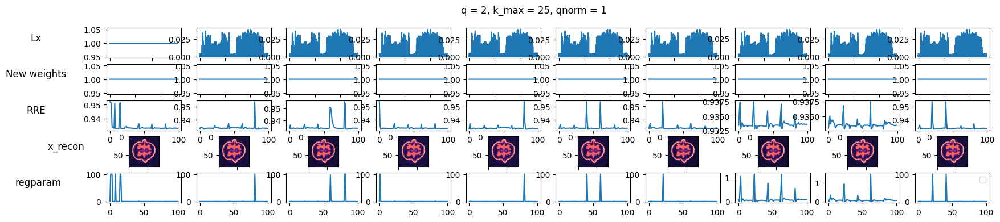

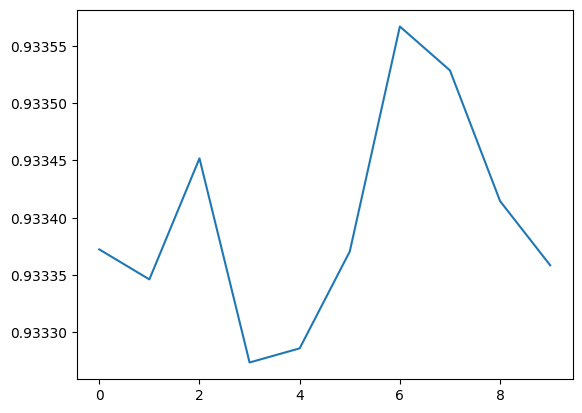

In [ ]:
x_l1, infos_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=0, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3, new_weights=False, adaptive_epsilon=False
)

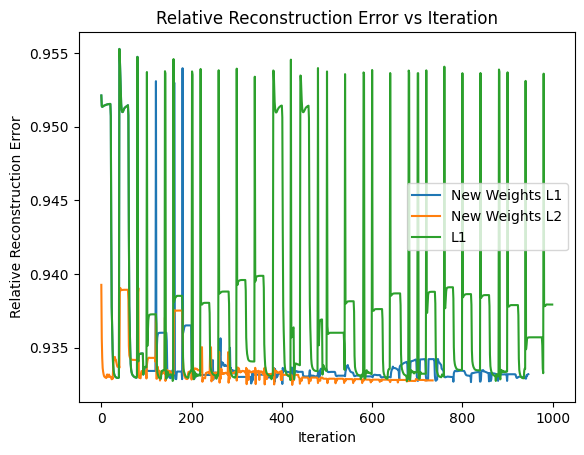

In [ ]:
rre_new_weights_l1 = np.concatenate([info['relError'] for info in infos_new_weights_l1])
rre_new_weights_l2 = np.concatenate([info['relError'] for info in infos_new_weights_l2])
rre_l1 = np.concatenate([info['relError'] for info in infos_l1])
plt.plot(rre_new_weights_l1, label='New Weights L1')
plt.plot(rre_new_weights_l2, label='New Weights L2')
plt.plot(rre_l1, label='L1')
plt.xlabel('Iteration')
plt.ylabel('Relative Reconstruction Error') 
plt.title('Relative Reconstruction Error vs Iteration')
plt.legend()

Text(0.5, 1.0, 'New Weights(L2)')

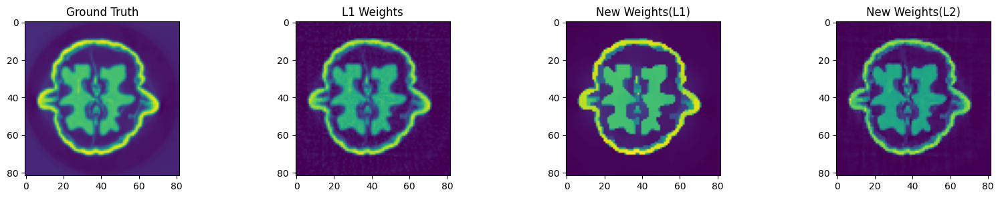

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(20,3))
ax[1].imshow(np.clip(x_l1, 0, 1).reshape(nx,ny).T)
ax[2].imshow(np.clip(x_new_weights_l1, 0, 1).reshape(nx,ny).T)
ax[3].imshow(np.clip(x_new_weights_l2, 0, 1).reshape(nx,ny).T)
ax[0].imshow(x_true.reshape(nx,ny).T)
ax[0].set_title('Ground Truth')
ax[1].set_title('L1 Weights')
ax[2].set_title('New Weights(L1)')
ax[3].set_title('New Weights(L2)')
#ax[3].imshow(np.clip(b, 0, 1).reshape(nx,ny))

Text(0.5, 1.0, 'New Weights(L2)')

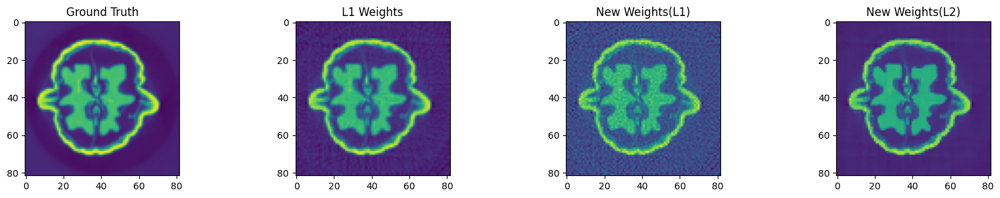

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(20,3))
ax[1].imshow(np.clip(x_l1, 0, 1).reshape(nx,ny).T)
ax[2].imshow(np.clip(x_new_weights_l1, 0, 1).reshape(nx,ny).T)
ax[3].imshow(np.clip(x_new_weights_l2, 0, 1).reshape(nx,ny).T)
ax[0].imshow(x_true.reshape(nx,ny).T)
ax[0].set_title('Ground Truth')
ax[1].set_title('L1 Weights')
ax[2].set_title('New Weights(L1)')
ax[3].set_title('New Weights(L2)')
#ax[3].imshow(np.clip(b, 0, 1).reshape(nx,ny))

Text(0.5, 1.0, 'New Weights(L2)')

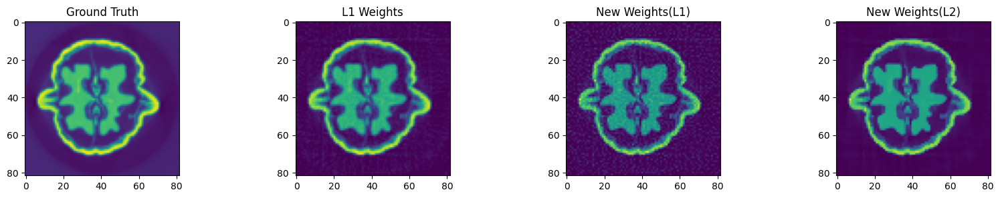

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(20,3))
ax[1].imshow(np.clip(x_l1, 0, 1).reshape(nx,ny).T)
ax[2].imshow(np.clip(x_new_weights_l1, 0, 1).reshape(nx,ny).T)
ax[3].imshow(np.clip(x_new_weights_l2, 0, 1).reshape(nx,ny).T)
ax[0].imshow(x_true.reshape(nx,ny).T)
ax[0].set_title('Ground Truth')
ax[1].set_title('L1 Weights')
ax[2].set_title('New Weights(L1)')
ax[3].set_title('New Weights(L2)')
#ax[3].imshow(np.clip(b, 0, 1).reshape(nx,ny))

Text(0.5, 1.0, 'New Weights(L2)')

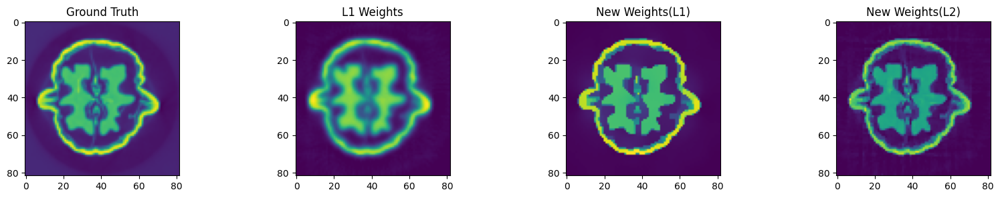

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(20,3))
ax[1].imshow(np.clip(x_l1, 0, 1).reshape(nx,ny).T)
ax[2].imshow(np.clip(x_new_weights_l1, 0, 1).reshape(nx,ny).T)
ax[3].imshow(np.clip(x_new_weights_l2, 0, 1).reshape(nx,ny).T)
ax[0].imshow(x_true.reshape(nx,ny).T)
ax[0].set_title('Ground Truth')
ax[1].set_title('L1 Weights')
ax[2].set_title('New Weights(L1)')
ax[3].set_title('New Weights(L2)')
#ax[3].imshow(np.clip(b, 0, 1).reshape(nx,ny))

In [ ]:
nx = 128
ny = nx
problem = generate_problem(phantom_name='shepp_logan', nx=nx
                           , ny=ny, t_end=1
                           , v_max=1, v_min=0, padding=3, root='',add =0,)
x_true = problem['u_traj'][0]

shape = problem['shape']
nx,ny = shape


views = 45

theta = np.linspace(0, 45, views, endpoint=False)
A = create_forward_op_ct(nx, ny, theta=theta,s=2)
b_true = A @ x_true.reshape(-1, 1) 

noise_level = 0.005
noise = np.random.randn(b_true.shape[0]).reshape((-1, 1))
e = noise_level * np.linalg.norm(b_true) / np.linalg.norm(noise) * noise
e = e.reshape((-1, 1))

b = b_true + e

delta = la.norm(e) 
L = gen_first_derivative_operator_2D(nx, ny)

Problem Description:
- Phantom: shepp_logan
- Image size: 128 x 128
- Number of frames: 1
- Output directory: /problem_128_by_128_shepp_logan_20260211_120016



c:\Users\okuno\anaconda3\Lib\site-packages\scipy\sparse\_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


generating basis...: 100%|██████████| 5/5 [00:00<?, ?it/s]
C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 0 : RRE 0.26089279039608704 V_rank: 15
Outer Iteration 1 : RRE 0.149397949225924 V_rank: 5
Outer Iteration 2 : RRE 0.12670930682116827 V_rank: 15
Outer Iteration 3 : RRE 0.08706225148460274 V_rank: 5
Stopping naturally: x stabilized at iteration 40
Outer Iteration 4 : RRE 0.07108630253294547 V_rank: 6
Stopping naturally: x stabilized at iteration 39
Outer Iteration 5 : RRE 0.05261731957029346 V_rank: 6
Stopping naturally: x stabilized at iteration 19
Outer Iteration 6 : RRE 0.048491904194682384 V_rank: 6
Stopping naturally: x stabilized at iteration 19
Outer Iteration 7 : RRE 0.0369680642717155 V_rank: 6
Stopping naturally: x stabilized at iteration 19
Outer Iteration 8 : RRE 0.03543031741922021 V_rank: 6
Stopping naturally: x stabilized at iteration 19
Outer Iteration 9 : RRE 0.033866643479237984 V_rank: 6
TOTAL ITER: 371


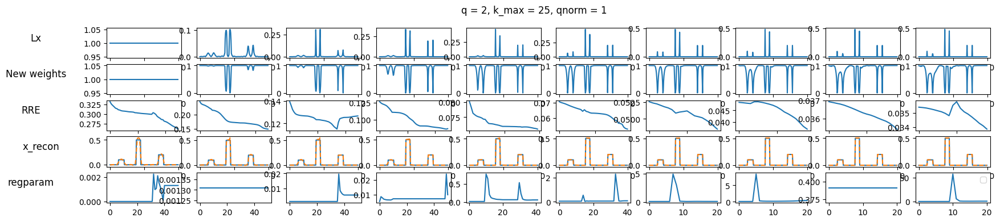

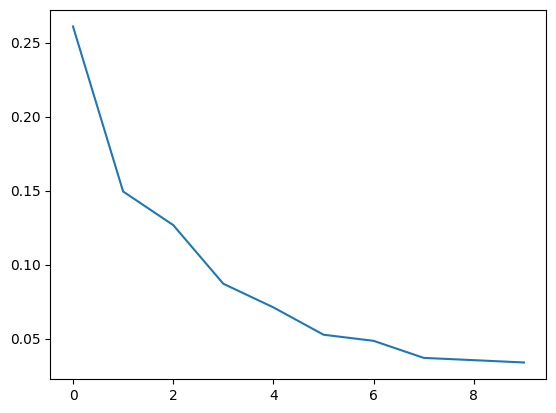

In [ ]:
x_new_weights_l1, infos_new_weights_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='dp', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-4, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<?, ?it/s]
C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\2213550720.py:78: RuntimeWarning: divide by zero encountered in divide
  beta_new = beta - f/f_prime
C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\2213550720.py:80: RuntimeWarning: invalid value encountered in subtract
  if abs(beta_new - beta) < 10**(-12)* beta:
C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Stopping naturally: x stabilized at iteration 44
Outer Iteration 0 : RRE 0.30803577094006207 V_rank: 10
Outer Iteration 1 : RRE 0.17665897729266522 V_rank: 20
Stopping naturally: x stabilized at iteration 46
Outer Iteration 2 : RRE 0.15182730989175994 V_rank: 7
Outer Iteration 3 : RRE 0.1125956837475895 V_rank: 17
Outer Iteration 4 : RRE 0.08563552010936241 V_rank: 7
Stopping naturally: x stabilized at iteration 18
Outer Iteration 5 : RRE 0.08035858040133999 V_rank: 6
Stopping naturally: x stabilized at iteration 19
Outer Iteration 6 : RRE 0.07730100621476851 V_rank: 6
Stopping naturally: x stabilized at iteration 19
Outer Iteration 7 : RRE 0.07711780862777454 V_rank: 6
Stopping naturally: x stabilized at iteration 3
Outer Iteration 8 : RRE 0.07707162694883482 V_rank: 10
Stopping naturally: x stabilized at iteration 9
Outer Iteration 9 : RRE 0.07671198401118932 V_rank: 20
TOTAL ITER: 325


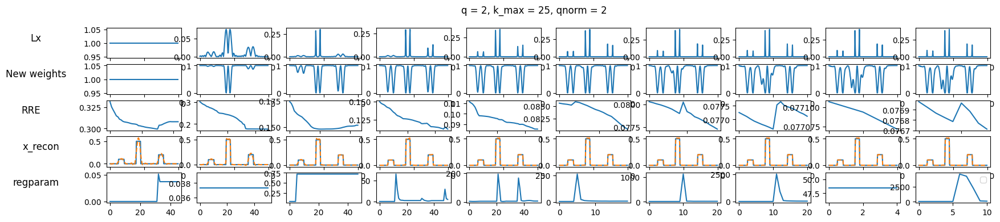

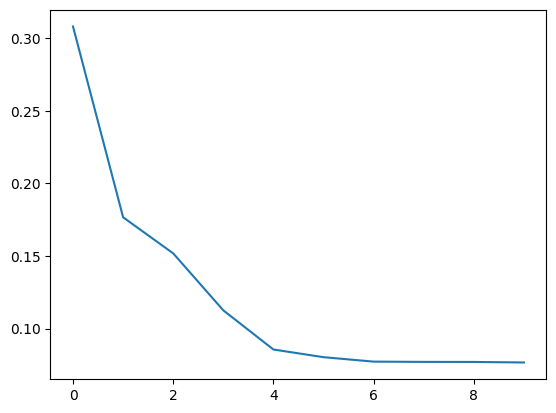

In [ ]:
x_new_weights_l2, infos_new_weights_l2, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
    pd=5, mov=20, rg='dp', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-4, d_limit=1e-3
)

generating basis...: 100%|██████████| 5/5 [00:00<?, ?it/s]
C:\Users\okuno\AppData\Local\Temp\ipykernel_46416\1329299983.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


epsilon 0.001 max u 0.0 median u 0.0 25th percentile u 0.0 75th percentile u 0.0
epsilon 0.0045979647766307835 max u 0.06822776053039795 median u 0.0045979647766307835 25th percentile u 0.0012811907375829097 75th percentile u 0.013779968417661187
epsilon 0.004664172130658375 max u 0.07069792360415242 median u 0.004664172130658375 25th percentile u 0.0013862551976347411 75th percentile u 0.01359086087186396
epsilon 0.004810775972175087 max u 0.07223845001153767 median u 0.004810775972175087 25th percentile u 0.0014532055516513782 75th percentile u 0.013108179511537095
epsilon 0.004490251256173663 max u 0.07377445940068508 median u 0.004490251256173663 25th percentile u 0.0014069180267674986 75th percentile u 0.011436150892812932
epsilon 0.004209793021315019 max u 0.07526083461338515 median u 0.004209793021315019 25th percentile u 0.0011417522263544165 75th percentile u 0.011414031582109085
epsilon 0.004069341568213355 max u 0.07578632792868767 median u 0.004069341568213355 25th percenti

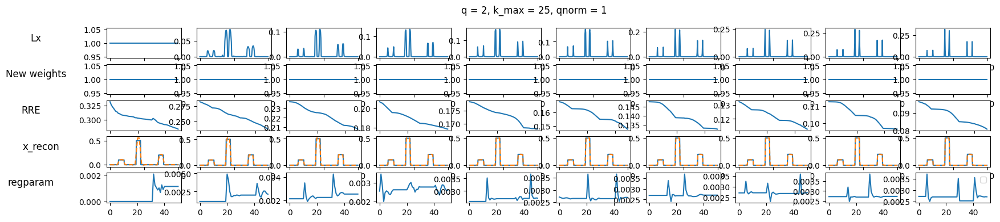

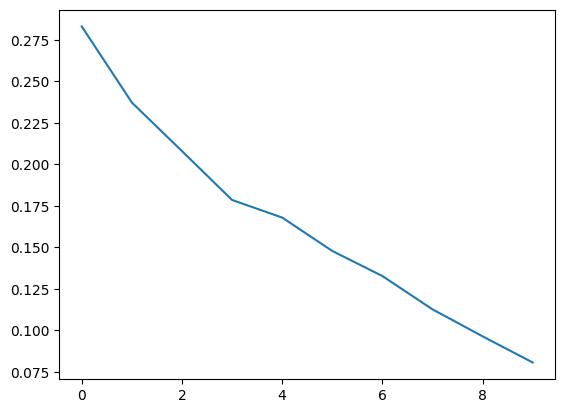

In [ ]:
x_l1, infos_l1, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='dp', n_fig=10, non_neg=False, epsilon = 1e-3, tolambdah=1e-6, break_lambdah=False, break_x=True, break_tol=1e-6, d_limit=1e-3, new_weights=False, adaptive_epsilon=True
)

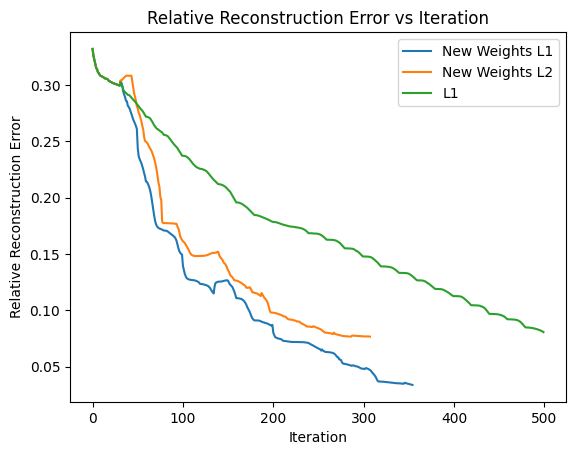

In [ ]:
rre_new_weights_l1 = np.concatenate([info['relError'] for info in infos_new_weights_l1])
rre_new_weights_l2 = np.concatenate([info['relError'] for info in infos_new_weights_l2])
rre_l1 = np.concatenate([info['relError'] for info in infos_l1])
plt.plot(rre_new_weights_l1, label='New Weights L1')
plt.plot(rre_new_weights_l2, label='New Weights L2')
plt.plot(rre_l1, label='L1')
plt.xlabel('Iteration')
plt.ylabel('Relative Reconstruction Error') 
plt.title('Relative Reconstruction Error vs Iteration')
plt.legend()

Text(0.5, 1.0, 'New Weights(L2)')

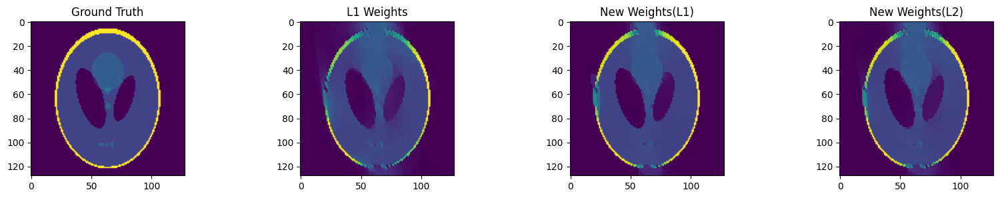

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(20,3))
ax[1].imshow(np.clip(x_l1, 0, 1).reshape(nx,ny))
ax[2].imshow(np.clip(x_new_weights_l1, 0, 1).reshape(nx,ny))
ax[3].imshow(np.clip(x_new_weights_l2, 0, 1).reshape(nx,ny))
ax[0].imshow(x_true.reshape(nx,ny))
ax[0].set_title('Ground Truth')
ax[1].set_title('L1 Weights')
ax[2].set_title('New Weights(L1)')
ax[3].set_title('New Weights(L2)')
#ax[3].imshow(np.clip(b, 0, 1).reshape(nx,ny))

Text(0.5, 1.0, 'New Weights(L1)')

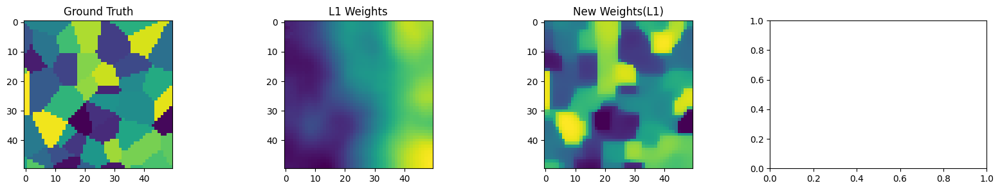

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(20,3))
ax[1].imshow(np.clip(x_l1, 0, 1).reshape(nx,ny).T)
ax[2].imshow(np.clip(x_new_weights_l1, 0, 1).reshape(nx,ny).T)
ax[0].imshow(x_true.reshape(nx,ny).T)
ax[0].set_title('Ground Truth')
ax[1].set_title('L1 Weights')
ax[2].set_title('New Weights(L1)')
#ax[3].imshow(np.clip(b, 0, 1).reshape(nx,ny))

In [ ]:
problem = generate_problem(phantom_name='grains', nx=100
                           , ny=None, t_end=1
                           , v_max=1, v_min=0, padding=3, root='exp/exp1',add =0,)
u_traj = problem['u_traj']

shape = problem['shape']
nx,ny = shape
output_dir = problem['output_dir']
u_traj = [(u).reshape(nx,ny).reshape(-1,1) for u in u_traj]#[u/la.norm(u.flatten()) for u in u_traj]
t_end = problem['t_end']
nt = t_end
#u_traj=[u_traj[0]]*t_end
#u_traj = [np.ones((nx,ny)).reshape(-1,1)*1 for u in u_traj] #u_traj
seed = 7221 #np.random.randint(10000)
print(seed)#7738
seed = 8448 #np.random.randint(10000)  #7221 #4483 #np.random.randint(10000) #5294
np.random.seed(seed)#2266#705#7250#9869#8763
s =2#*nx
s_nom = s
nt = t_end
theta_pert_mag =  0#*(64/nx)


s_pert_mag =  0#*nx/64#*(64/nx) #*0.1*s  
n_perts = 1
# theta = np.linspace(0,180,180, endpoint=False) #np.arange(0,358,2); #int(np.pi*nx/2)
n_views = 100 #int(np.pi*nx/(2*nt)) # 180//nt
theta = np.linspace(0,60,n_views*nt, endpoint=False) # # np.concatenate((np.linspace(0,30,n_views*nt//2, endpoint=False), np.linspace(90,180,n_views*nt//2, endpoint=False))) #np.random.choice(np.linspace(0,180,n_views*nt, endpoint=False), n_views*nt, replace=False) if nt>1 else np.linspace(0,180,n_views*nt, endpoint=False) #np.linspace(0,180,180, endpoint=False)

L = gen_first_derivative_operator_2D(nx,ny)
noise_level = 5e-3#1e-2 #
exclusion_radius = 0.05
theta_pert_true = None #np.array([[0.1]])#None #None #sample_two_intervals(n_perts, theta_pert_mag,exclusion_radius).reshape(-1,1)
s_pert_true =  None #0**(nx/64)# None #sample_two_intervals(n_perts, s_pert_mag,exclusion_radius).reshape(-1,1)


result = generate_perturbed_data_and_summary(
    u_traj, L, nx, ny, nt, s, theta, theta_pert_mag,
    s_pert_mag, n_perts, noise_level, theta_pert_true, s_pert_true,exclusion_radius,
    output_dir=output_dir,seed=seed,operator_type='ct'
)

# You can access data like:
x_true = result['x_true']

A_bar = result['A_bar']
A = result['A']
b = result['b']
b_true_bar = result['b_true_bar']


delta = la.norm(b-b_true_bar)

Problem Description:
- Phantom: grains
- Image size: 100 x 100
- Number of frames: 1
- Output directory: exp/exp1/problem_100_by_100_grains_20260211_082309

Description saved to exp/exp1/problem_100_by_100_grains_20260211_082309\phantom_description.txt
7221
--- Perturbation Data Generation Summary ---
Random seed used for generation: 8448
Number of perturbations: 1
Perturbation magnitudes - theta: 0, s: 0
Optimization flags:
  Optimize theta perturbation (p1): False
  Optimize s perturbation (p0): False
  Optimize both entries: False
True perturbation parameters p_true:
[[0 0]]
Image size: 100 x 100
Number of time frames: 1
Noise level: 0.005
--------------------------------------------
Description saved to exp/exp1/problem_100_by_100_grains_20260211_082309\tomo_perturbation_summary.txt


In [ ]:
A_bar.shape, b.shape, x_true.shape, L.shape

((14100, 10000), (14100, 1), (10000, 1), (20000, 10000))

Outer Iteration 0 : RRE 0.95153176825859 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_28408\657927973.py:112: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.9329062571954353 V_rank: 5
Outer Iteration 2 : RRE 0.9492788417614003 V_rank: 5
Outer Iteration 3 : RRE 0.9329620360708587 V_rank: 5
Outer Iteration 4 : RRE 0.9334491740157237 V_rank: 5
Outer Iteration 5 : RRE 0.9334901155618748 V_rank: 5
Outer Iteration 6 : RRE 0.9335571897690442 V_rank: 5
Outer Iteration 7 : RRE 0.9331892837157221 V_rank: 5
Outer Iteration 8 : RRE 0.9330421790992032 V_rank: 5
Outer Iteration 9 : RRE 0.932965484886361 V_rank: 5
TOTAL ITER: 209


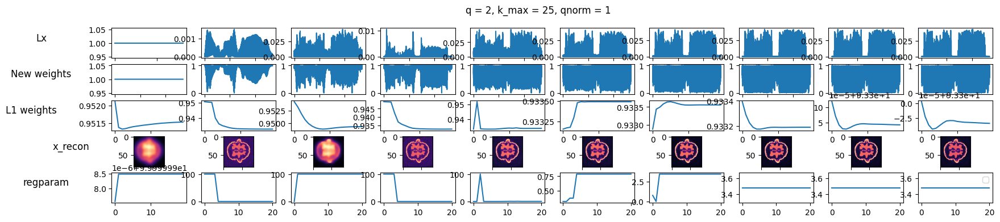

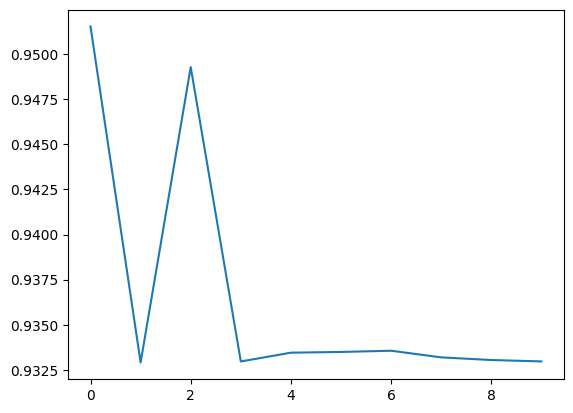

TypeError: iterative_reconstruction_1d() got an unexpected keyword argument 'break_'

In [ ]:
x_t, infos, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b.flatten(order='F').reshape(-1,1), x_true, L, nx, ny, delta,
    N=10, n_iter_first=20, n_iter_rest=20,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_ = True, break_tol=1e-6, d_limit=1e-3, use_non_neg = True
)

Outer Iteration 0 : RRE 0.9330127575358337 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_28408\657927973.py:112: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.9336272733181397 V_rank: 5
Outer Iteration 2 : RRE 0.9333485829986784 V_rank: 5
Outer Iteration 3 : RRE 0.9333429660624427 V_rank: 5
Stopping naturally: lambda stabilized at 99.9999984879081
Outer Iteration 4 : RRE 0.933197118625256 V_rank: 9
Stopping naturally: lambda stabilized at 99.9999984879081
Outer Iteration 5 : RRE 0.9329357919205487 V_rank: 13
Stopping naturally: lambda stabilized at 99.9999984879081
Outer Iteration 6 : RRE 0.9328942057559526 V_rank: 17
Stopping naturally: lambda stabilized at 99.9999984879081
Outer Iteration 7 : RRE 0.9328505000290621 V_rank: 21
Stopping naturally: lambda stabilized at 99.9999984879081
Outer Iteration 8 : RRE 0.9328131250595906 V_rank: 25
Stopping naturally: lambda stabilized at 99.9999984879081
Outer Iteration 9 : RRE 0.9327941233779535 V_rank: 10
TOTAL ITER: 109


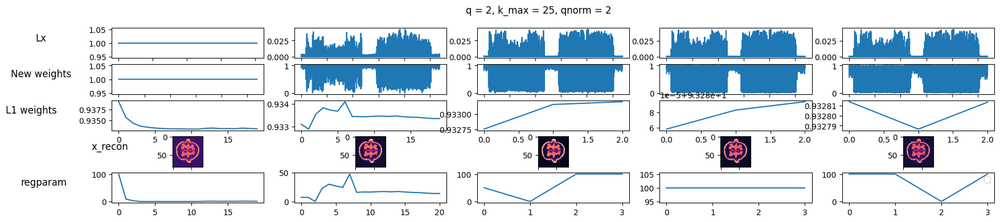

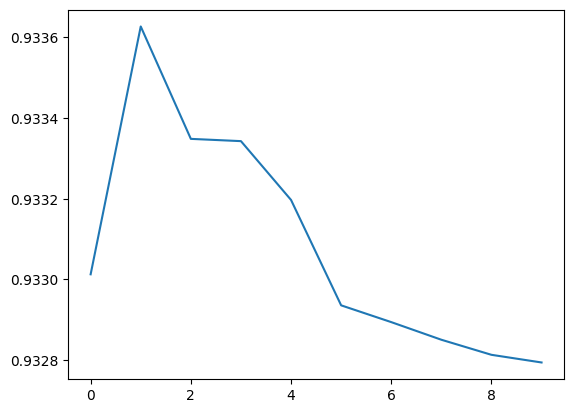

In [ ]:
x_t, infos, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b.flatten(order='F').reshape(-1,1) , x_true, L, nx, ny, delta,
    N=10, n_iter_first=20, n_iter_rest=20,
    q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=5, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_ = True, break_tol=1e-6, d_limit=1e-3, use_non_neg = True
)

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(20,3))
ax[1].imshow(np.clip(x_t_, 0, 1).reshape(nx,ny).T)
ax[2].imshow(np.clip(x_t, 0, 1).reshape(nx,ny).T)
ax[0].imshow(x_true.reshape(nx,ny).T)
#ax[3].imshow(np.clip(b, 0, 1).reshape(nx,ny))

running MMGKS...: 100%|██████████| 600/600 [01:09<00:00,  8.66it/s]


0.10377507434496887


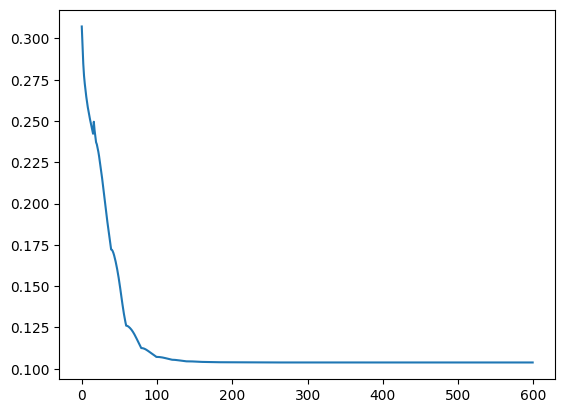

In [ ]:
n_iter=600
pd = 5
mov = 20
x_t_,info_t,V_t_,l_t = RMMGKS(A, b.flatten(order='F').reshape((-1,1)), L, pnorm=2, qnorm=1, projection_dim=pd,
                n_iter = n_iter, regparam ='dp', x_true = x_true.reshape((-1,1)), epsilon=1e-2,delta=delta,non_neg=False,power=0.5,x0=None, #np.zeros(x_true.shape),#None,
                V0= None,kmin=pd, l_max = pd+mov,l_curve_plot=False,
                compute_V=False, tqdm_=True, lambdah=0,tolambdah=1e-6, break_ = False, break_check=1e-6, break_tol=1e-6) 

#print(V_t.shape)
plt.plot(info_t['relError'])  
print(info_t['relError'][-1])

running MMGKS...: 100%|██████████| 600/600 [01:46<00:00,  5.63it/s]


0.12194887209297228


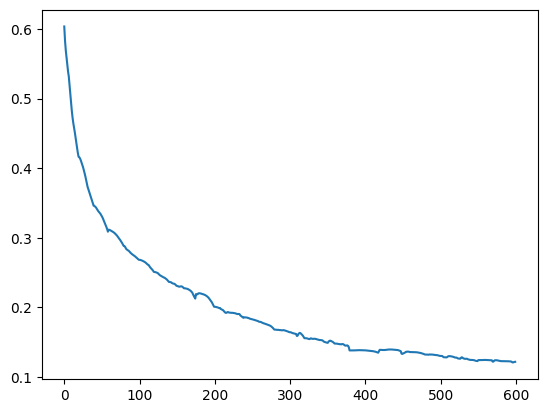

In [ ]:
n_iter=600
pd = 5
mov = 20
x_t_,info_t,V_t_,l_t = RMMGKS(A, b.flatten(order='F').reshape((-1,1)), L, pnorm=2, qnorm=1, projection_dim=pd,
                n_iter = n_iter, regparam ='gcv', x_true = x_true.reshape((-1,1)), epsilon=1e-3,delta=delta,non_neg=False,power=0.5,x0=None, #np.zeros(x_true.shape),#None,
                V0= None,kmin=pd, l_max = pd+mov,l_curve_plot=False,
                compute_V=False, tqdm_=True, lambdah=0,tolambdah=1e-6, break_ = False, break_check=1e-6, break_tol=1e-6) 

#print(V_t.shape)
plt.plot(info_t['relError'])  
print(info_t['relError'][-1])

running MMGKS...: 100%|██████████| 600/600 [00:57<00:00, 10.43it/s]


3.0621718952631003


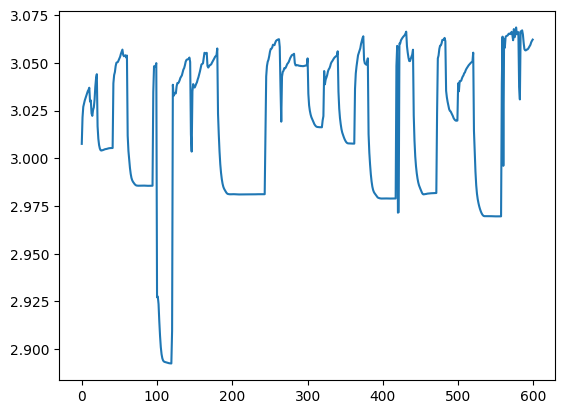

In [ ]:
n_iter=600
pd = 5
mov = 20
x_t_,info_t,V_t_,l_t = RMMGKS(A, b.flatten(order='F').reshape((-1,1)), L, pnorm=2, qnorm=1, projection_dim=pd,
                n_iter = n_iter, regparam ='gcv', x_true = x_true.reshape((-1,1)), epsilon=1e-3,delta=delta,non_neg=True,power=0.5,x0=None, #np.zeros(x_true.shape),#None,
                V0= None,kmin=pd, l_max = pd+mov,l_curve_plot=False,
                compute_V=False, tqdm_=True, lambdah=0,tolambdah=1e-6, break_ = False, break_check=1e-6, break_tol=1e-6) 

#print(V_t.shape)
plt.plot(info_t['relError'])  
print(info_t['relError'][-1])

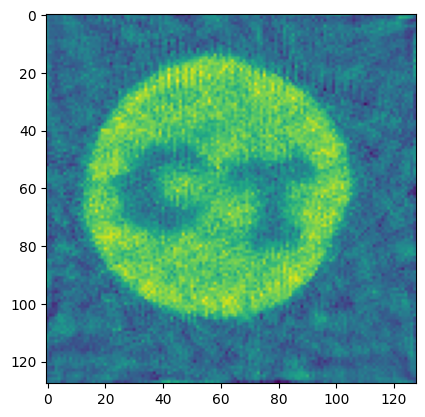

In [ ]:
plt.imshow(x_t_.reshape(nx,ny).T)

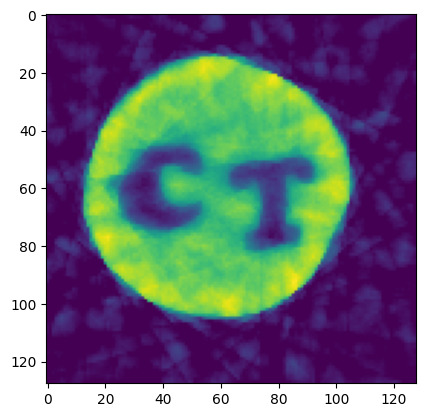

In [ ]:
plt.imshow(x_t_.reshape(nx,ny).T)

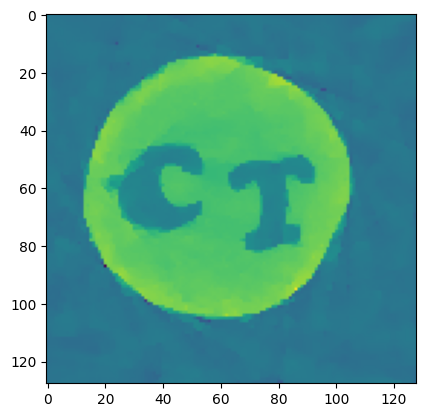

In [ ]:
plt.imshow(x_new_weights_l1.reshape(nx,ny).T)

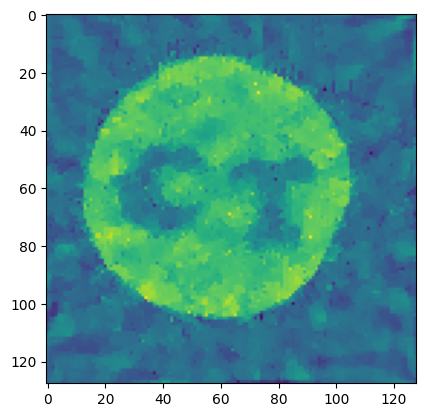

In [ ]:
plt.imshow(x_new_weights_l1.reshape(nx,ny).T)

In [ ]:
plt.imshow(x_new_weights_l2.reshape(nx,ny).T)

ValueError: cannot reshape array of size 6724 into shape (128,128)

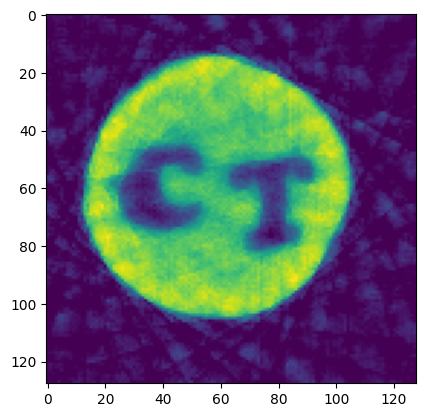

In [ ]:
plt.imshow(x_t_.reshape(nx,ny).T)

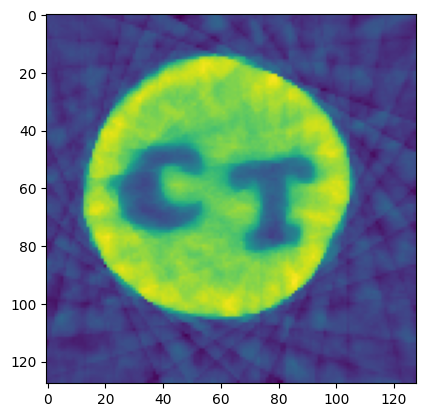

In [ ]:
plt.imshow(x_t_.reshape(nx,ny).T)

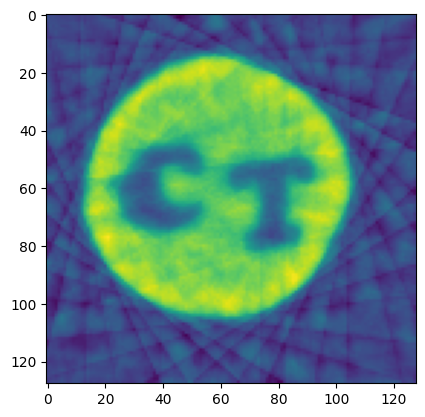

In [ ]:
plt.imshow(x_t_.reshape(nx,ny).T)

running MMGKS...: 100%|██████████| 600/600 [01:01<00:00,  9.69it/s]


0.21695307981161768


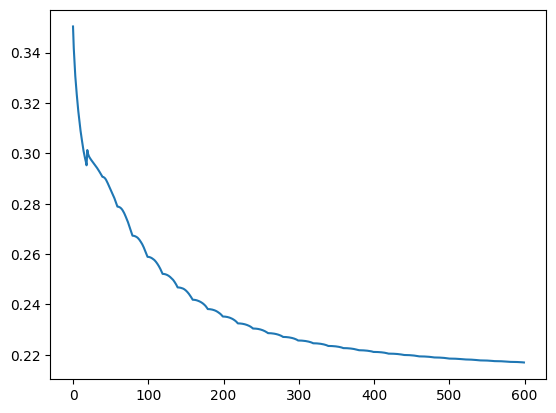

In [ ]:
n_iter=600
pd = 5
mov = 20
x_t_,info_t,V_t_,l_t = RMMGKS(A, b.flatten(order='F').reshape((-1,1)), L, pnorm=2, qnorm=1, projection_dim=pd,
                n_iter = n_iter, regparam ='dp', x_true = x_true.reshape((-1,1)), epsilon=1e-3,delta=delta,non_neg=False,power=0.5,x0=None, #np.zeros(x_true.shape),#None,
                V0= None,kmin=pd, l_max = pd+mov,l_curve_plot=False,
                compute_V=False, tqdm_=True, lambdah=0,tolambdah=1e-6, break_ = False, break_check=1e-6, break_tol=1e-6) 

#print(V_t.shape)
plt.plot(info_t['relError'])  
print(info_t['relError'][-1])

running MMGKS...: 100%|██████████| 600/600 [01:01<00:00,  9.69it/s]


0.21695307981161768


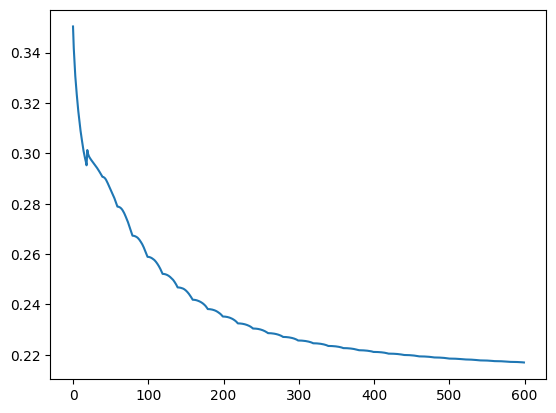

In [ ]:
n_iter=600
pd = 5
mov = 20
x_t_,info_t,V_t_,l_t = RMMGKS(A, b.flatten(order='F').reshape((-1,1)), L, pnorm=2, qnorm=1, projection_dim=pd,
                n_iter = n_iter, regparam ='dp', x_true = x_true.reshape((-1,1)), epsilon=1e-3,delta=delta,non_neg=False,power=0.5,x0=None, #np.zeros(x_true.shape),#None,
                V0= None,kmin=pd, l_max = pd+mov,l_curve_plot=False,
                compute_V=False, tqdm_=True, lambdah=0,tolambdah=1e-6, break_ = False, break_check=1e-6, break_tol=1e-6) 

#print(V_t.shape)
plt.plot(info_t['relError'])  
print(info_t['relError'][-1])

running MMGKS...:   0%|          | 0/600 [00:00<?, ?it/s]C:\Users\okuno\AppData\Local\Temp\ipykernel_28408\2286507551.py:123: RuntimeWarning: invalid value encountered in scalar divide
  gcv_vals.append(gcv_numerator_tgsvd/gcv_denominator_tgsvd)
running MMGKS...: 100%|██████████| 600/600 [00:59<00:00, 10.15it/s]

0.34079164779338345


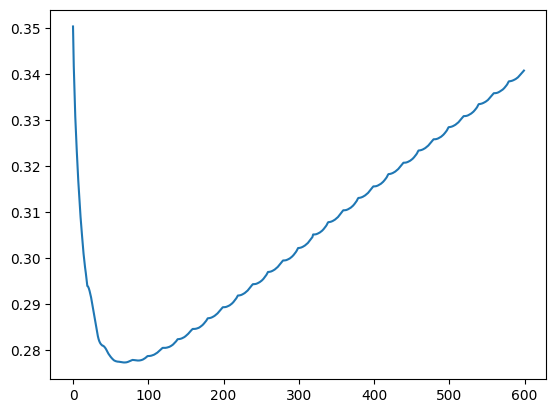

In [ ]:
n_iter=600
pd = 5
mov = 20
x_t_,info_t,V_t_,l_t = RMMGKS(A, b.flatten(order='F').reshape((-1,1)), L, pnorm=2, qnorm=1, projection_dim=pd,
                n_iter = n_iter, regparam ='gcv', x_true = x_true.reshape((-1,1)), epsilon=1e-3,delta=delta,non_neg=False,power=0.5,x0=None, #np.zeros(x_true.shape),#None,
                V0= None,kmin=pd, l_max = pd+mov,l_curve_plot=False,
                compute_V=False, tqdm_=True, lambdah=0,tolambdah=1e-6, break_ = False, break_check=1e-6, break_tol=1e-6,gcvtype='tgsvd') 

#print(V_t.shape)
plt.plot(info_t['relError'])  
print(info_t['relError'][-1])

running MMGKS...: 100%|██████████| 600/600 [01:58<00:00,  5.07it/s]

0.19297867385024872


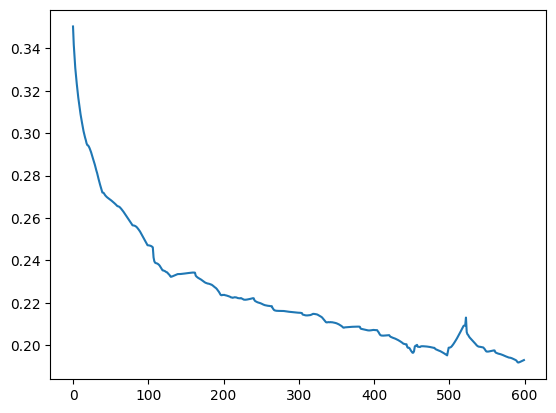

In [ ]:
n_iter=600
pd = 5
mov = 20
x_t_,info_t,V_t_,l_t = RMMGKS(A, b.flatten(order='F').reshape((-1,1)), L, pnorm=2, qnorm=1, projection_dim=pd,
                n_iter = n_iter, regparam ='gcv', x_true = x_true.reshape((-1,1)), epsilon=1e-3,delta=delta,non_neg=False,power=0.5,x0=None, #np.zeros(x_true.shape),#None,
                V0= None,kmin=pd, l_max = pd+mov,l_curve_plot=False,
                compute_V=False, tqdm_=True, lambdah=0,tolambdah=1e-6, break_ = False, break_check=1e-6, break_tol=1e-6) 

#print(V_t.shape)
plt.plot(info_t['relError'])  
print(info_t['relError'][-1])

running MMGKS...: 100%|██████████| 200/200 [00:07<00:00, 25.35it/s]

0.3911515168046564


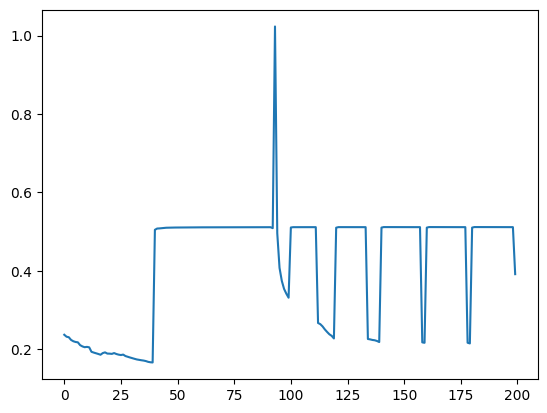

In [ ]:
n_iter=200
pd = 5
mov = 20
x_t_,info_t,V_t_,l_t = RMMGKS(A, b.flatten(order='F').reshape((-1,1)), L, pnorm=2, qnorm=1, projection_dim=pd,
                n_iter = n_iter, regparam ='gcv', x_true = x_true.reshape((-1,1)), epsilon=1e-2,delta=delta,non_neg=False,power=0.5,x0=None, #np.zeros(x_true.shape),#None,
                V0= None,kmin=pd, l_max = pd+mov,l_curve_plot=False,
                compute_V=False, tqdm_=True, lambdah=0,tolambdah=0, break_ = False, break_check=1e-6, break_tol=1e-6) 

#print(V_t.shape)
plt.plot(info_t['relError'])  
print(info_t['relError'][-1])

In [ ]:
L= gen_first_derivative_operator_2D(nx,ny)

c:\Users\okuno\anaconda3\Lib\site-packages\scipy\sparse\_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


generating basis...:   0%|          | 0/5 [00:00<?, ?it/s]

running MMGKS...: 100%|██████████| 600/600 [03:20<00:00,  2.99it/s]


0.21547309921026278


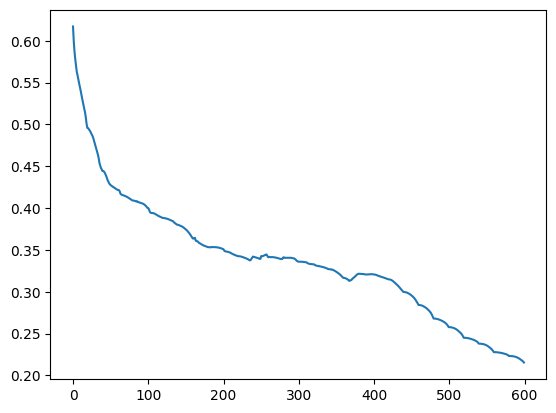

In [ ]:
n_iter=600
pd = 5
mov = 20
x_t_,info_t,V_t_,l_t = RMMGKS(A, b.flatten(order='F').reshape((-1,1)), L, pnorm=2, qnorm=1, projection_dim=pd,
                n_iter = n_iter, regparam ='gcv', x_true = x_true.reshape((-1,1)), epsilon=1e-3,delta=delta,non_neg=False,power=0.5,x0=None, #np.zeros(x_true.shape),#None,
                V0= None,kmin=pd, l_max = pd+mov,l_curve_plot=False,
                compute_V=False, tqdm_=True, lambdah=0,tolambdah=1e-6, break_ = False, break_check=1e-6, break_tol=1e-6) 

#print(V_t.shape)
plt.plot(info_t['relError'])  
print(info_t['relError'][-1])

running MMGKS...: 100%|██████████| 600/600 [01:03<00:00,  9.50it/s]

0.21695307981161768


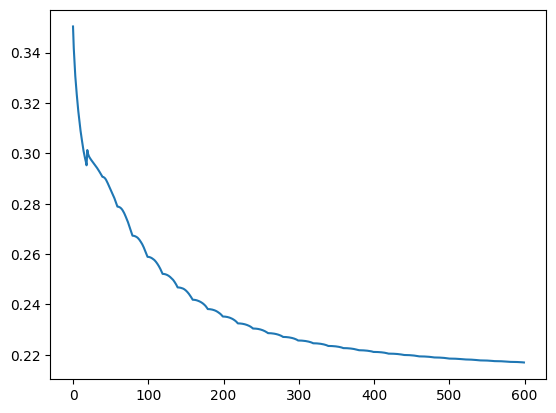

In [ ]:
n_iter=600
pd = 5
mov = 20
x_t_,info_t,V_t_,l_t = RMMGKS(A, b.flatten(order='F').reshape((-1,1)), L, pnorm=2, qnorm=1, projection_dim=pd,
                n_iter = n_iter, regparam ='dp', x_true = x_true.reshape((-1,1)), epsilon=1e-3,delta=delta,non_neg=False,power=0.5,x0=None, #np.zeros(x_true.shape),#None,
                V0= None,kmin=pd, l_max = pd+mov,l_curve_plot=False,
                compute_V=False, tqdm_=True, lambdah=0,tolambdah=1e-6, break_ = False, break_check=1e-6, break_tol=1e-6) 

#print(V_t.shape)
plt.plot(info_t['relError'])  
print(info_t['relError'][-1])

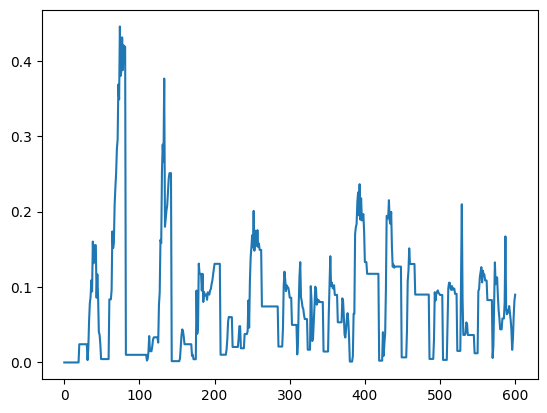

In [ ]:
plt.plot(info_t['regParam_history'])

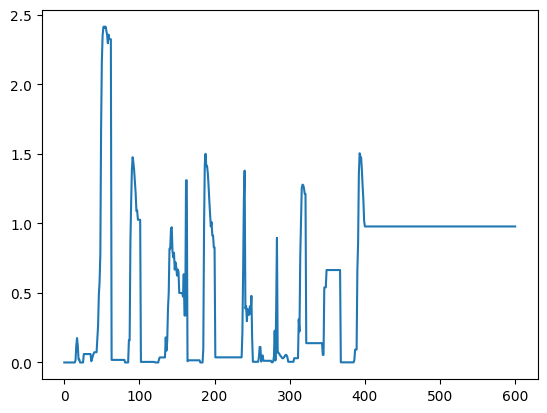

In [ ]:
plt.plot(info_t['regParam_history'])

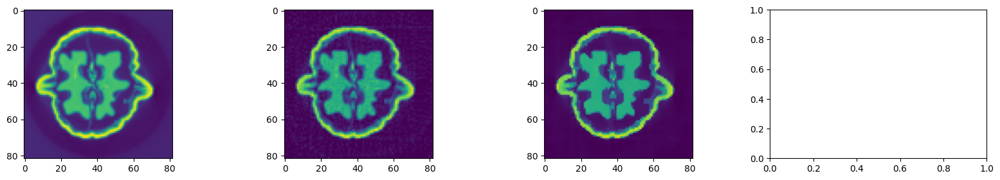

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(20,3))
ax[1].imshow(np.clip(x_t_, 0, 1).reshape(nx,ny).T)
ax[2].imshow(np.clip(x_t, 0, 1).reshape(nx,ny).T)
ax[0].imshow(x_true.reshape(nx,ny).T)
#ax[3].imshow(np.clip(b, 0, 1).reshape(nx,ny))

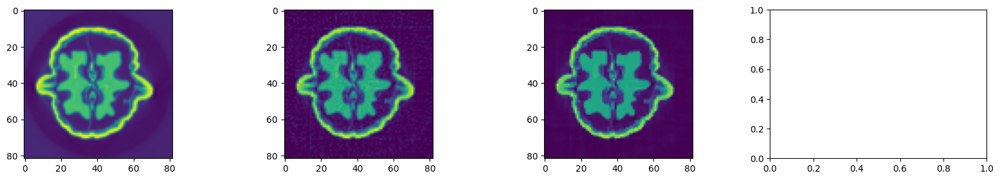

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(20,3))
ax[1].imshow(np.clip(x_t_, 0, 1).reshape(nx,ny).T)
ax[2].imshow(np.clip(x_t, 0, 1).reshape(nx,ny).T)
ax[0].imshow(x_true.reshape(nx,ny).T)
#ax[3].imshow(np.clip(b, 0, 1).reshape(nx,ny))

In [ ]:
problem = generate_problem(phantom_name='grains', nx=100
                           , ny=None, t_end=1
                           , v_max=1, v_min=0, padding=3, root='exp/exp1',add =0,)
u_traj = problem['u_traj']

shape = problem['shape']
nx,ny = shape
output_dir = problem['output_dir']
u_traj = [(u).reshape(nx,ny).reshape(-1,1) for u in u_traj]#[u/la.norm(u.flatten()) for u in u_traj]
t_end = problem['t_end']
nt = t_end
#u_traj=[u_traj[0]]*t_end
#u_traj = [np.ones((nx,ny)).reshape(-1,1)*1 for u in u_traj] #u_traj
seed = 7221 #np.random.randint(10000)
print(seed)#7738
seed = 8448 #np.random.randint(10000)  #7221 #4483 #np.random.randint(10000) #5294
np.random.seed(seed)#2266#705#7250#9869#8763
s =2#*nx
s_nom = s
nt = t_end
theta_pert_mag =  0#*(64/nx)


s_pert_mag =  0#*nx/64#*(64/nx) #*0.1*s  
n_perts = 1
# theta = np.linspace(0,180,180, endpoint=False) #np.arange(0,358,2); #int(np.pi*nx/2)
n_views = 100 #int(np.pi*nx/(2*nt)) # 180//nt
theta = np.linspace(0,60,n_views*nt, endpoint=False) # # np.concatenate((np.linspace(0,30,n_views*nt//2, endpoint=False), np.linspace(90,180,n_views*nt//2, endpoint=False))) #np.random.choice(np.linspace(0,180,n_views*nt, endpoint=False), n_views*nt, replace=False) if nt>1 else np.linspace(0,180,n_views*nt, endpoint=False) #np.linspace(0,180,180, endpoint=False)

L = gen_first_derivative_operator_2D(nx,ny)
noise_level = 5e-3#1e-2 #
exclusion_radius = 0.05
theta_pert_true = None #np.array([[0.1]])#None #None #sample_two_intervals(n_perts, theta_pert_mag,exclusion_radius).reshape(-1,1)
s_pert_true =  None #0**(nx/64)# None #sample_two_intervals(n_perts, s_pert_mag,exclusion_radius).reshape(-1,1)


result = generate_perturbed_data_and_summary(
    u_traj, L, nx, ny, nt, s, theta, theta_pert_mag,
    s_pert_mag, n_perts, noise_level, theta_pert_true, s_pert_true,exclusion_radius,
    output_dir=output_dir,seed=seed,operator_type='ct'
)

# You can access data like:
x_true = result['x_true']

A_bar = result['A_bar']
A = result['A']
b = result['b']
b_true_bar = result['b_true_bar']


delta = la.norm(b-b_true_bar)

Problem Description:
- Phantom: grains
- Image size: 100 x 100
- Number of frames: 1
- Output directory: exp/exp1/problem_100_by_100_grains_20260211_082309

Description saved to exp/exp1/problem_100_by_100_grains_20260211_082309\phantom_description.txt
7221
--- Perturbation Data Generation Summary ---
Random seed used for generation: 8448
Number of perturbations: 1
Perturbation magnitudes - theta: 0, s: 0
Optimization flags:
  Optimize theta perturbation (p1): False
  Optimize s perturbation (p0): False
  Optimize both entries: False
True perturbation parameters p_true:
[[0 0]]
Image size: 100 x 100
Number of time frames: 1
Noise level: 0.005
--------------------------------------------
Description saved to exp/exp1/problem_100_by_100_grains_20260211_082309\tomo_perturbation_summary.txt


In [ ]:
A_bar.shape, b.shape, x_true.shape, L.shape

((14100, 10000), (14100, 1), (10000, 1), (20000, 10000))

Outer Iteration 0 : RRE 0.95153176825859 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_28408\657927973.py:112: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.9329062571954353 V_rank: 5
Outer Iteration 2 : RRE 0.9492788417614003 V_rank: 5
Outer Iteration 3 : RRE 0.9329620360708587 V_rank: 5
Outer Iteration 4 : RRE 0.9334491740157237 V_rank: 5
Outer Iteration 5 : RRE 0.9334901155618748 V_rank: 5
Outer Iteration 6 : RRE 0.9335571897690442 V_rank: 5
Outer Iteration 7 : RRE 0.9331892837157221 V_rank: 5
Outer Iteration 8 : RRE 0.9330421790992032 V_rank: 5
Outer Iteration 9 : RRE 0.932965484886361 V_rank: 5
TOTAL ITER: 209


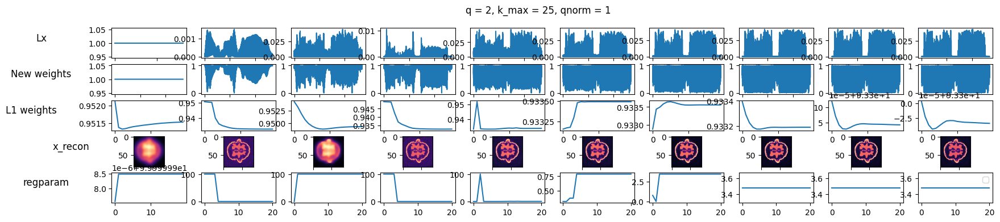

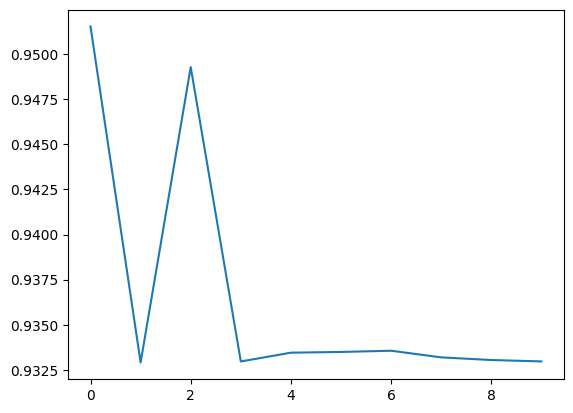

In [ ]:
x_t, infos, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b.flatten(order='F').reshape(-1,1), x_true, L, nx, ny, delta,
    N=10, n_iter_first=20, n_iter_rest=20,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_ = True, break_tol=1e-6, d_limit=1e-3, use_non_neg = True
)

Outer Iteration 0 : RRE 0.9330127575358337 V_rank: 5


C:\Users\okuno\AppData\Local\Temp\ipykernel_28408\657927973.py:112: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.9336272733181397 V_rank: 5
Outer Iteration 2 : RRE 0.9333485829986784 V_rank: 5
Outer Iteration 3 : RRE 0.9333429660624427 V_rank: 5
Stopping naturally: lambda stabilized at 99.9999984879081
Outer Iteration 4 : RRE 0.933197118625256 V_rank: 9
Stopping naturally: lambda stabilized at 99.9999984879081
Outer Iteration 5 : RRE 0.9329357919205487 V_rank: 13
Stopping naturally: lambda stabilized at 99.9999984879081
Outer Iteration 6 : RRE 0.9328942057559526 V_rank: 17
Stopping naturally: lambda stabilized at 99.9999984879081
Outer Iteration 7 : RRE 0.9328505000290621 V_rank: 21
Stopping naturally: lambda stabilized at 99.9999984879081
Outer Iteration 8 : RRE 0.9328131250595906 V_rank: 25
Stopping naturally: lambda stabilized at 99.9999984879081
Outer Iteration 9 : RRE 0.9327941233779535 V_rank: 10
TOTAL ITER: 109


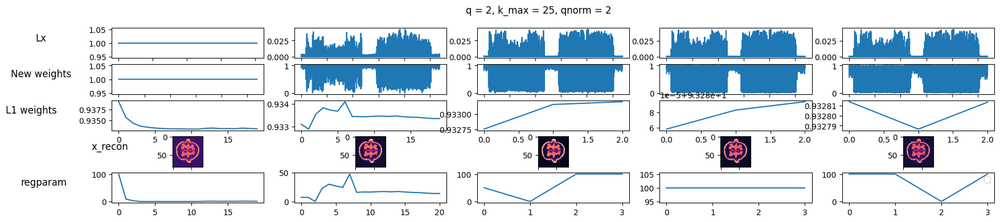

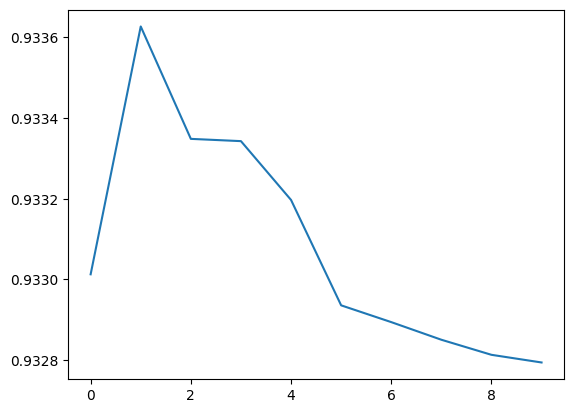

In [ ]:
x_t, infos, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b.flatten(order='F').reshape(-1,1) , x_true, L, nx, ny, delta,
    N=10, n_iter_first=20, n_iter_rest=20,
    q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=5, non_neg=False, epsilon = 1e-2, tolambdah=1e-6, break_ = True, break_tol=1e-6, d_limit=1e-3, use_non_neg = True
)

running MMGKS...: 100%|██████████| 600/600 [01:09<00:00,  8.66it/s]


0.10377507434496887


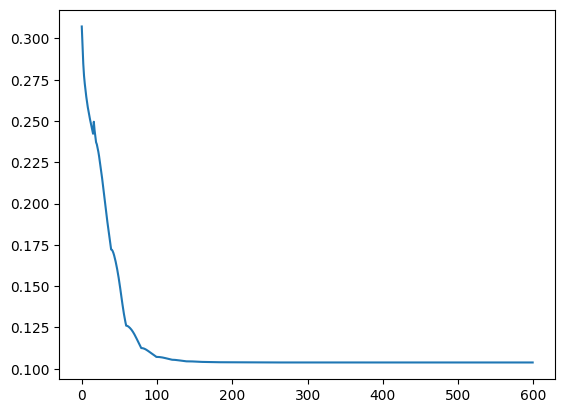

In [ ]:
n_iter=600
pd = 5
mov = 20
x_t_,info_t,V_t_,l_t = RMMGKS(A, b.flatten(order='F').reshape((-1,1)), L, pnorm=2, qnorm=1, projection_dim=pd,
                n_iter = n_iter, regparam ='dp', x_true = x_true.reshape((-1,1)), epsilon=1e-2,delta=delta,non_neg=False,power=0.5,x0=None, #np.zeros(x_true.shape),#None,
                V0= None,kmin=pd, l_max = pd+mov,l_curve_plot=False,
                compute_V=False, tqdm_=True, lambdah=0,tolambdah=1e-6, break_ = False, break_check=1e-6, break_tol=1e-6) 

#print(V_t.shape)
plt.plot(info_t['relError'])  
print(info_t['relError'][-1])

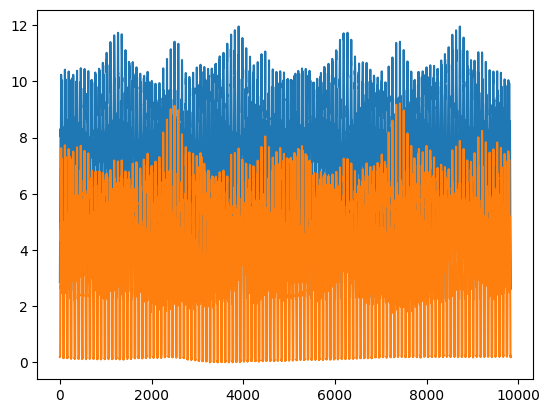

In [ ]:
plt.plot(A@x_true, label = 'true data')
plt.plot(b.flatten(order='F')*10, label = 'true data')

In [ ]:
import skimage
import scipy.io
data = scipy.io.loadmat('C:\\Users\\okuno\\Downloads\\Data82.mat')
gt = scipy.io.loadmat('C:\\Users\\okuno\\Downloads\\GroundTruthReconstruction.mat')
A = data['A']
b = data['m']
x_true = skimage.transform.resize(gt['FBP1200'], (82,82), anti_aliasing=True).T.reshape(-1,1)
nx,ny= 82,82

In [ ]:
x_true.shape

(82, 82)

In [ ]:
16384**0.5

128.0

In [ ]:
def compute_weights_1d(Lx, D, d_prev, q):

    weighted_grad_flat = (D @ Lx).flatten()
    
    # Normalization
    norm_inf = np.max(np.abs(weighted_grad_flat))
    g = np.abs(weighted_grad_flat) / norm_inf
    
    # Compute new weights
    d_new = 1 - np.power(g, q)
    
    # Update weights
    d = d_new * d_prev
    d = np.clip(d, 1e-3, 1)
    d_ = 1/ (np.abs(Lx).flatten()**2+0.01**2)**0.25
    
    return d, d_, g


def iterative_reconstruction_1d(A, b, x_true, L_, nx, ny, delta,
                                N=20, n_iter_first=100, n_iter_rest=100,
                                q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
                                pd=5, mov=20, rg='dp', n_fig=10, non_neg=True, epsilon = 1e-2):

    # Initialize
    x_t = np.ones((nx, ny))
    V_t = None
    l_t = None
    q = q_init
    n_iter = n_iter_first
    
    L = 1 * L_

    Lx = np.ones(nx)
    g = np.zeros(L.shape[0])
    d = np.ones(L.shape[0])
    d_ = deepcopy(d)
    D = sparse.diags(d)
    
    n_ = N // n_fig
    j = 0
    figure, ax = plt.subplots(5, n_fig, figsize=(20, 4))
    
    infos = []
    ratios_ = []
    ress = []
    sums = []
    qs = []
    rres = []
    
    for ii in range(N):
        if ii > 0:
            D_prev = deepcopy(D)
            d_prev = deepcopy(d)
            
            Lx = L @ x_t
            
            # Compute weights
            d, d_,g = compute_weights_1d(Lx, D, d_prev, q)
            
            # Track sum changes
            current_sum = np.sum(d)
            previous_sum = np.sum(d_prev)
            actual_decay = (previous_sum - current_sum) / current_sum
            
            # Adaptive q adjustment
            # if adaptive_q:
            #     if actual_decay < 0.01:
            #         q = q * 0.99  # Too slow, sharpen more
            #         qs.append(q)
            #     elif actual_decay > 0.05:
            #         q = q * 1.01  # Too fast, risk of false edges
            #         d = d_prev
            #     else:
            #         q = q  # Just right
            #         qs.append(q)
            
            D = sparse.diags(d)
        
        # Reconstruction step
        x_t, info_t, V_t, l_t = MMGKS_rec_break(
            A, b.flatten(order='F').reshape((-1, 1)), D @ L,
            pnorm=pnorm, qnorm=qnorm, projection_dim=pd,
            n_iter=n_iter, regparam=rg, x_true=x_true.reshape((-1, 1)),
            epsilon=epsilon, delta=delta, non_neg=non_neg, power=0.5, x0=x_t,
            V0=V_t[:, :pd] if V_t is not None else None,
            kmin=pd, l_max=pd + mov, l_curve_plot=False,
            compute_V=False, tqdm_=False, lambdah=0
        )
        
        # Collect metrics
        infos.append(info_t)
        sums.append(np.sum(d))
        ratios_.append(la.norm(D @ L @ x_t) / la.norm(L @ x_t))
        ress.append(la.norm(A @ x_t - b))
        rres.append(info_t['relError'][-1])
        
        print('Outer Iteration', ii, ': RRE', info_t['relError'][-1])
        print(la.norm(A @ x_t - b), la.norm(L @ x_t),
              la.norm(D @ L @ x_t), la.norm(D @ L @ x_t) / la.norm(L @ x_t))
        
        # Visualization
        if ((ii % n_) == 0):
            # ax[0,j].plot(g[:])
            # ax[1,j].plot(np.power(g, q)[:])
            # ax[2,j].plot(d[:])
            ax[0, j].plot(np.abs(Lx)[:])
            ax[1, j].plot(d[:])
            ax[2, j].plot(d_[:])
            ax[3, j].plot(x_true.flatten(), label = 'X_true')
            ax[3, j].plot(x_t.flatten(),'--')
            
            if ii > 0:
                ax[4, j].plot(info_t['regParam_history'])
            j += 1
            plt.legend()
    
    figure.suptitle(f'q = {q}, k_max = {pd + mov}, qnorm = {qnorm}')
    print('TOTAL ITER:', np.sum([len(info['regParam_history']) for info in infos]))
    row_titles = ["Lx", "New weights", "L1 weights", 'x_recon', 'regparam']
    for i, title in enumerate(row_titles):
        ax[i, 0].set_ylabel(title, rotation=0, labelpad=60, fontsize=12)
    plt.figure()
    plt.plot(rres)
    return x_t, infos, ratios_, rres, ress, sums, qs, figure, ax


# Call the function
# x_t, infos, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
#     A, b, x_true, L_, nx, ny, delta,
#     N=4, n_iter_first=50, n_iter_rest=50,
#     q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
#     pd=5, mov=100, rg='gcv', n_fig=4, non_neg=True
# )

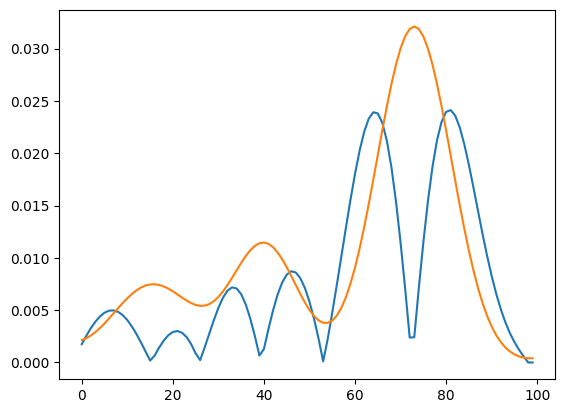

In [ ]:
plt.plot(np.abs(L@(A.T@b)), label = 'A^T b')
plt.plot(np.abs(A.T@b)/10, label = 'A^T b')

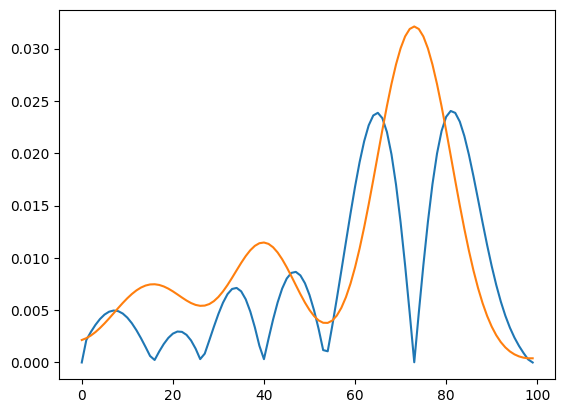

In [ ]:
plt.plot(np.abs(L__@(A.T@b)), label = 'A^T b')
plt.plot(np.abs(A.T@b)/10, label = 'A^T b')

In [ ]:
L__= pylops.FirstDerivative(nx, dtype="float32")

In [ ]:
L= pylops.SecondDerivative(nx, dtype="float32")

In [ ]:
L.shape

(20, 20)

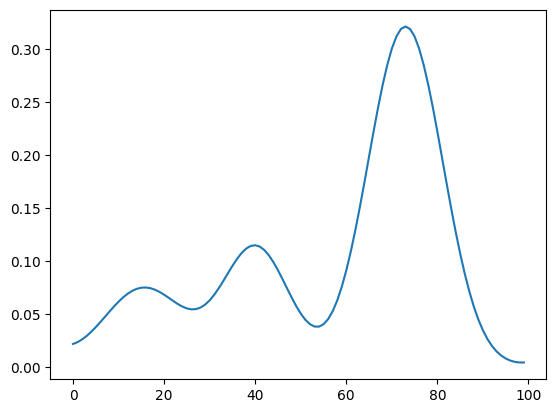

In [ ]:
plt.plot(np.abs(A.T@b), label = 'A^T b')

In [ ]:
def compute_weights_1d(Lx, D, d_prev, q):

    weighted_grad_flat = (D @ Lx).flatten()
    
    # Normalization
    norm_inf = np.max(np.abs(weighted_grad_flat))
    g = np.abs(weighted_grad_flat) / norm_inf
    
    # Compute new weights
    d_new = 1 - np.power(g, q)
    
    # Update weights
    d = d_new * d_prev
    d = np.clip(d, 1e-3, 1)
    d_ = 1/ (np.abs(Lx).flatten()**2+0.01**2)**0.25
    
    return d, d_, g


def iterative_reconstruction_1d(A, b, x_true, L_, nx, ny, delta,
                                N=20, n_iter_first=100, n_iter_rest=100,
                                q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
                                pd=5, mov=20, rg='dp', n_fig=10, non_neg=True, epsilon = 1e-2):

    # Initialize
    x_t = np.ones((nx, ny)) #A.T@b # np.zeros((nx, ny)) #A.T@b #np.ones((nx, ny))
    V_t = None
    l_t = None
    q = q_init
    n_iter = n_iter_first
    
    L = 1 * L_

    Lx = np.ones(nx)
    g = np.zeros(L.shape[0])
    d = np.ones(L.shape[0])
    d_ = deepcopy(d)
    D = sparse.diags(d)
    
    n_ = N // n_fig
    j = 0
    figure, ax = plt.subplots(5, n_fig, figsize=(20, 4))
    
    infos = []
    ratios_ = []
    ress = []
    sums = []
    qs = []
    rres = []
    
    for ii in range(N):
        if ii > 0:
            D_prev = deepcopy(D)
            d_prev = deepcopy(d)
            
            Lx = L__ @ x_t
            
            # Compute weights
            d, d_,g = compute_weights_1d(Lx, D, d_prev, q)
            
            # Track sum changes
            current_sum = np.sum(d)
            previous_sum = np.sum(d_prev)
            actual_decay = (previous_sum - current_sum) / current_sum
            
            # Adaptive q adjustment
            # if adaptive_q:
            #     if actual_decay < 0.01:
            #         q = q * 0.99  # Too slow, sharpen more
            #         qs.append(q)
            #     elif actual_decay > 0.05:
            #         q = q * 1.01  # Too fast, risk of false edges
            #         d = d_prev
            #     else:
            #         q = q  # Just right
            #         qs.append(q)
            
            D = sparse.diags(d)
        
        # Reconstruction step
        x_t, info_t, V_t, l_t = MMGKS_rec_break(
            A, b.flatten(order='F').reshape((-1, 1)), D @ L,
            pnorm=pnorm, qnorm=qnorm, projection_dim=pd,
            n_iter=n_iter, regparam=rg, x_true=x_true.reshape((-1, 1)),
            epsilon=epsilon, delta=delta, non_neg=non_neg, power=0.5, x0=x_t,
            V0=V_t[:, :pd+mov-1] if V_t is not None else None,
            kmin=pd, l_max=pd + mov, l_curve_plot=False,
            compute_V=False, tqdm_=False, lambdah=0, tolambdah=1e-6
        )
        
        # Collect metrics
        infos.append(info_t)
        sums.append(np.sum(d))
        ratios_.append(la.norm(D @ L @ x_t) / la.norm(L @ x_t))
        ress.append(la.norm(A @ x_t - b))
        rres.append(info_t['relError'][-1])
        
        print('Outer Iteration', ii, ': RRE', info_t['relError'][-1])
        print(la.norm(A @ x_t - b), la.norm(L @ x_t),
              la.norm(D @ L @ x_t), la.norm(D @ L @ x_t) / la.norm(L @ x_t))
        
        # Visualization
        if ((ii % n_) == 0):
            # ax[0,j].plot(g[:])
            # ax[1,j].plot(np.power(g, q)[:])
            # ax[2,j].plot(d[:])
            ax[0, j].plot(np.abs(Lx)[:])
            ax[1, j].plot(d[:])
            ax[2, j].plot(d_[:])
            ax[3, j].plot(x_true.flatten(), label = 'X_true')
            ax[3, j].plot(x_t.flatten(),'--')
            
            if ii > 0:
                ax[4, j].plot(info_t['regParam_history'])
            j += 1
            plt.legend()
    
    figure.suptitle(f'q = {q}, k_max = {pd + mov}, qnorm = {qnorm}')
    print('TOTAL ITER:', np.sum([len(info['regParam_history']) for info in infos]))
    row_titles = ["Lx", "New weights", "L1 weights", 'x_recon', 'regparam']
    for i, title in enumerate(row_titles):
        ax[i, 0].set_ylabel(title, rotation=0, labelpad=60, fontsize=12)
    plt.figure()
    plt.plot(rres)
    return x_t, infos, ratios_, rres, ress, sums, qs, figure, ax


# Call the function
# x_t, infos, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
#     A, b, x_true, L_, nx, ny, delta,
#     N=4, n_iter_first=50, n_iter_rest=50,
#     q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
#     pd=5, mov=100, rg='gcv', n_fig=4, non_neg=True
# )

In [ ]:
def compute_weights_1d(Lx, D, d_prev, q):

    weighted_grad_flat = (D @ Lx).flatten()
    
    # Normalization
    norm_inf = np.max(np.abs(weighted_grad_flat))
    g = np.abs(weighted_grad_flat) / norm_inf
    
    # Compute new weights
    d_new = 1 - np.power(g, q)
    
    # Update weights
    d = d_new * d_prev
    d = np.clip(d, 1e-3, 1)
    d_ = 1/ (np.abs(Lx).flatten()**2+0.01**2)**0.25
    
    return d, d_, g


def iterative_reconstruction_1d(A, b, x_true, L_, nx, ny, delta,
                                N=20, n_iter_first=100, n_iter_rest=100,
                                q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
                                pd=5, mov=20, rg='dp', n_fig=10, non_neg=True, epsilon = 1e-2):

    # Initialize
    x_t = np.ones((nx, ny)) #A.T@b # np.zeros((nx, ny)) #A.T@b #np.ones((nx, ny))
    V_t = None
    l_t = None
    q = q_init
    n_iter = n_iter_first
    
    L = 1 * L_

    Lx = np.ones(nx)
    g = np.zeros(L.shape[0])
    d = np.ones(L.shape[0])
    d_ = deepcopy(d)
    D = sparse.diags(d)
    
    n_ = N // n_fig
    j = 0
    figure, ax = plt.subplots(5, n_fig, figsize=(20, 4))
    
    infos = []
    ratios_ = []
    ress = []
    sums = []
    qs = []
    rres = []
    
    for ii in range(N):
        if ii > 0:
            D_prev = deepcopy(D)
            d_prev = deepcopy(d)
            
            Lx = L @ x_t
            
            # Compute weights
            d, d_,g = compute_weights_1d(Lx, D, d_prev, q)
            
            # Track sum changes
            current_sum = np.sum(d)
            previous_sum = np.sum(d_prev)
            actual_decay = (previous_sum - current_sum) / current_sum
            
            # Adaptive q adjustment
            # if adaptive_q:
            #     if actual_decay < 0.01:
            #         q = q * 0.99  # Too slow, sharpen more
            #         qs.append(q)
            #     elif actual_decay > 0.05:
            #         q = q * 1.01  # Too fast, risk of false edges
            #         d = d_prev
            #     else:
            #         q = q  # Just right
            #         qs.append(q)
            
            D = sparse.diags(d)
        
        # Reconstruction step
        x_t, info_t, V_t, l_t = MMGKS_rec12(
            A, b.flatten(order='F').reshape((-1, 1)), D @ L,
            pnorm=pnorm, qnorm=qnorm, projection_dim=pd,
            n_iter=n_iter, regparam=rg, x_true=x_true.reshape((-1, 1)),
            epsilon=epsilon, delta=delta, non_neg=non_neg, power=0.5, x0=x_t,
            V0=V_t[:, :] if V_t is not None else None,
            kmin=pd, l_max=pd + mov, l_curve_plot=False,
            compute_V=False, tqdm_=False, lambdah=0, tolambdah=1e-6
        )
        
        # Collect metrics
        infos.append(info_t)
        sums.append(np.sum(d))
        ratios_.append(la.norm(D @ L @ x_t) / la.norm(L @ x_t))
        ress.append(la.norm(A @ x_t - b))
        rres.append(info_t['relError'][-1])
        
        print('Outer Iteration', ii, ': RRE', info_t['relError'][-1])
        print(la.norm(A @ x_t - b), la.norm(L @ x_t),
              la.norm(D @ L @ x_t), la.norm(D @ L @ x_t) / la.norm(L @ x_t))
        
        # Visualization
        if ((ii % n_) == 0):
            # ax[0,j].plot(g[:])
            # ax[1,j].plot(np.power(g, q)[:])
            # ax[2,j].plot(d[:])
            ax[0, j].plot(np.abs(Lx)[:])
            ax[1, j].plot(d[:])
            ax[2, j].plot(d_[:])
            ax[3, j].plot(x_true.flatten(), label = 'X_true')
            ax[3, j].plot(x_t.flatten(),'--')
            
            if ii > 0:
                ax[4, j].plot(info_t['regParam_history'])
            j += 1
            plt.legend()
    
    figure.suptitle(f'q = {q}, k_max = {pd + mov}, qnorm = {qnorm}')
    print('TOTAL ITER:', np.sum([len(info['regParam_history']) for info in infos]))
    row_titles = ["Lx", "New weights", "L1 weights", 'x_recon', 'regparam']
    for i, title in enumerate(row_titles):
        ax[i, 0].set_ylabel(title, rotation=0, labelpad=60, fontsize=12)
    plt.figure()
    plt.plot(rres)
    return x_t, infos, ratios_, rres, ress, sums, qs, figure, ax


# Call the function
# x_t, infos, ratios_, rres_, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
#     A, b, x_true, L_, nx, ny, delta,
#     N=4, n_iter_first=50, n_iter_rest=50,
#     q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
#     pd=5, mov=100, rg='gcv', n_fig=4, non_neg=True
# )

In [ ]:
L_ = L

Outer Iteration 0 : RRE 0.22167269397720368
0.042343449925523774 0.4727802726452674 0.4727802726452674 1.0


C:\Users\okuno\AppData\Local\Temp\ipykernel_23548\4035886899.py:116: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.19170394208024558
0.044186465419440345 0.7596858952537436 0.16705611201113177 0.21990155807135678
Outer Iteration 2 : RRE 0.1946294478445228
0.04576316110624749 0.7879035925932198 0.06541518404390882 0.08302435051553507
Outer Iteration 3 : RRE 0.19268786411696637
0.040267938486139035 0.7995887127621732 0.0353766865310403 0.04424360420100454
Outer Iteration 4 : RRE 0.19625100337454798
0.042868463522506395 0.801889206454551 0.012943332518653029 0.016141048432214585
Outer Iteration 5 : RRE 0.19623970804078905
0.042685493590022376 0.8020467878454143 0.007699726222238895 0.009600096077839954
Outer Iteration 6 : RRE 0.19669610524823547
0.04343966063638808 0.8025581715381613 0.00508932666707396 0.006341380410244773
Outer Iteration 7 : RRE 0.1972001899977817
0.042619666802116346 0.8003511824781887 0.0008974921185933389 0.0011213728901035233
Outer Iteration 8 : RRE 0.1975758612010156
0.04385633877888229 0.800881146942969 0.0009150964941580008 0.001142612106241983
Outer

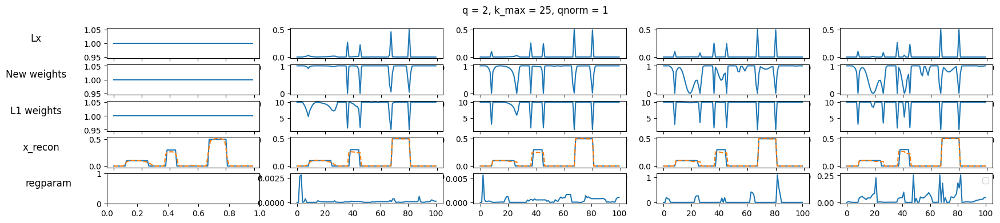

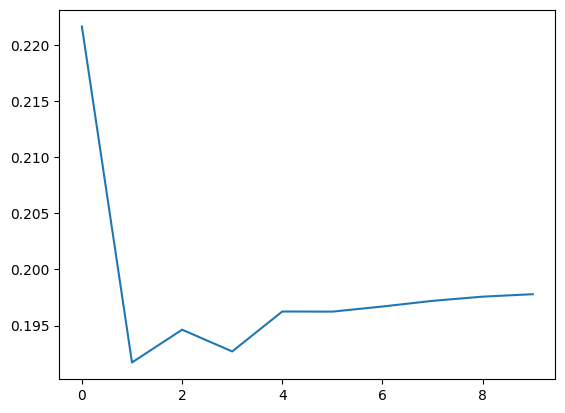

In [ ]:
x_t__, infos, ratios_, rres__, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L, nx, ny, delta,
    N=10, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=5, non_neg=True,epsilon=1e-2
)

Outer Iteration 0 : RRE 0.3020143371934343
0.08505062747120036 0.333002487034865 0.333002487034865 1.0


C:\Users\okuno\AppData\Local\Temp\ipykernel_23548\3639352062.py:116: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.21762793780953305
0.049294930517845954 0.4594199812155048 0.1523005763540504 0.331506209092393
Outer Iteration 2 : RRE 0.14749562718917897
0.034592581841143 0.6802623660187092 0.053538209645370746 0.07870229534923044
Outer Iteration 3 : RRE 0.15184307561602597
0.03131039811722176 0.7628303075935423 0.023136381728943476 0.030329657197195683
Outer Iteration 4 : RRE 0.15894833801150104
0.03150070154677801 0.7724594651652217 0.006858222433092939 0.008878423713309061
Outer Iteration 5 : RRE 0.12264034468463558
0.02694687990424678 0.7492718320800463 0.005905491140901346 0.007881640398127832
Outer Iteration 6 : RRE 0.11245477086245831
0.02628853007958507 0.758714742230725 0.002006164822856425 0.002644162174782615
Outer Iteration 7 : RRE 0.1089909569500171
0.026455987112443864 0.7560670751332309 0.0010633147577866627 0.0014063762234313535
Outer Iteration 8 : RRE 0.10802173970562047
0.026322763337018946 0.7558352105450644 0.0008807411163310362 0.0011652554737373202
Out

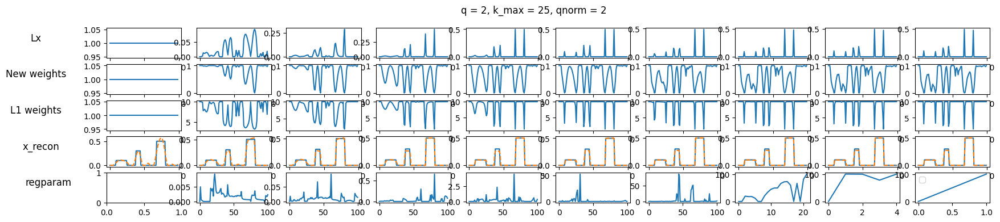

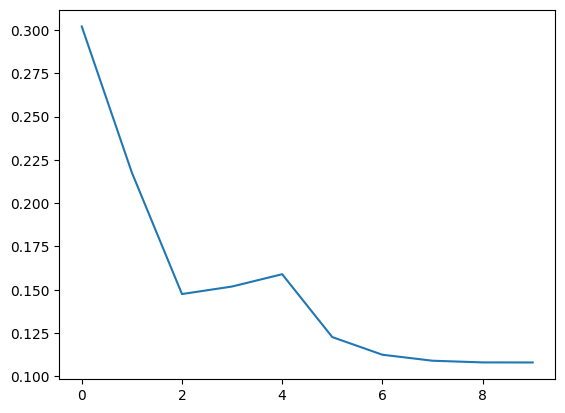

In [ ]:
x_t__, infos, ratios_, rres__, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L_, nx, ny, delta,
    N=10, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=2, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=10, non_neg=True, epsilon=1e-3
)

Outer Iteration 0 : RRE 0.2557919320623856
0.03604336692497656 0.39934325222523237 0.39934325222523237 1.0
Outer Iteration 1 : RRE 0.21944084928089497
0.03232974710709002 0.6301285116910872 0.11081321564180778 0.17585812034503306


C:\Users\okuno\AppData\Local\Temp\ipykernel_23548\3639352062.py:116: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 2 : RRE 0.19652155431559884
0.03545596131028476 0.7554550993648027 0.05038181781564207 0.06669068467206564
Outer Iteration 3 : RRE 0.19163648954787266
0.02785643460732269 0.7670691700677349 0.02561905645510775 0.0333986261667191
Outer Iteration 4 : RRE 0.18769846052738265
0.02471088667452292 0.7799433439605917 0.006001104186903946 0.00769428219802484
Outer Iteration 5 : RRE 0.18756863593657858
0.024911402534737948 0.783382765400079 0.0019951619640747194 0.0025468545546260216
Outer Iteration 6 : RRE 0.1875057801246621
0.024334718960497652 0.7835040880538118 0.0013404291381914322 0.0017108132026738964
Outer Iteration 7 : RRE 0.18755723712628455
0.02525487678699039 0.7844980537947766 0.0012590147998828801 0.001604866696345223
Outer Iteration 8 : RRE 0.18757780760487236
0.025567932536264288 0.7843457094500835 0.001132627371791353 0.0014440410116929878
Outer Iteration 9 : RRE 0.18763139965042716
0.026054402963851815 0.78431094595141 0.0010640192794463947 0.001356629389069259

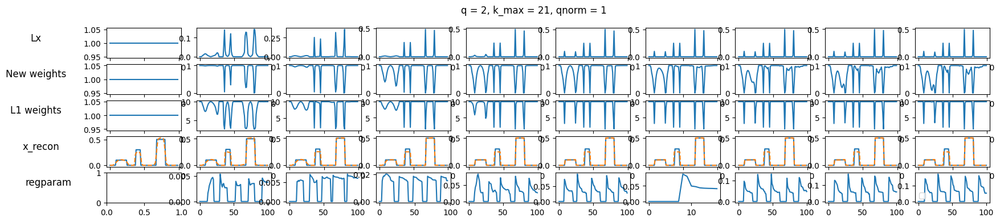

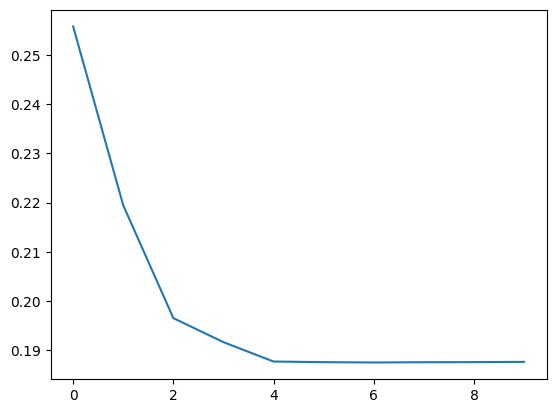

In [ ]:
x_t__, infos, ratios_, rres__, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L_, nx, ny, delta,
    N=10, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=1, mov=20, rg='dp', n_fig=10, non_neg=True, epsilon=1e-2
)

Outer Iteration 0 : RRE 0.22656435118479876
0.006842562011626469 0.44173582625529845 0.44173582625529845 1.0


C:\Users\okuno\AppData\Local\Temp\ipykernel_23548\3639352062.py:116: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.127735192063957
0.0067202158422995486 0.6279137337382489 0.16836845664024627 0.2681394713854628
Outer Iteration 2 : RRE 0.06204340653506887
0.006719930381544735 0.8059785932587454 0.04670452396958064 0.0579475985593416
Outer Iteration 3 : RRE 0.05333461715340202
0.006703823116055188 0.8212844049057695 0.02320483656781201 0.028254325090313177
Outer Iteration 4 : RRE 0.0456404982385947
0.0072131121971884225 0.8364447617561255 0.006699826165911313 0.00800988477929487
TOTAL ITER: 505


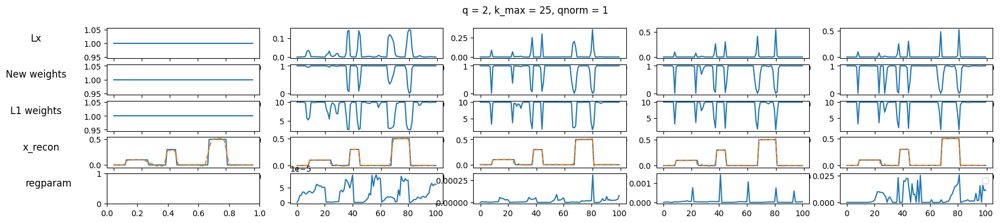

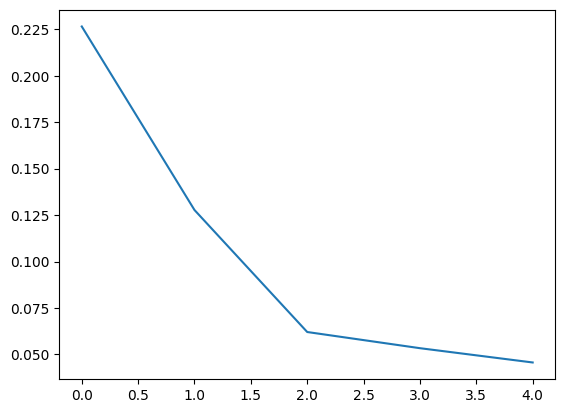

In [ ]:
x_t__, infos, ratios_, rres__, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L_, nx, ny, delta,
    N=5, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=5, non_neg=False, epsilon=1e-3
)

Outer Iteration 0 : RRE 0.23372345127173455
0.006860853131131938 0.40819487498868856 0.40819487498868856 1.0


C:\Users\okuno\AppData\Local\Temp\ipykernel_23548\3639352062.py:116: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.15039954935550973
0.006707289324458089 0.5146255050538578 0.1669186050562187 0.3243496550734498
Outer Iteration 2 : RRE 0.10760115965410678
0.00680466684362035 0.5536085656200138 0.08772680634318174 0.1584636000798364
Outer Iteration 3 : RRE 0.09177388180687938
0.006669974095500826 0.5878508664088291 0.03788092081835818 0.06443967846772443
Outer Iteration 4 : RRE 0.09051470587300907
0.0066713913133935165 0.5906604423105399 0.02080619454969305 0.035225305538159245
Outer Iteration 5 : RRE 0.09279682125463816
0.006671334721440009 0.5908174218567263 0.008068318175775545 0.01365619542907135
Outer Iteration 6 : RRE 0.09480744331804274
0.006670825418774634 0.5891052297932852 0.004594278364126907 0.007798739735749794
Outer Iteration 7 : RRE 0.09549993677596932
0.006669692229364731 0.5911306714235443 0.0024190149512244596 0.004092183113082351
Outer Iteration 8 : RRE 0.08886190319861483
0.0068288032981548025 0.5931163208395773 0.0008030663513550788 0.0013539778339235543

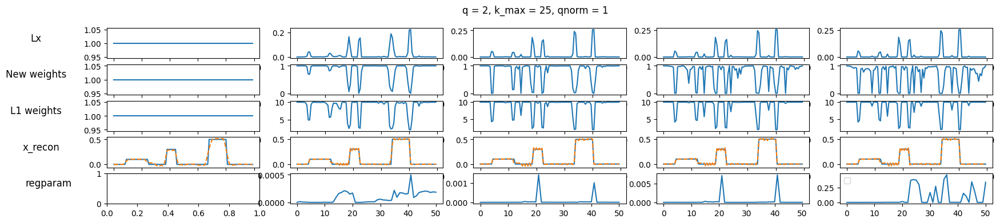

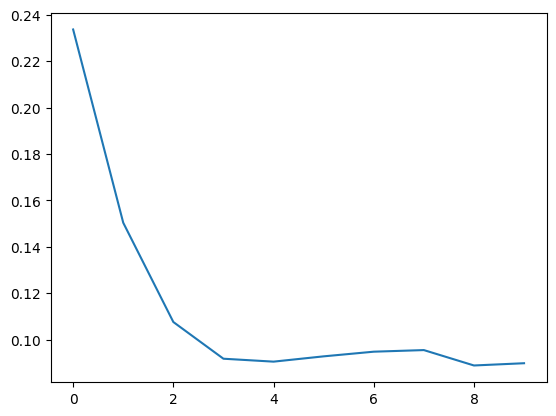

In [ ]:
x_t__, infos, ratios_, rres__, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L__.tosparse(), nx, ny, delta,
    N=10, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=5, non_neg=False, epsilon=1e-3
)

Outer Iteration 0 : RRE 0.9332033616773117
0.6696477190584975 5.4932358813063404e-05 5.4932358813063404e-05 1.0
Outer Iteration 1 : RRE 0.9955815574132133
0.8436505427725519 0.001961577992237565 0.0014371289670393273 0.7326392183876408


C:\Users\okuno\AppData\Local\Temp\ipykernel_23548\3639352062.py:116: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 2 : RRE 0.3776298510581803
0.003928367734962235 0.44864686434279155 0.17288211628287561 0.38534118930291666
Outer Iteration 3 : RRE 0.3675766899952849
0.004790910235689368 0.4320323369696802 0.06862662345493277 0.1588460343878124
Outer Iteration 4 : RRE 0.34703293458104845
0.0046093405373550285 0.4561988735354801 0.027244013279189145 0.059719597876364085
Outer Iteration 5 : RRE 0.3510287964081246
0.004418064538911647 0.516112630537843 0.011285491461401908 0.02186633458212649
Outer Iteration 6 : RRE 0.40434637743593754
0.004394797557401956 0.5585785635491691 0.006265643081664758 0.011217120545860729
Outer Iteration 7 : RRE 0.4443567018413511
0.0042507227904078695 0.5685378699407324 0.002851662567694208 0.005015782973245883
Outer Iteration 8 : RRE 0.46031610248285254
0.0042963444767329904 0.5715421579444595 0.0015419092322412073 0.0026978048964693252
Outer Iteration 9 : RRE 0.4776446539026837
0.004259033705509172 0.5824592743972314 0.001034375780289437 0.00177587657327609

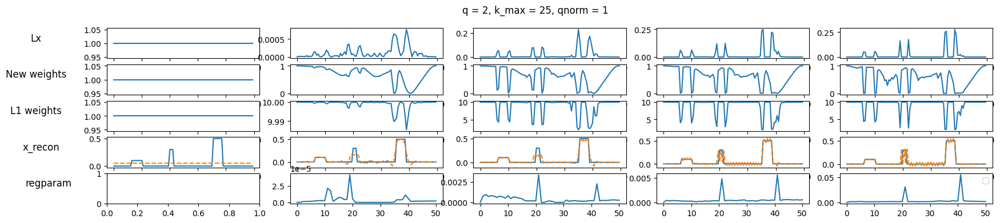

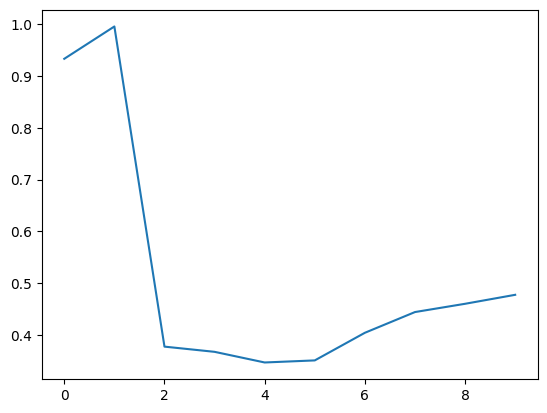

In [ ]:
x_t__, infos, ratios_, rres__, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L__.tosparse(), nx, ny, delta,
    N=10, n_iter_first=50, n_iter_rest=50,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=5, non_neg=False, epsilon=1e-3
)

Outer Iteration 0 : RRE 0.8613538095403318
1.088690465239784 9.315086176242573e-05 9.315086176242573e-05 1.0


C:\Users\okuno\AppData\Local\Temp\ipykernel_23548\2194950515.py:116: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Outer Iteration 1 : RRE 0.23194690797554984
0.00653444974471123 0.416432691949008 0.30614149117944717 0.7351523958088623
Outer Iteration 2 : RRE 0.18815422863251585
0.006454813894682752 0.5507270287387972 0.11905738495538157 0.21618220777729244
Outer Iteration 3 : RRE 0.30657523555690036
0.006441244786086607 0.6334878343742619 0.05016518734967598 0.07918887250491159
Outer Iteration 4 : RRE 0.3952766862451166
0.006501287561733746 0.6755445724329032 0.021597692609612786 0.031970788443804604
Outer Iteration 5 : RRE 0.40060073692371556
0.006469527628758088 0.672581654961951 0.011322521940398315 0.01683441981634014
Outer Iteration 6 : RRE 0.3972536685514836
0.0065140666555647255 0.6678072328864428 0.0053306867351445904 0.007982373464426143
Outer Iteration 7 : RRE 0.39802804987324947
0.0065366856357620936 0.668533595675488 0.0026432484973077765 0.003953800548552884
Outer Iteration 8 : RRE 0.40126456842072394
0.006573184941448159 0.6711375421627127 0.0012989812217258593 0.001935491818174776
O

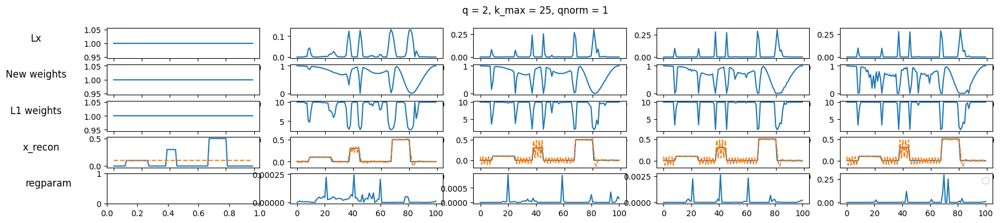

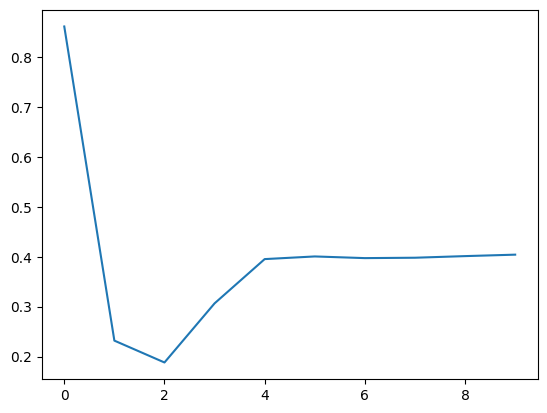

In [ ]:
x_t__, infos, ratios_, rres__, ress, sums, qs, figure, ax = iterative_reconstruction_1d(
    A, b, x_true, L__.tosparse(), nx, ny, delta,
    N=10, n_iter_first=100, n_iter_rest=100,
    q_init=2, adaptive_q=False, qnorm=1, pnorm=2,
    pd=5, mov=20, rg='gcv', n_fig=5, non_neg=False, epsilon=1e-3
)